# Classification of Defective Solar Panels

- classification using models
- tasks: hyper parameter tuning for classification models
    - focus on XGboost - best results so far
    - Adaboost discontinued
    - eventually ANN and Balanced Random Forest - best results so far
    - eventually search for alternative suitable models
>

## Background

- solar energy production data
    - solar energy production in Goerlitz (GR)
    - group 3 (H) (`pv3`) with defective times labelled (`pv3_defect`)
    - information on sensor (old = 0 = higher precision)  
      &rarr; has to be excluded here, as no defects after sensor was exchanged
    - weather data associated
    - daily or weekly aggregated data
    - categorical data already dummified in model_data
>
- weather features (aggregated for weekly data)

    Abbreviation | column name | aggregation
    --- | --- | ---
    MESS_DATUM | date | -
    FX | max_windgust | mean
    FM | mean_wind_velocity | mean
    RSK | precipitation_height | mean
    SDK | sunshine_duration | mean
    SHK_TAG | snow_depth | mean
    NM | mean_cloud_cover | mean
    VPM | mean_vapor_pressure | mean
    PM | mean_pressure | mean
    TMK | mean_temperature | mean
    UPM | mean_relative_humidity | mean
    ||
    RSKF | precipitation_form | mode
    ||
    TXK | max_temperature | mean, max
    TNK | min_temperature | mean, min
    TGK | min_air_temperature | mean, min
>
- solar data daily or aggregated weekly

    column name | aggregation
    --- | --- 
    pv | mean
    pv3_defect | mode
    sensor | mode 
>
- defective time windows + known repairs
    - 3 time intervals with malfunctions
    - defects labelled semi-manually using error metrics + manual inspection

    ```py
    # time ranges include first and last day with defects
    defect_ranges_group3 = [(datetime(2009,10, 4), datetime(2011,6, 9)),
                            (datetime(2011,10,10), datetime(2012,3,15)),
                            (datetime(2016, 5,22), datetime(2016,6,27))]
    ```
    ```py
    repairs_group3 = ["09.06.2011", "27.06.2016",]
    ```
>

## Approach

- model defects from 
    - solar production
    - weather features
    - excluded: sensor (exchanged after defective periods)
- train-test split using stratification due to imbalanced data
- hyperparameter tuning for XGboost modelling 
    - different grids and different random seeds - run multiple times
    - various quality metrics
    - optimization for recall and f1 score
    - inspection of 3 exemplary models with good f1 and recall score
- general issue from classification 
    - some false negatives
    - quite many false positives (>= 50% of reported defects are FP)
- solution approach
    - defects are persistent &rarr; accumulate defect predictions and apply threshold
    - reduces FP rate dramatically
    - but: introduces lag (as defect predictions need to accumulate to pass threshold)
>
- here: all weather features


## Preparations

In [1]:
# load required packages
from IPython.display import display
from datetime import datetime
from tqdm import tqdm
import matplotlib.pyplot as plt
import plotly.express as px
import scipy.stats as stats
import missingno as msno
import seaborn as sns
import pandas as pd
import numpy as np
import sys
import os

# general modelling packages
sys.path.insert(0, '..') # required to import models.tools
from models.tools import show_info, add_date_features, compute_importance
# other available tools: get_alerts, dump_missing, parse_xml, plot_correlation, drop_na_and_zeros, get_common_index
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# classifier packages
from xgboost import XGBClassifier
from xgboost import Booster, DMatrix

# metrics packages
from sklearn.metrics import roc_curve, roc_auc_score, ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score
from sklearn.metrics import precision_recall_curve, auc
from sklearn.metrics import recall_score, f1_score

# neural network packages
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from tensorflow.keras import metrics

import keras 
from keras.models import Sequential # intitialize the ANN
from keras.layers import Dense, Activation, Dropout      # create layers

In [2]:
RSEED = 42
np.random.seed(RSEED)
tf.random.set_seed(RSEED)

In [3]:
# ranges of malfunctioning for group 3 (H)
defect_ranges3 = [(datetime(2009,10, 4), datetime(2011,6, 9)),
                  (datetime(2011,10,10), datetime(2012,3,15)),
                  (datetime(2016, 5,22), datetime(2016,6,27))]
                  
idx_maintenance_g3 = [
    "09.06.2011", # H repair - group 3
    "27.06.2016", # H repair - group 3
    ]

lw = 2 # line width

model_path1 = "../data/pv_households/GR/classification_models1_all_feats/"
model_path2 = "../data/pv_households/GR/classification_models2_all_feats/"

logfile1 = "GridSearch_log.txt"
logfile2 = "GridSearch2_log.txt"

for dir in (model_path1, model_path2):
    if not os.path.exists(dir):
        os.makedirs(dir)

In [4]:
# functions to evaluate classification results
def plot_confusion_matrix(y_true, y_pred, title=""):
    """plot confusion matrix"""

    # calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # customize output image
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    fig, ax = plt.subplots(figsize=(3,3))
    disp.plot(ax=ax)
    disp.ax_.set_title(title)
    plt.show()

def plot_roc_curve(y_train, y_train_pred, y_test, y_test_pred):
    """plot ROC curve for train and test data"""

    # calculate require values for ROC curve
    fpr_model1, tpr_model1, thresholds_model1 = roc_curve(y_train, y_train_pred)
    fpr_model2, tpr_model2, thresholds_model2 = roc_curve(y_test, y_test_pred)
    auc_model1 = roc_auc_score(y_train, y_train_pred)
    auc_model2 = roc_auc_score(y_test, y_test_pred)

    # customize output image
    plt.subplots(figsize=(4,4))
    plt.plot(fpr_model1, tpr_model1,'r-',label = 'Train AUC: %.3f'%auc_model1)
    plt.plot(fpr_model2,tpr_model2,'b--', label= 'Test AUC: %.3f'%auc_model2)
    plt.plot([0,1],[0,1],'k-',label='random')
    plt.plot([0,0,1,1],[0,1,1,1],'g-',label='perfect')
    plt.legend()
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.show()

def plot_precision_recall_curve(X_train, X_test, y_train, y_test, model, neuralnet=False, xgb=False, outdir="", save_tag=""):
    """plot precision recall curve for train and test data"""

    # calculate class probabilities
    if neuralnet:
        # reshaping required in case of neural network
        # needs two columns which sum up to one - as np array
        y_pred_proba = model.predict(X_test)
        y_pred_proba = pd.DataFrame(y_pred_proba.T[0])
        y_pred_proba.columns = ["A"]
        y_pred_proba["B"] = 1-y_pred_proba["A"]
        y_pred_proba = np.array(y_pred_proba)

        y_pred_proba2 = model.predict(X_train)
        y_pred_proba2 = pd.DataFrame(y_pred_proba2.T[0])
        y_pred_proba2.columns = ["A"]
        y_pred_proba2["B"] = 1-y_pred_proba2["A"]
        y_pred_proba2 = np.array(y_pred_proba2)
    elif xgb:
        y_pred_proba2 = model.predict(DMatrix(X_train, y_train))
        y_pred_proba = model.predict(DMatrix(X_test, y_test))
        y_pred_proba = pd.DataFrame(y_pred_proba)
        y_pred_proba.columns = ["A"]
        y_pred_proba["B"] = 1-y_pred_proba["A"]

        y_pred_proba = np.array(y_pred_proba)
        y_pred_proba2 = pd.DataFrame(y_pred_proba2)
        y_pred_proba2.columns = ["A"]
        y_pred_proba2["B"] = 1-y_pred_proba2["A"]
        y_pred_proba2 = np.array(y_pred_proba2)
    else:
        # for conventional models (log reg, RF, XGboost, ...)
        y_pred_proba = model.predict_proba(X_test) 
        y_pred_proba2 = model.predict_proba(X_train)

        
    #retrieve probability of being 1(in second column of y_pred_proba)
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba[:, 1]) 
    precision2, recall2, thresholds2 = precision_recall_curve(y_train, y_pred_proba2[:, 1]) 

    # customize output image
    plt.subplots(figsize=(4,4))
    plt.title("Precision-Recall vs Threshold Chart")
    plt.plot(thresholds2, precision2[: -1], "b--", label="Precision Train")
    plt.plot(thresholds, precision[: -1], "b-", label="Precision Test")
    plt.plot(thresholds2, recall2[: -1], "r--", label="Recall Train")
    plt.plot(thresholds, recall[: -1], "r-", label="Recall Test")
    plt.axvline(0.5, color="gray", ls="--", alpha=0.5)
    plt.axhline(0.5, color="gray", ls="--", alpha=0.5)
    plt.ylabel("Precision, Recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper center")
    plt.ylim([0,1])
    if save_tag != "":
        plt.savefig(outdir+"_".join(["precision_recall", save_tag])+".png", format="png")
    plt.show()

def evaluate_model(y_train, y_test, X_train, X_test, model, 
                   neuralnet=False, xgb=False, plotting=True, save_tag="", outdir=""):
    """evaluate model with metrics and plots"""
    
    # predict on train and test data
    if xgb:
        y_train_pred = model.predict(DMatrix(X_train, y_train))
        y_test_pred = model.predict(DMatrix(X_test, y_test))
    else:
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)

    if neuralnet or xgb:
        # probabilities predicted
        y_train_pred = y_train_pred.round(0)
        y_test_pred = y_test_pred.round(0)
        
    # calculate metrics
    r1 = recall_score(y_train, y_train_pred)
    r2 = recall_score(y_test, y_test_pred)
    f1 = f1_score(y_train, y_train_pred)
    f2 = f1_score(y_test, y_test_pred)
    a1 = roc_auc_score(y_train, y_train_pred)
    a2 = roc_auc_score(y_test, y_test_pred)
    ac1 = accuracy_score(y_train, y_train_pred)
    ac2 = accuracy_score(y_test, y_test_pred)
    p1 = precision_score(y_train, y_train_pred)
    p2 = precision_score(y_test, y_test_pred)
    print("Recall Train:  ", r1)
    print("F1 Score Train:", f1)
    print("AUC Train:     ", a1)
    print("Train:\n%s\n" % confusion_matrix(y_train, y_train_pred))
    print("Recall Test:  ", r2)
    print("F1 Score Test:", f2)
    print("AUC Test:     ", a2)
    print("Test:\n%s\n" % confusion_matrix(y_test, y_test_pred))

    # plots for model evaluation
    if plotting:
        plot_confusion_matrix(y_train, y_train_pred, title="Training")
        plot_confusion_matrix(y_test, y_test_pred, title="Test")
        plot_roc_curve(y_train, y_train_pred, y_test, y_test_pred)
    
    
    plot_precision_recall_curve(X_train, X_test, y_train, y_test, model,
                                neuralnet=neuralnet, xgb=xgb, save_tag=save_tag, outdir=outdir)

        # compare predicted and true y
        # sns.scatterplot(x=y_train, y=y_train_pred).set(title="Training", xlabel="True", ylabel="Predicted")
        # sns.scatterplot(x=y_test, y=y_test_pred).set(title="Test", xlabel="True", ylabel="Predicted")
        # plt.show()

        # sns.scatterplot(y=y_train, x=len(y_train)).set(title="Training", xlabel="Date", ylabel="Y", label="True")
        # sns.scatterplot(y=y_train_pred).set(title="Training", xlabel="Date", ylabel="Y", label="Pred")
        # # sns.scatterplot(y=y_test-y_test_pred).set(title="Test", xlabel="Date", ylabel="True-Predicted")
        # plt.show()

    # evaluate model importance
    try:
        compute_importance(model, X_test, y_test, rseed=RSEED, top=10, save_tag=save_tag, outdir=outdir)
    except:
        print("Couldn't extract feature importance!")
    
    return (r1,f1,a1,ac1,p1,r2,f2,a2,ac2,p2)

def plot_ann_metrics(history):
    """create plots for evaluation metrics tracked while training the network"""
    
    # summarize history for accuracy
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(5,7), sharex=True)
    f1 = ax1.plot(history.history['accuracy'])
    ax1.plot(history.history['val_accuracy'])
    ax1.set_title('model accuracy')
    ax1.set_ylabel('accuracy')
    ax1.set_xlabel('epoch')
    ax1.legend(['train', 'validation'], loc='lower right')
    # plt.show()

    # summarize history for area under the ROC curve
    ax2.plot(history.history['auc'])
    ax2.plot(history.history['val_auc'])
    ax2.set_title('model AUC')
    ax2.set_ylabel('AUC')
    ax2.set_xlabel('epoch')
    ax2.legend(['train', 'validation'], loc='lower right')
    plt.tight_layout()
    plt.show()

    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    metrics = ['loss', 'accuracy', 'precision', 'recall', "auc"]
    plt.subplots(figsize=(8,8), sharex=True)
    # plot individual metrics as subplots
    for n, metric in enumerate(metrics):
        try:
            name = metric.replace("_"," ").capitalize()
            plt.subplot(3,2,n+1)
            plt.plot(history.epoch, history.history[metric], color=colors[0], label='Train')
            plt.plot(history.epoch, history.history['val_'+metric],
                    color=colors[0], linestyle="--", label='Test')
            plt.xlabel('Epoch')
            plt.ylabel(name)
            if metric == 'loss':
                plt.ylim([0, plt.ylim()[1]])
            elif metric == 'auc':
                plt.ylim([0.5,1])
            else:
                plt.ylim([0,1])

            plt.legend()
        except:
            pass
    plt.tight_layout()
    plt.show()

### Summary Visualization incl Rolling Threshold

In [5]:
def compound_viz(X,y,y_pred, time_window=14, alert_threshold=10):

    # combine date, true & predicted y
    date_values = pd.to_datetime(X.index)
    result_df = pd.concat([pd.Series(date_values), y.reset_index(drop=True), pd.Series(y_pred)], axis=1, keys=['date', 'y', 'y_pred'])
    # result_df.date = pd.to_datetime(result_df.date, format="%d-%m-%Y")
    result_df.set_index("date", inplace=True)
    
    # rolling sum
    summarized_df = result_df.copy()
    summarized_df["y_pred_sum"] = summarized_df.y_pred.rolling(time_window).sum()
    summarized_df.reset_index(inplace=True)

    fig, ((ax1,ax2,ax3), (ax4,ax5,ax6), (ax7,ax8,ax9), (ax10,ax11,ax12)) = plt.subplots(4,3, figsize=(12,12))

    # predictions over time + error periods
    sns.scatterplot(y=y_pred, x=date_values, ax=ax1).set(title="Predictions over time", xlabel="Date", ylabel="True")
    sns.scatterplot(y=y-y_pred, x=date_values, ax=ax4).set(title="True-Predictions", xlabel="Date", ylabel="True-Predicted")
    sns.scatterplot(y=summarized_df.y_pred_sum, x=summarized_df.date, ax=ax7).set(title="Cumulative Alerts over %d Day Periods" % time_window, xlabel="Date", ylabel="Accumulated Defect Reports\n(%d Days)" % time_window)
    sns.scatterplot(y=summarized_df.y_pred_sum>=alert_threshold, x=summarized_df.date, ax=ax10).set(title="Cumulative Alerts over %d Day Periods" % time_window, xlabel="Date", ylabel="Alerts\n(>=%d Defect Reports in %d Days)" % (alert_threshold, time_window))

    # zoomed error region 1
    sns.scatterplot(y=y_pred, x=date_values, ax=ax2).set(title="Predictions During Defect Period 1+2", xlabel="Date", ylabel="True")
    sns.scatterplot(y=y-y_pred, x=date_values, ax=ax5)#.set(title="True-Predictions During Defect Period 1+2", xlabel="Date", ylabel="True-Predicted")
    sns.scatterplot(y=summarized_df.y_pred_sum, x=summarized_df.date, ax=ax8)#.set(title="Cumulative Alerts over 2-Week Periods", xlabel="Date", ylabel="Accumulated Defect Reports (10 days)")
    sns.scatterplot(y=summarized_df.y_pred_sum>=alert_threshold, x=summarized_df.date, ax=ax11)#.set(title="Cumulative Alerts over %d Day Periods" % time_window, xlabel="Date", ylabel="Alerts\n(>=%d Defect Reports in %d Days)" % (alert_threshold, time_window))

    # zoomed error region 2
    sns.scatterplot(y=y_pred, x=date_values, ax=ax3).set(title="Predictions During Defect Period 3", xlabel="Date", ylabel="True")
    sns.scatterplot(y=y-y_pred, x=date_values, ax=ax6).set(title="True-Predictions During Defect Period 3", xlabel="Date", ylabel="True-Predicted")
    sns.scatterplot(y=summarized_df.y_pred_sum, x=summarized_df.date, ax=ax9).set(title="Cumulative Alerts over %d Day Periods" % time_window, xlabel="Date", ylabel="Accumulated Defect Reports (%d Days)" % time_window)
    sns.scatterplot(y=summarized_df.y_pred_sum>=alert_threshold, x=summarized_df.date, ax=ax12)#.set(title="Cumulative Alerts over %d Day Periods" % time_window, xlabel="Date", ylabel="Alerts\n(>=%d Defect Reports in %d Days)" % (alert_threshold, time_window))

    # shade defective periods
    for ax in (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12):
        for mini, maxi in defect_ranges3:
            ax.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
    # for date in idx_maintenance_g3:
    #     ax1.axvline(pd.to_datetime(date, format="%d.%m.%Y"), color="red", linestyle='--', lw=2)

    #customize y ranges and labelling (no internal tick and axis labels)
    for ax in (ax2,ax5,ax8,ax11):
        ax.set_xlim(datetime(2009,1,1), datetime(2013,1,1))
    for ax in (ax3,ax6,ax9, ax12):
        ax.set_xlim(datetime(2016,4,1), datetime(2016,9,1))
    for ax in (ax10, ax11, ax12):
        ax.tick_params('x', labelrotation=90)
    for ax in (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9):
        ax.axes.xaxis.set_ticklabels([])
        ax.set(xlabel=None)
    for ax in (ax2, ax3, ax5, ax6, ax8, ax9, ax11, ax12):
        # ax.axes.yaxis.set_ticklabels([])
        ax.set_yticklabels([])
        ax.set(ylabel=None)
    for ax in (ax4, ax6, ax7, ax8, ax9, ax10):
        ax.set(title=None)

    plt.tight_layout()
    plt.show()

In [6]:
def eval_accumulative_alerts(X, y, y_pred, alert_threshold=10, time_window=14, verbose=False):
    
    # combine date, true & predicted y
    date_values = pd.to_datetime(X.index)
    result_df = pd.concat([pd.Series(date_values), y.reset_index(drop=True), pd.Series(y_pred)], axis=1, keys=['date', 'y', 'y_pred'])
    # result_df.date = pd.to_datetime(result_df.date, format="%d-%m-%Y")
    result_df.set_index("date", inplace=True)

    # rolling sum
    summarized_df = result_df.copy()
    summarized_df["y_pred_sum"] = summarized_df.y_pred.rolling(time_window).sum()
    summarized_df.reset_index(inplace=True)

    # non-defective time windows 
    queries1 = ["date < '2009-10-04'",
                "date > '2011-06-09' & date < '2011-10-10'",
                "date > '2012-03-15' & date < '2016-05-22'", 
                "date > '2016-06-27'",]
    # defective time windows 
    queries2 = ["date >= '2009-10-04' & date <= '2011-06-09'",
                "date >= '2011-10-10' & date <= '2012-03-15'",
                "date >= '2016-05-22' & date <= '2016-06-27'",]

    # calculate FP
    total_fp = 0
    total_tn = 0
    for query in queries1: # FP
        fp_count = len(summarized_df[summarized_df.y_pred_sum>=alert_threshold].query(query))
        window_len = len(summarized_df.query(query))
        print("%d of %d FP alerts" % (fp_count, window_len))
        total_fp += fp_count
        total_tn += (window_len-fp_count)
        if verbose:
            print(summarized_df[summarized_df.y_pred_sum>=alert_threshold].query(query))
    print(50*"-" + "\n%d FP in total!" % total_fp)
    print("%d TN in total!\n" % total_tn)

    # calculate TP and TN
    total_tp = 0
    total_fn = 0
    for query in queries2: # TP
        tp_count = len(summarized_df[summarized_df.y_pred_sum>=alert_threshold].query(query))
        window_len = len(summarized_df.query(query))
        print("%d of %d TP alerts - %d FN" % (tp_count, window_len, window_len-tp_count))
        total_tp += tp_count
        total_fn += (window_len-tp_count)
        if verbose:
            print(summarized_df[summarized_df.y_pred_sum<alert_threshold].query(query).head(20))
    print(50*"-" + "\n%d TP in total!" % total_tp)
    print("%d FN in total!\n" % total_fn)

    # # customize output image
    cm = np.array([total_tn,total_fp, total_fn,total_tp]).reshape(2,2)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    fig, ax = plt.subplots(figsize=(3,3))
    disp.plot(ax=ax)
    disp.ax_.set_title("Accumulated Predictions")
    plt.show()

    print("Raw predictions\n", confusion_matrix(y, y_pred))
    print("Accumulated predictions (threshold: %d of %d days)\n" % (alert_threshold, time_window), cm)

    print("\nRecall: %.5f" % (total_tp/(total_tp+total_fn)))
    print("Precision: %.5f" % (total_tp/(total_tp+total_fp)))
    print("Accuracy: %.5f" % ((total_tp+total_tn)/(total_tp+total_fp+total_tn+total_fn)))

## Load & Prepare Data

In [7]:
data_index = 0 # daily all
# data_index = 1 # daily old (high precision only)
# data_index = 2 # weekly all
# data_index = 3 # weekly old (high precision only)

In [8]:
# GROUP 3 data
full_data = ["Group3_defects_1_labelled_with_weather_daily.csv", "Group3_defects_1_labelled_with_weather_weekly.csv"]
model_data = ["Group3_defects_2_modelling_0_daily_all_unscaled.csv", "Group3_defects_2_modelling_1_daily_old_unscaled.csv"
              "Group3_defects_2_modelling_2_weekly_all_unscaled.csv", "Group3_defects_2_modelling_3_weekly_old_unscaled.csv"]

In [9]:
path = "../data/pv_households/GR/classification/"
model_df = pd.read_csv(path+model_data[data_index], index_col="date")

In [10]:
model_df.columns

Index(['pv3', 'pv3_defect', 'sensor', 'max_windgust', 'mean_wind_velocity',
       'precipitation_height', 'sunshine_duration', 'snow_depth',
       'mean_cloud_cover', 'mean_vapor_pressure', 'mean_pressure',
       'mean_temperature', 'mean_relative_humidity', 'max_temperature',
       'min_temperature', 'min_air_temperature', 'precip_4', 'precip_6',
       'precip_7', 'precip_8'],
      dtype='object')

In [11]:
# Define features and target
X = model_df.copy()
X.drop(columns=["pv3_defect", "sensor"], inplace=True)
y = model_df['pv3_defect']

# Split data into train and test sets. 
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, 
                                                    random_state=RSEED)

In [12]:
# scale features
scaler = StandardScaler().set_output(transform="pandas")
num_columns = ['pv3', 'max_windgust', 'mean_wind_velocity', 'precipitation_height', 'sunshine_duration',
               'snow_depth', 'mean_cloud_cover', 'mean_vapor_pressure', 'mean_pressure', 'mean_temperature', 
               'mean_relative_humidity', 'max_temperature', 'min_temperature', 'min_air_temperature']
num_columns_agg = ['pv3', 'max_windgust', 'mean_wind_velocity', 'precipitation_height', 'sunshine_duration', 
               'snow_depth', 'mean_cloud_cover', 'mean_vapor_pressure', 'mean_pressure', 'mean_temperature',
               'mean_relative_humidity', 'max_temperature_mean', 'max_temperature_max',
               'min_temperature_mean', 'min_temperature_min', 'min_air_temperature_mean', 'min_air_temperature_min',]
cat_columns = ['sensor', 'precipitation_form', 'precip_4', 'precip_6', 'precip_7', 'precip_8']

# prepare full data as well for later
X_all = X.copy()
if "min_temperature_min" in X_train.columns:
    X_train[num_columns_agg] = scaler.fit_transform(X_train[num_columns_agg])
    X_test[num_columns_agg] = scaler.transform(X_test[num_columns_agg])
    X_all[num_columns_agg] = scaler.transform(X[num_columns_agg])
else:
    X_train[num_columns] = scaler.fit_transform(X_train[num_columns])
    X_test[num_columns] = scaler.transform(X_test[num_columns])
    X_all[num_columns] = scaler.transform(X[num_columns])

## GridSearch 1 with XGboost


  0_XGB_Grid0_Rand1_recall
[14:15:52] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.



[14:15:52] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:15:53] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:15:53] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:15:53] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:15:54] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:15:54] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.maco

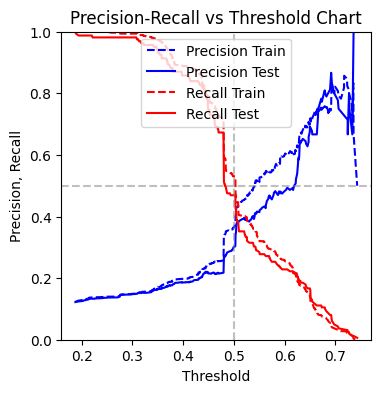

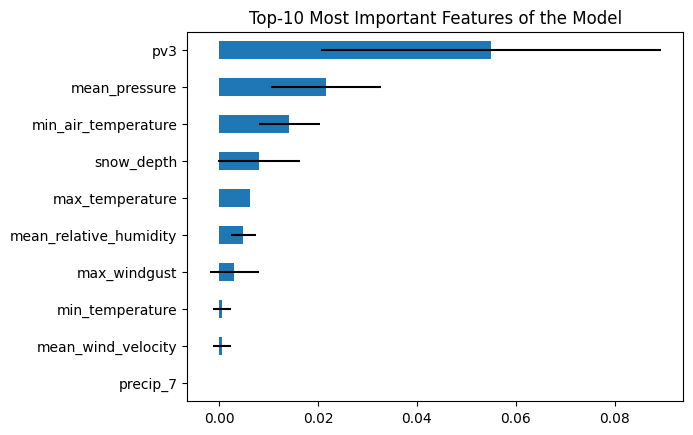


  1_XGB_Grid0_Rand1_f1
[14:16:01] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:02] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:02] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:02] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:02] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:02] WARNING: /Users/runner/work/xgboost/xgboost/python

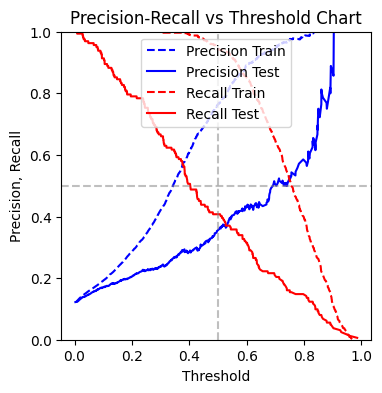

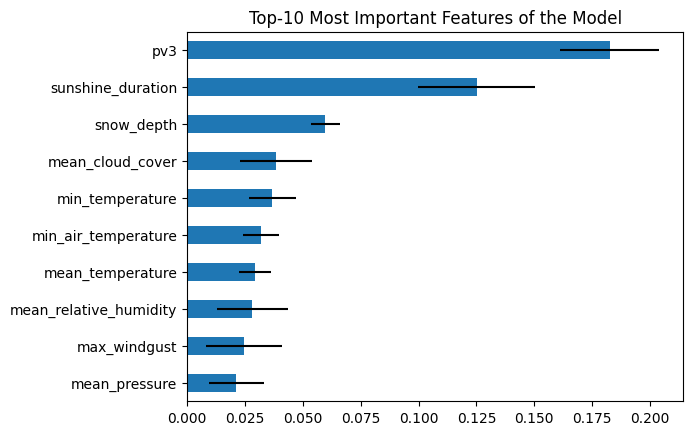


  2_XGB_Grid0_Rand2_recall
[14:16:10] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:11] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:11] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:11] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:11] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:12] WARNING: /Users/runner/work/xgboost/xgboost/py

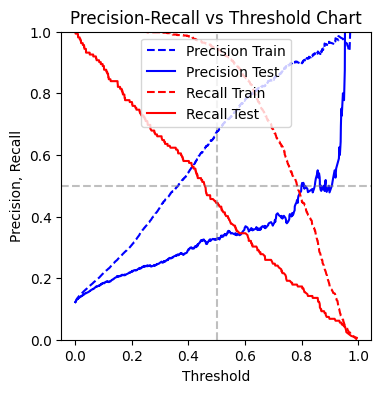

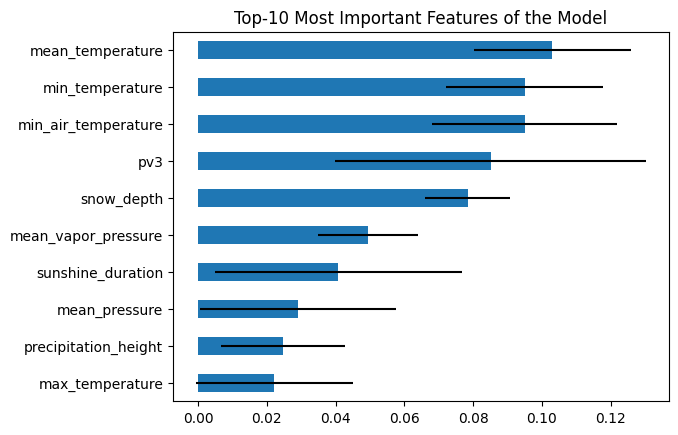


  3_XGB_Grid0_Rand2_f1
[14:16:18] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:19] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:19] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:19] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:20] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:20] WARNING: /Users/runner/work/xgboost/xgboost/python

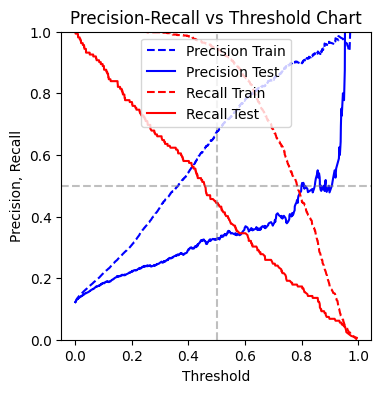

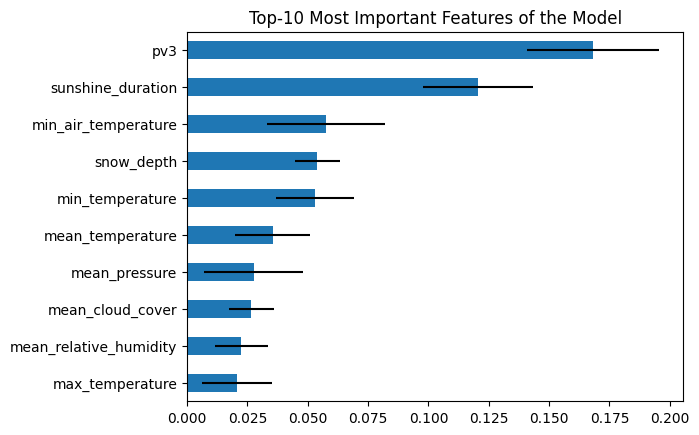


  4_XGB_Grid0_Rand3_recall
[14:16:28] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:28] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:28] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:28] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:29] WARNING: /Users/runner/work/xgboost/xgboost/py

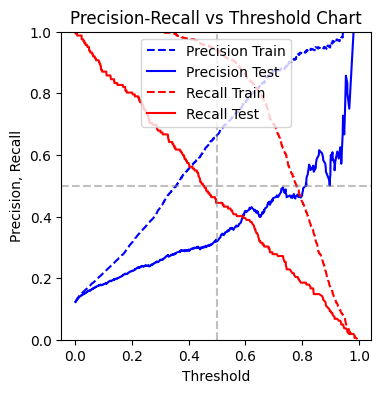

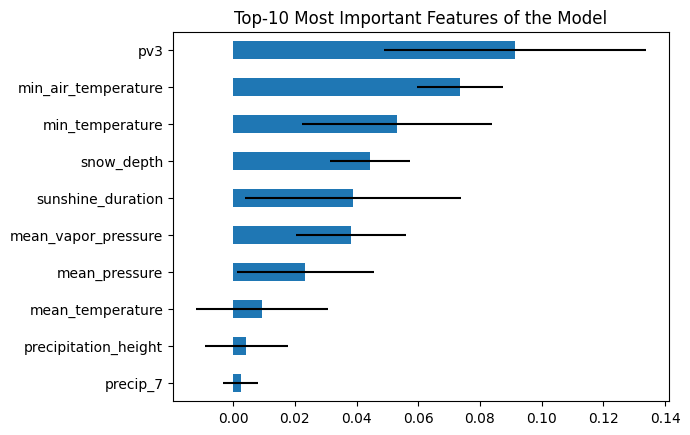


  5_XGB_Grid0_Rand3_f1
[14:16:37] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:37] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:38] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:38] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:38] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:38] WARNING: /Users/runner/work/xgboost/xgboost/python

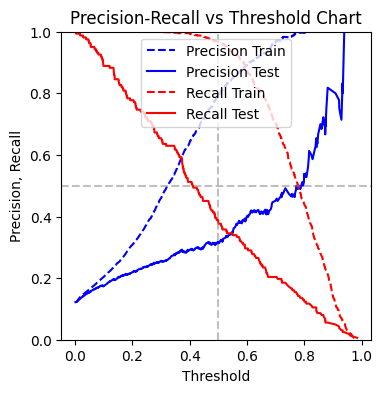

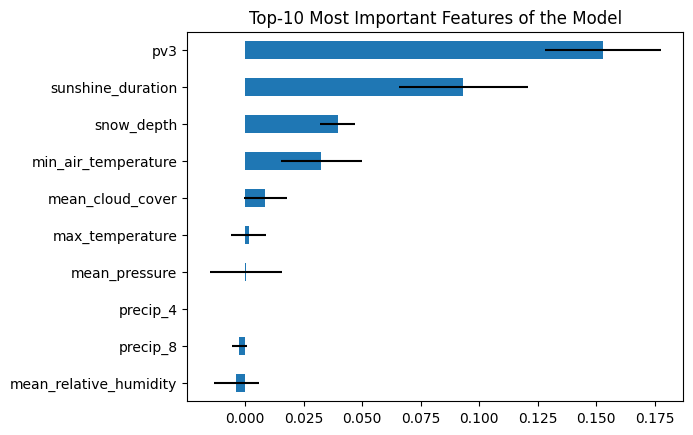


  6_XGB_Grid0_Rand4_recall
[14:16:47] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:47] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:47] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:47] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:47] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:48] WARNING: /Users/runner/work/xgboost/xgboost/py

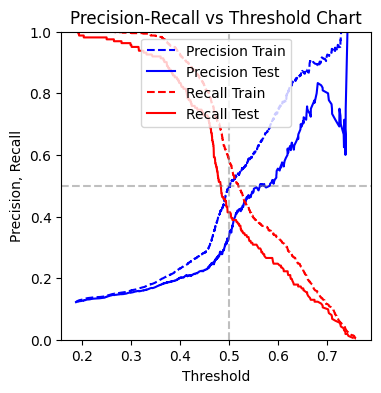

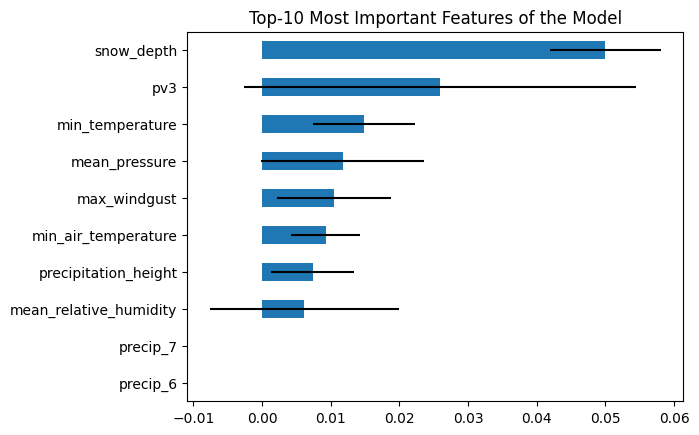


  7_XGB_Grid0_Rand4_f1
[14:16:57] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:57] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:57] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:16:58] WARNING: /Users/runner/work/xgboost/xgboost/python

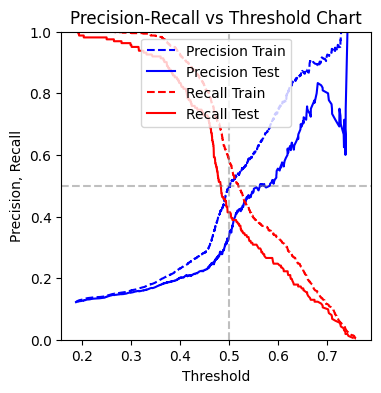

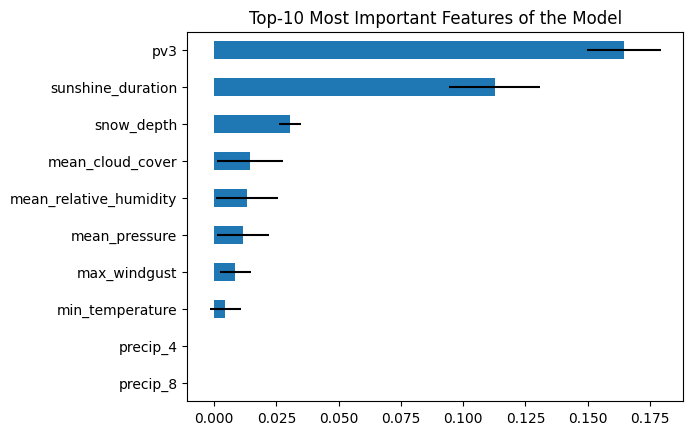


  8_XGB_Grid0_Rand5_recall
[14:17:09] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:09] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:10] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:10] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:11] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:11] WARNING: /Users/runner/work/xgboost/xgboost/py

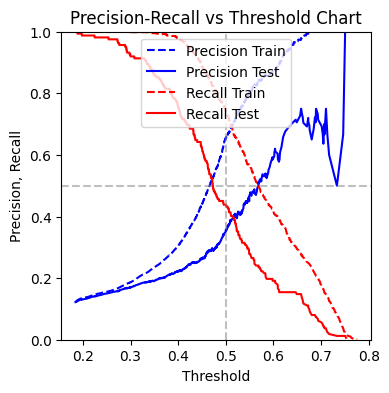

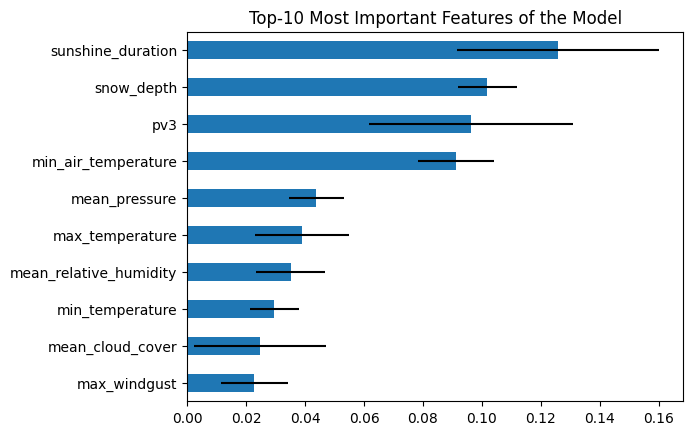


  9_XGB_Grid0_Rand5_f1
[14:17:21] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:22] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:22] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:23] WARNING: /Users/runner/work/xgboost/xgboost/python

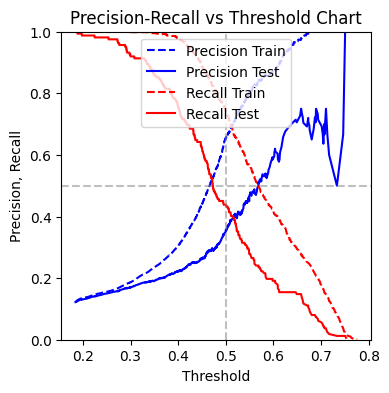

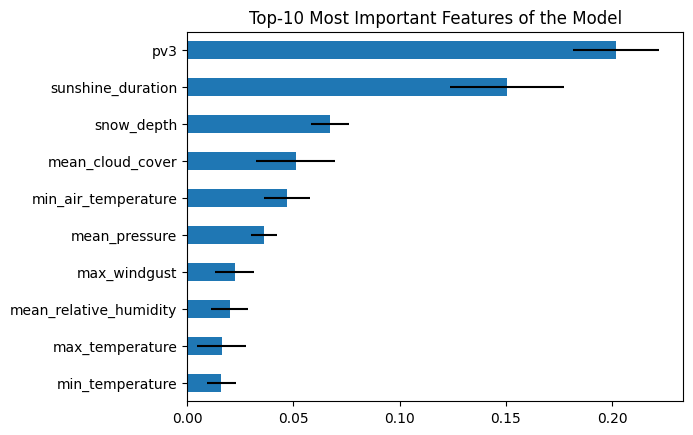


 10_XGB_Grid0_Rand6_recall
[14:17:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:35] WARNING: /Users/runner/work/xgboost/xgboost/py

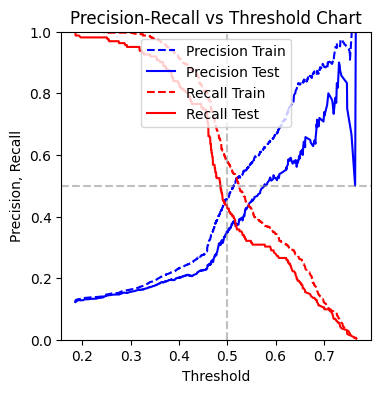

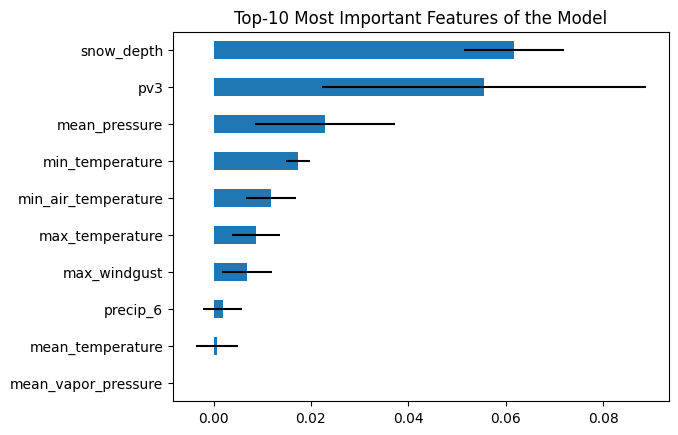


 11_XGB_Grid0_Rand6_f1
[14:17:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:47] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:47] WARNING: /Users/runner/work/xgboost/xgboost/python

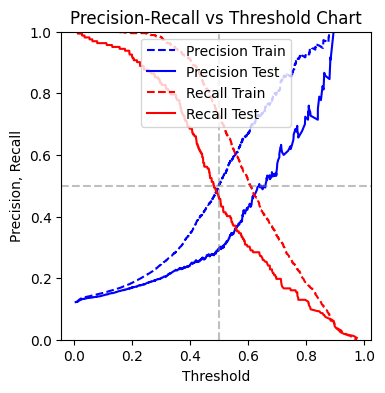

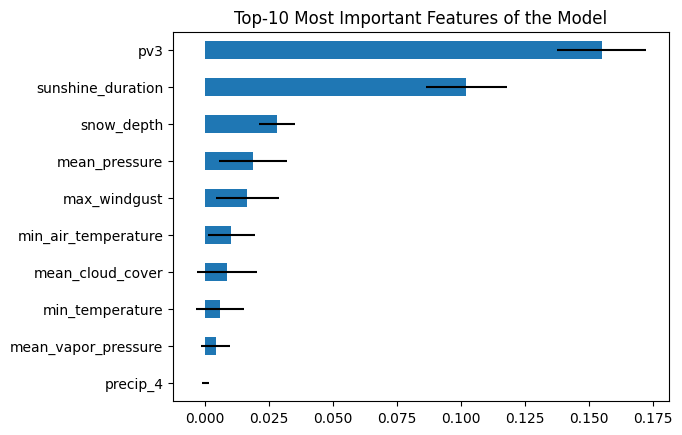


 12_XGB_Grid0_Rand7_recall
[14:17:57] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:57] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:57] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:17:58] WARNING: /Users/runner/work/xgboost/xgboost/py

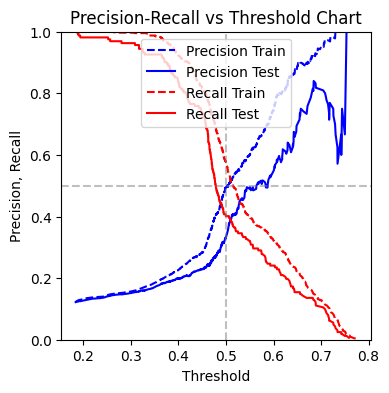

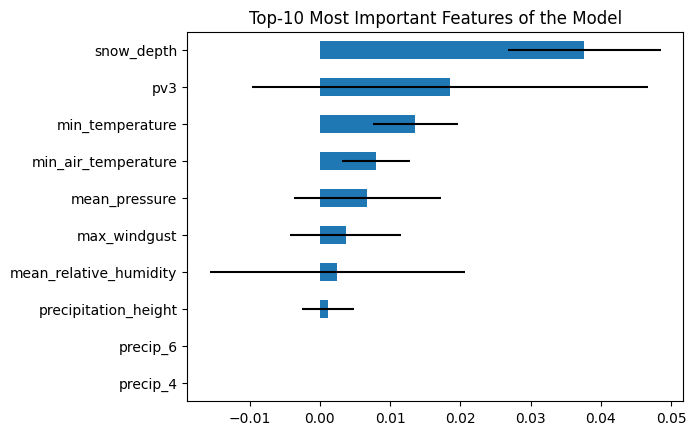


 13_XGB_Grid0_Rand7_f1
[14:18:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:09] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:10] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:10] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:10] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:11] WARNING: /Users/runner/work/xgboost/xgboost/python

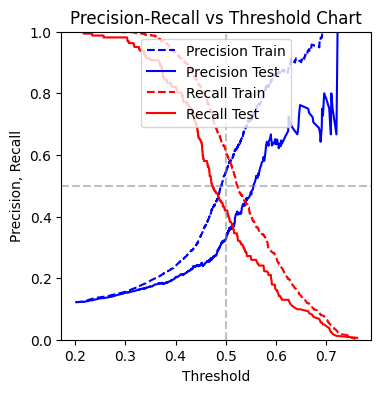

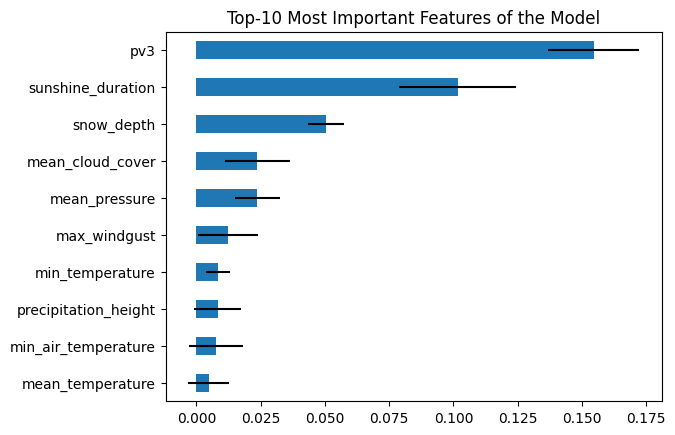


 14_XGB_Grid0_Rand8_recall
[14:18:22] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:22] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:24] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:24] WARNING: /Users/runner/work/xgboost/xgboost/py

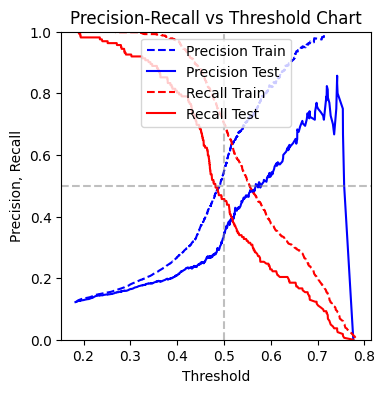

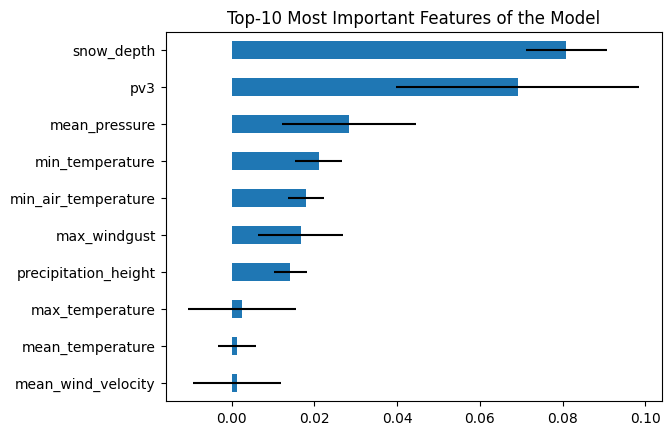


 15_XGB_Grid0_Rand8_f1
[14:18:33] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:35] WARNING: /Users/runner/work/xgboost/xgboost/python

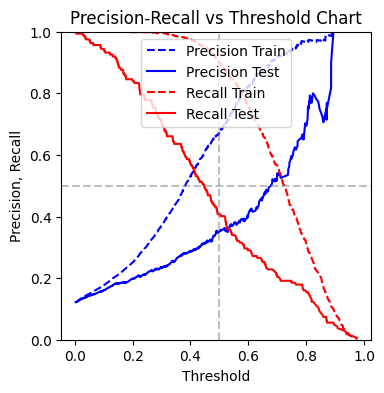

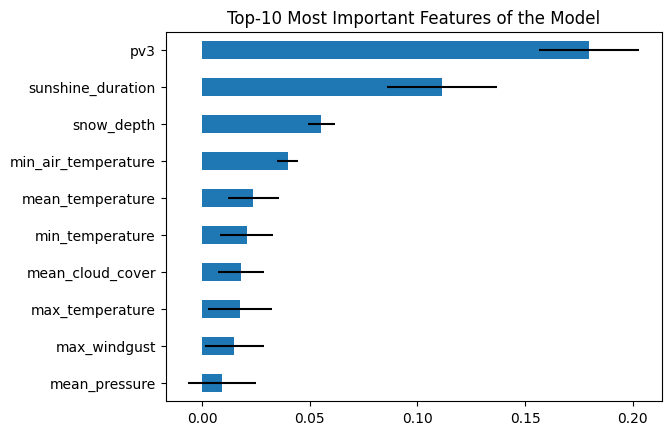


 16_XGB_Grid0_Rand9_recall
[14:18:44] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:46] WARNING: /Users/runner/work/xgboost/xgboost/py

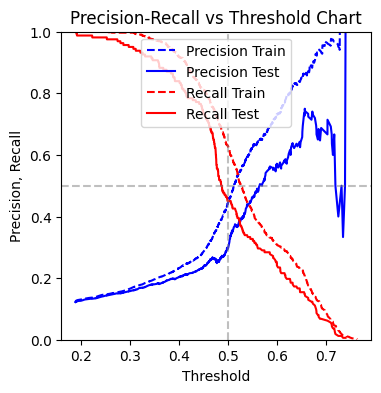

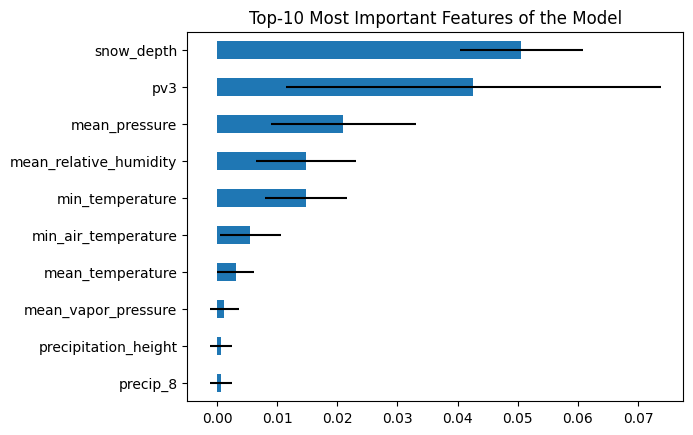


 17_XGB_Grid0_Rand9_f1
[14:18:56] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:56] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:56] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:56] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:57] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:18:57] WARNING: /Users/runner/work/xgboost/xgboost/python

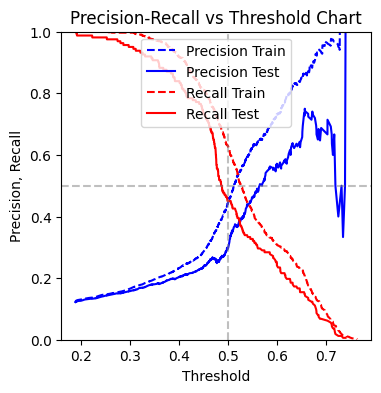

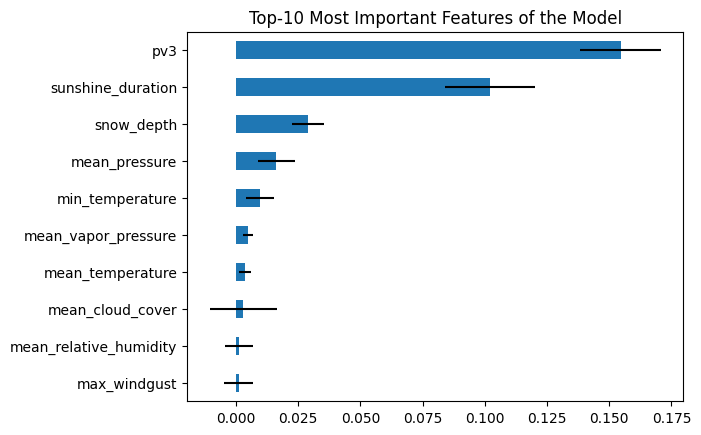


 18_XGB_Grid0_Rand10_recall
[14:19:07] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:07] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:09] WARNING: /Users/runner/work/xgboost/xgboost/p

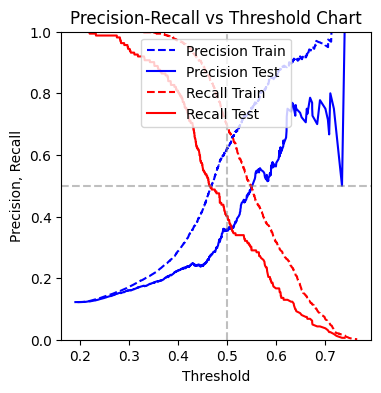

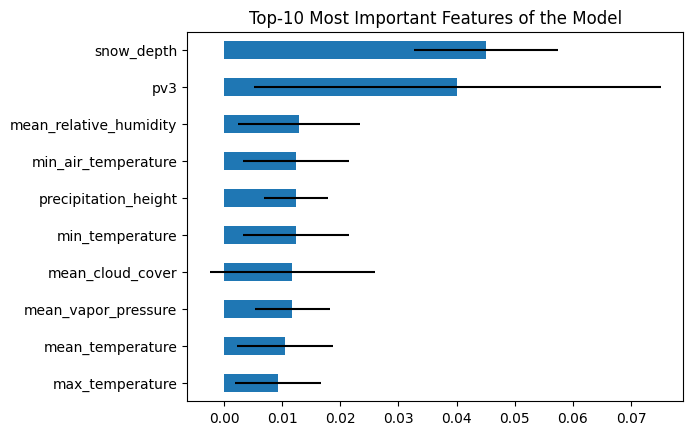


 19_XGB_Grid0_Rand10_f1
[14:19:19] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:20] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:20] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:21] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:21] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:22] WARNING: /Users/runner/work/xgboost/xgboost/pytho

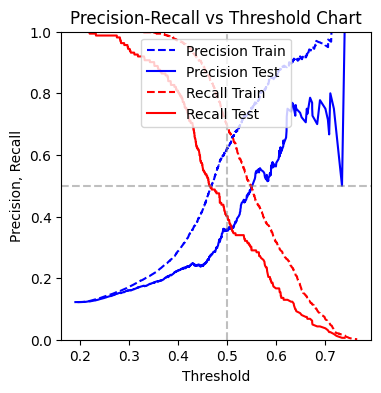

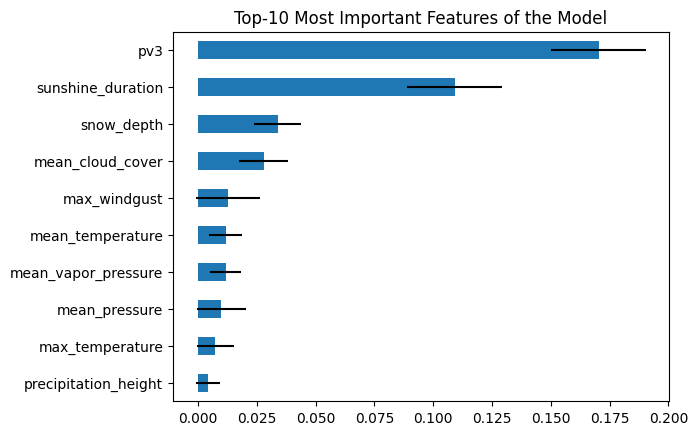


 20_XGB_Grid1_Rand1_recall
[14:19:32] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:33] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:35] WARNING: /Users/runner/work/xgboost/xgboost/py

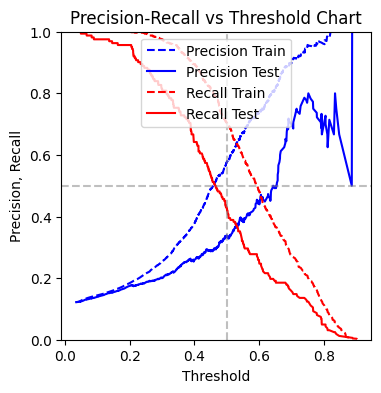

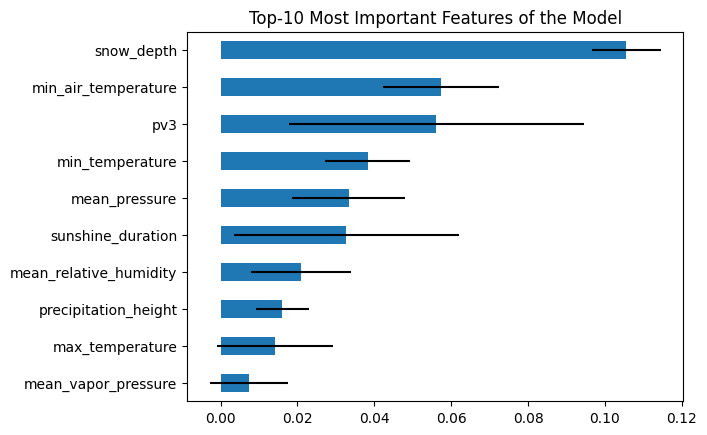


 21_XGB_Grid1_Rand1_f1
[14:19:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:47] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:48] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:49] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:19:49] WARNING: /Users/runner/work/xgboost/xgboost/python

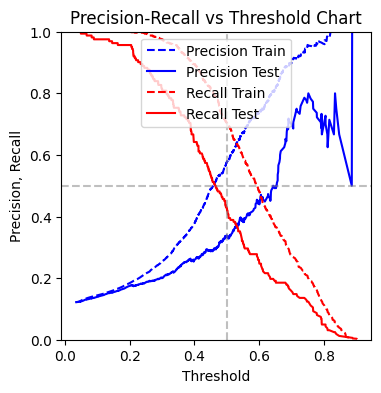

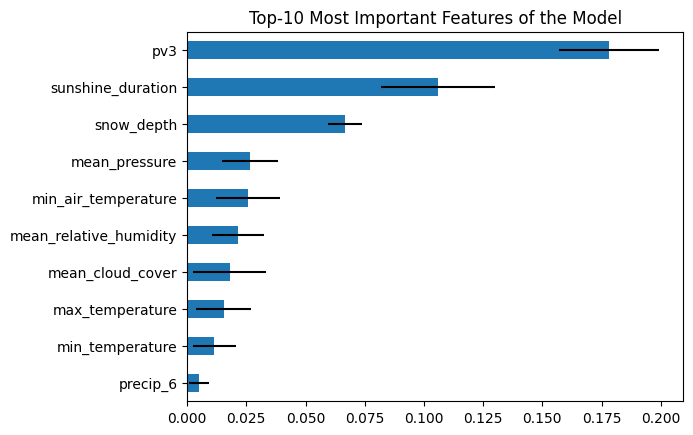


 22_XGB_Grid1_Rand2_recall
[14:19:59] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:00] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:00] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:01] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:01] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:02] WARNING: /Users/runner/work/xgboost/xgboost/py

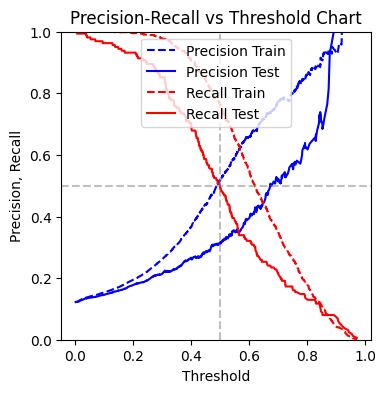

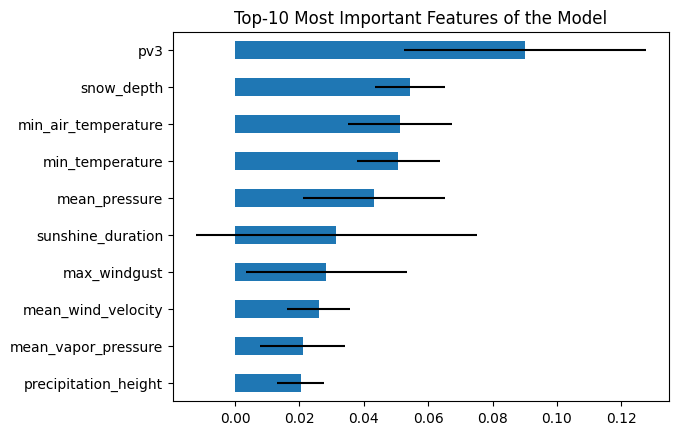


 23_XGB_Grid1_Rand2_f1
[14:20:13] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:13] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:13] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:14] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:14] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:15] WARNING: /Users/runner/work/xgboost/xgboost/python

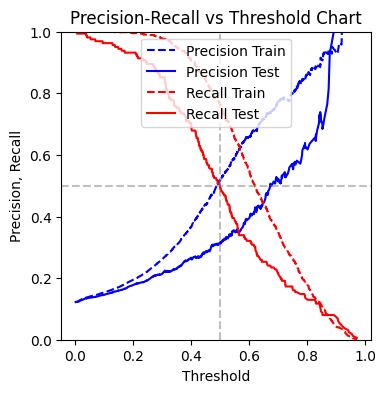

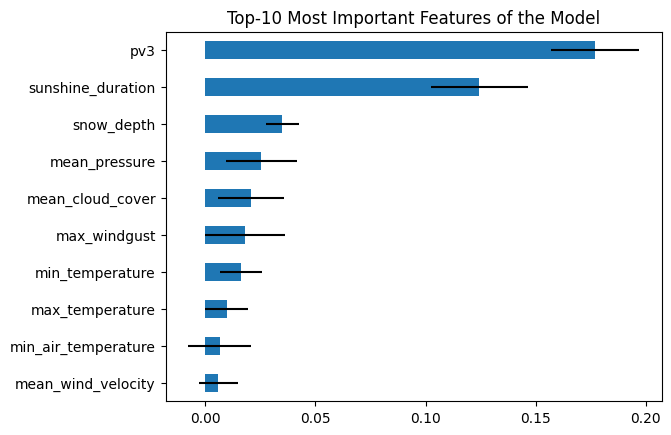


 24_XGB_Grid1_Rand3_recall
[14:20:28] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:28] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:30] WARNING: /Users/runner/work/xgboost/xgboost/py

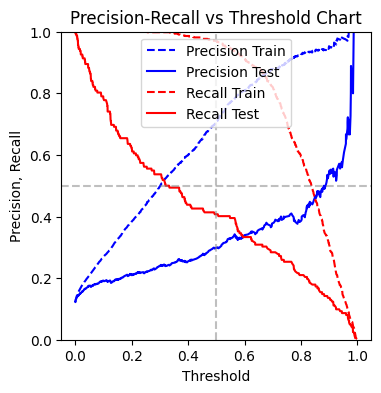

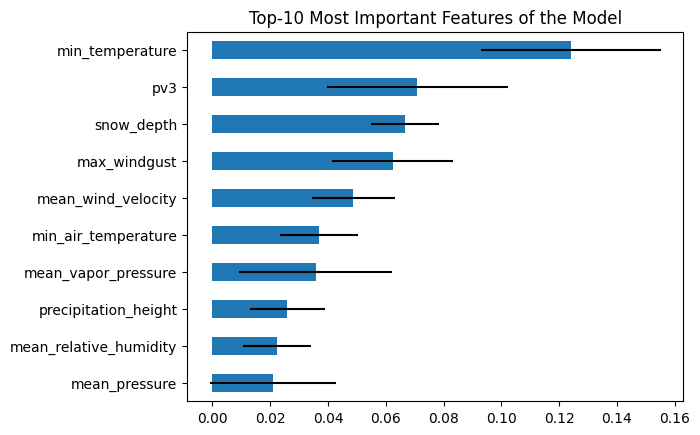


 25_XGB_Grid1_Rand3_f1
[14:20:38] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:39] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:39] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:40] WARNING: /Users/runner/work/xgboost/xgboost/python

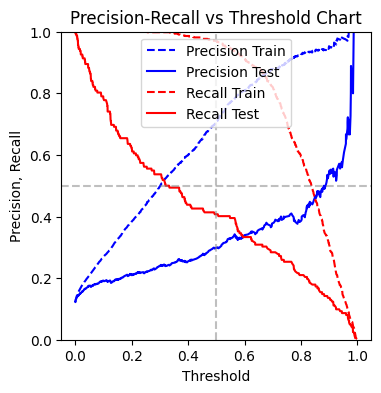

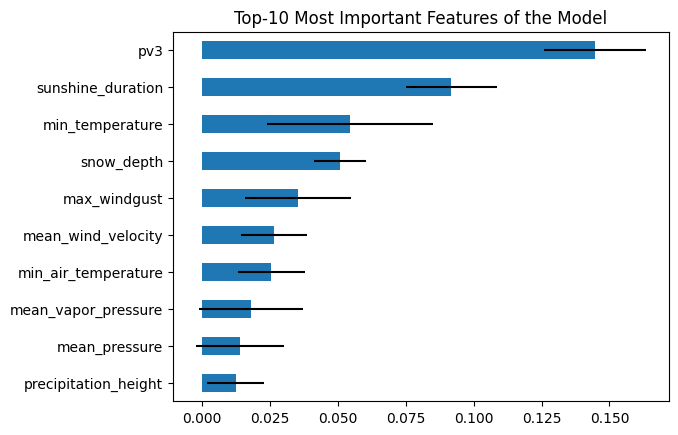


 26_XGB_Grid1_Rand4_recall
[14:20:52] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:53] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:53] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:53] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:54] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:20:54] WARNING: /Users/runner/work/xgboost/xgboost/py

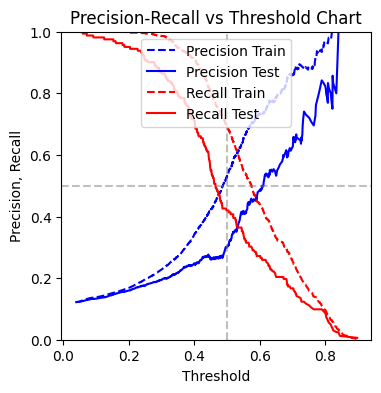

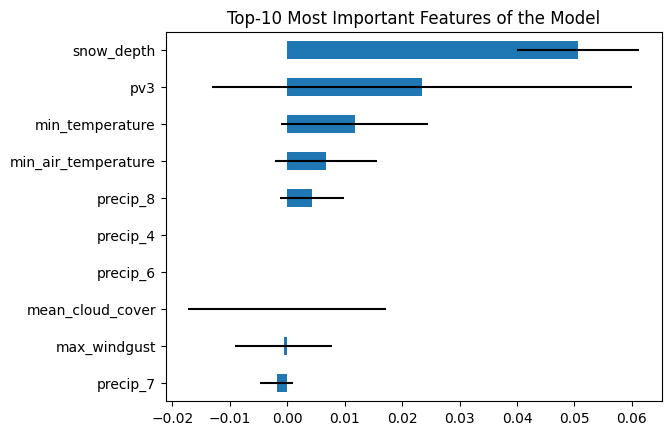


 27_XGB_Grid1_Rand4_f1
[14:21:07] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:07] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:09] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:10] WARNING: /Users/runner/work/xgboost/xgboost/python

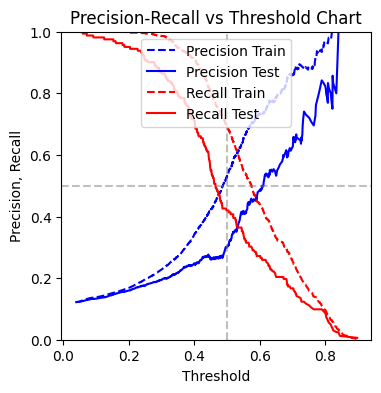

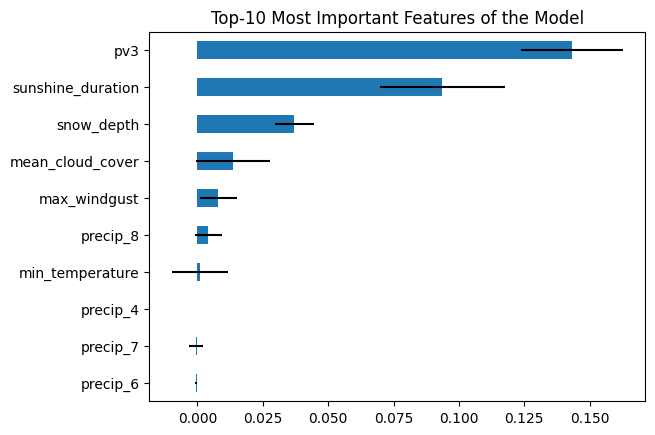


 28_XGB_Grid1_Rand5_recall
[14:21:22] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:24] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:24] WARNING: /Users/runner/work/xgboost/xgboost/py

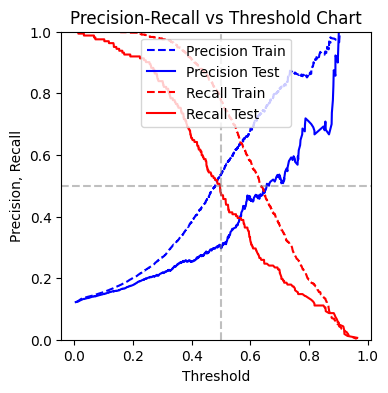

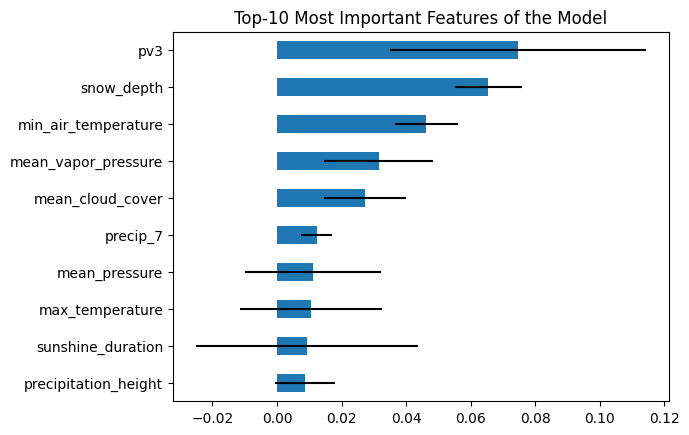


 29_XGB_Grid1_Rand5_f1
[14:21:33] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:36] WARNING: /Users/runner/work/xgboost/xgboost/python

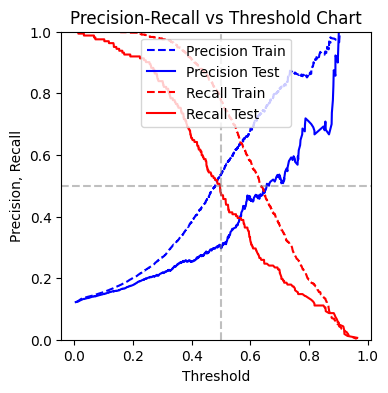

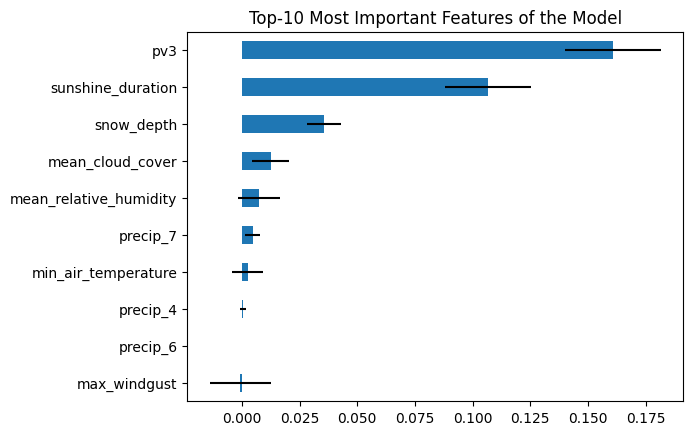


 30_XGB_Grid1_Rand6_recall
[14:21:44] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:46] WARNING: /Users/runner/work/xgboost/xgboost/py

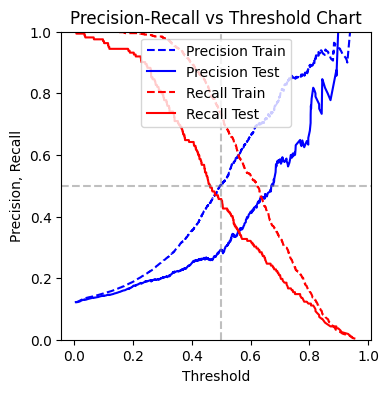

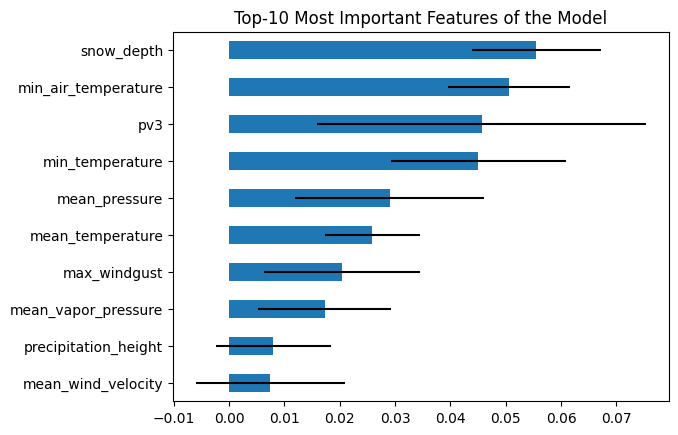


 31_XGB_Grid1_Rand6_f1
[14:21:56] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:56] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:57] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:57] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:57] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:21:58] WARNING: /Users/runner/work/xgboost/xgboost/python

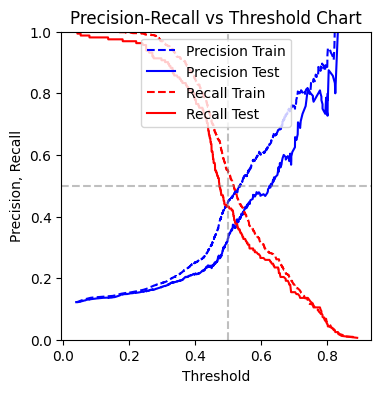

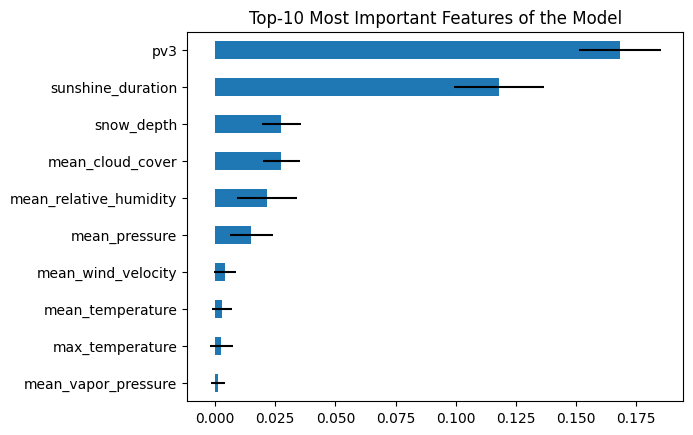


 32_XGB_Grid1_Rand7_recall
[14:22:07] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:09] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:09] WARNING: /Users/runner/work/xgboost/xgboost/py

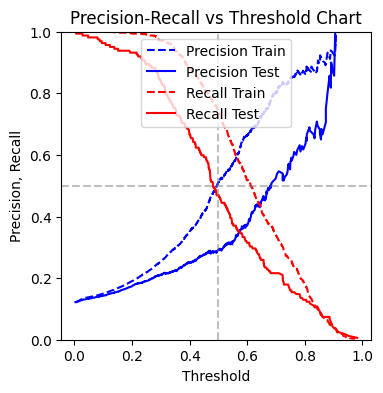

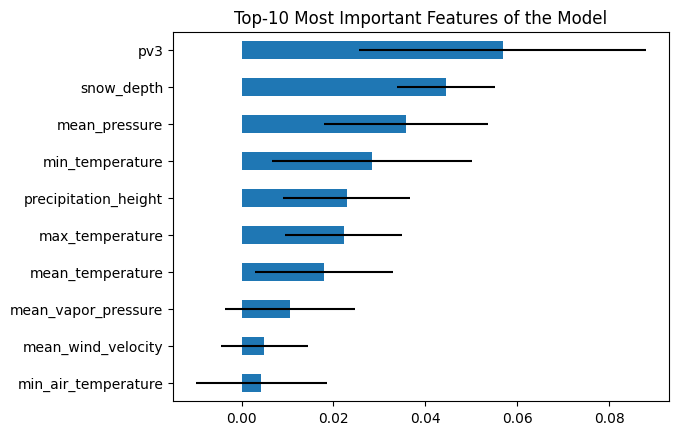


 33_XGB_Grid1_Rand7_f1
[14:22:19] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:19] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:20] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:20] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:20] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:21] WARNING: /Users/runner/work/xgboost/xgboost/python

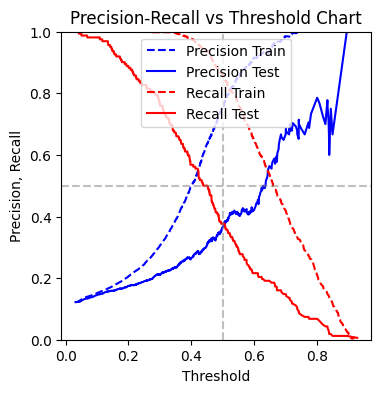

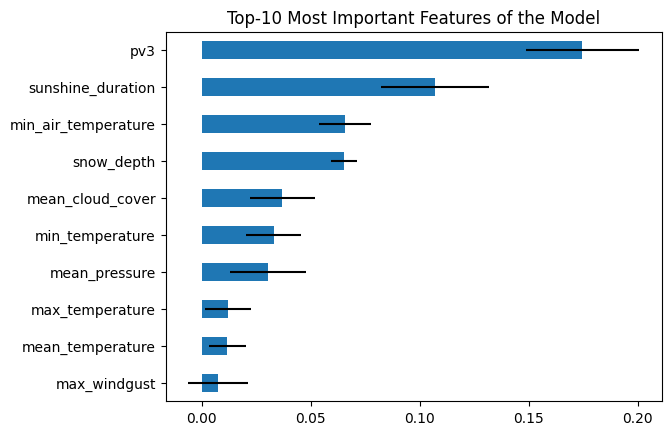


 34_XGB_Grid1_Rand8_recall
[14:22:33] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:33] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:33] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:34] WARNING: /Users/runner/work/xgboost/xgboost/py

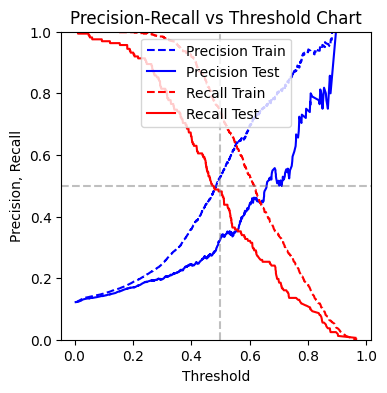

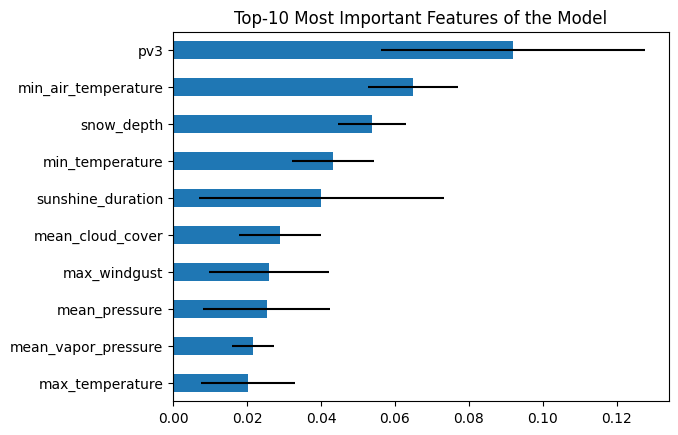


 35_XGB_Grid1_Rand8_f1
[14:22:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:46] WARNING: /Users/runner/work/xgboost/xgboost/python

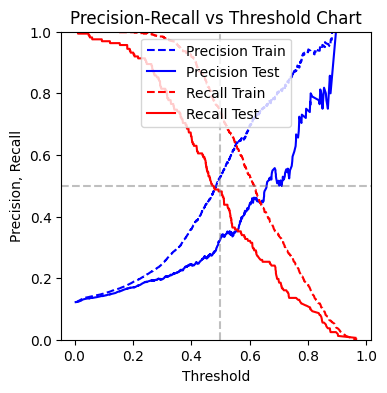

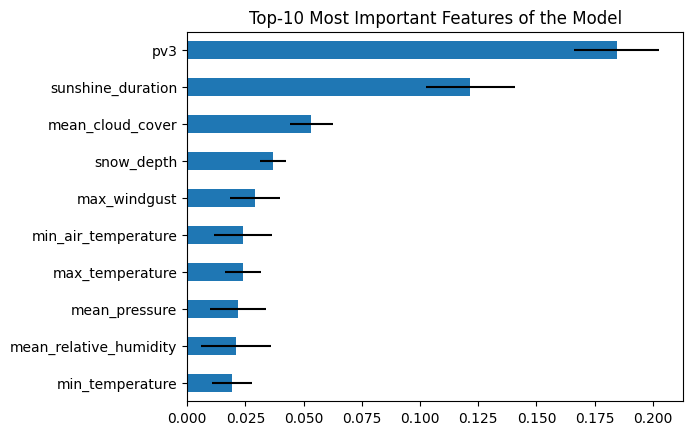


 36_XGB_Grid1_Rand9_recall
[14:22:57] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:59] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:59] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:22:59] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:00] WARNING: /Users/runner/work/xgboost/xgboost/py

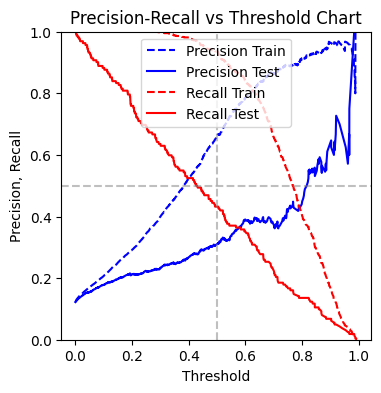

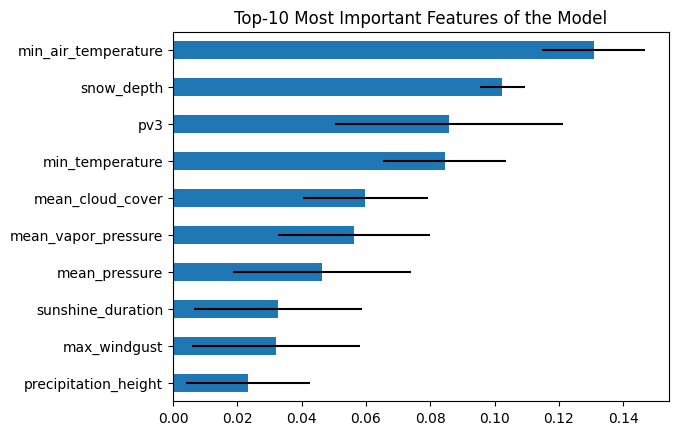


 37_XGB_Grid1_Rand9_f1
[14:23:12] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:12] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:13] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:13] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:13] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:14] WARNING: /Users/runner/work/xgboost/xgboost/python

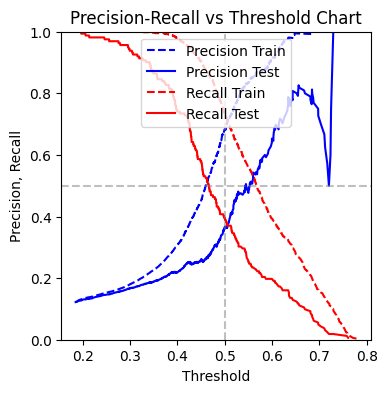

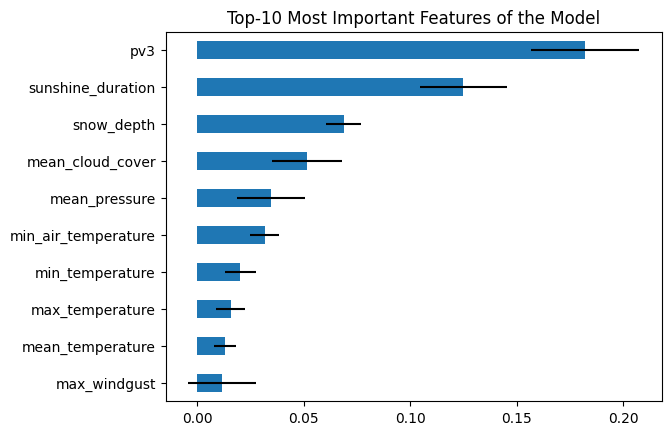


 38_XGB_Grid1_Rand10_recall
[14:23:27] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:28] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:28] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:30] WARNING: /Users/runner/work/xgboost/xgboost/p

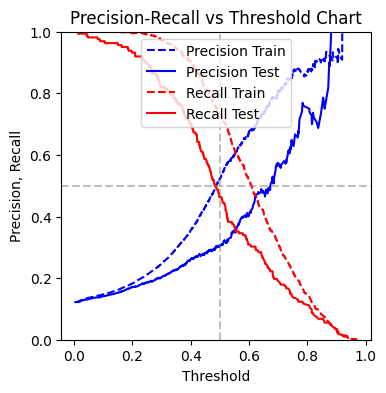

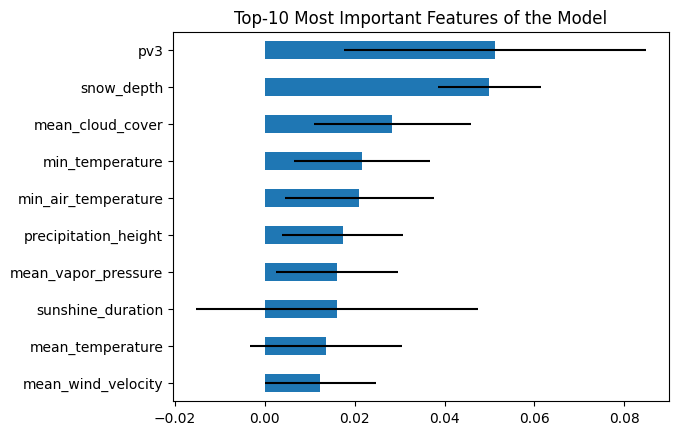


 39_XGB_Grid1_Rand10_f1
[14:23:41] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:42] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:42] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:43] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:43] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:43] WARNING: /Users/runner/work/xgboost/xgboost/pytho

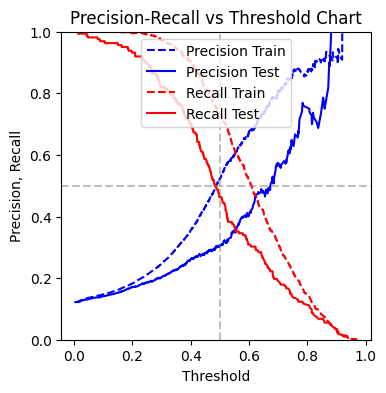

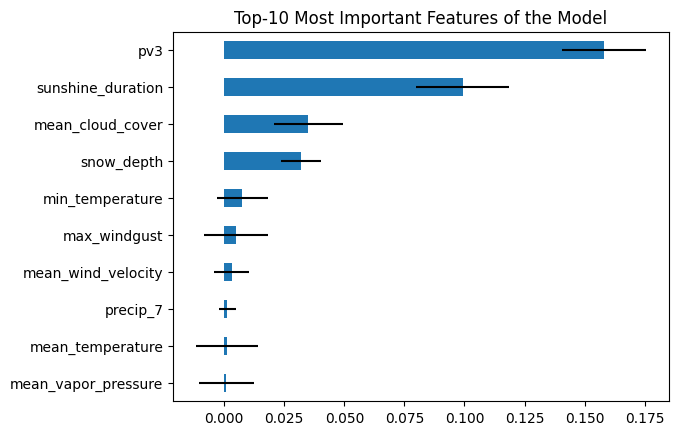


 40_XGB_Grid2_Rand1_recall
[14:23:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:56] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:23:56] WARNING: /Users/runner/work/xgboost/xgboost/py

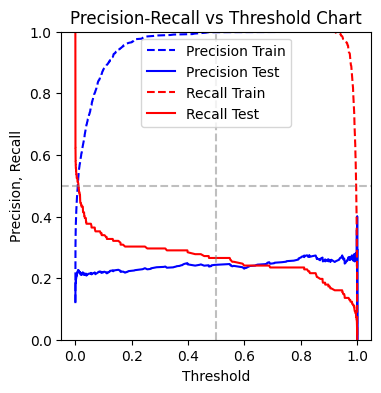

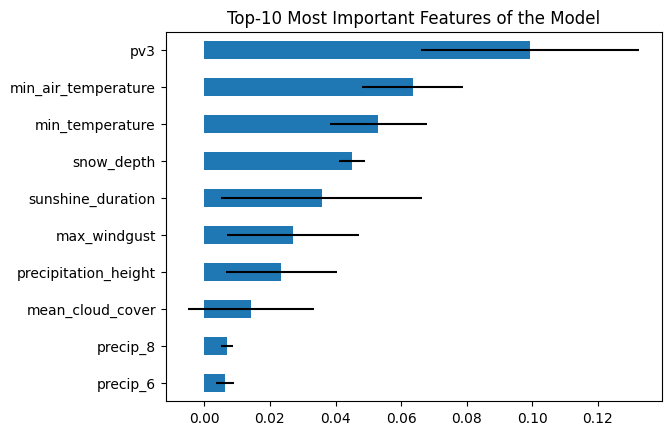


 41_XGB_Grid2_Rand1_f1
[14:24:39] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:24:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:24:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:24:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:24:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:24:40] WARNING: /Users/runner/work/xgboost/xgboost/python

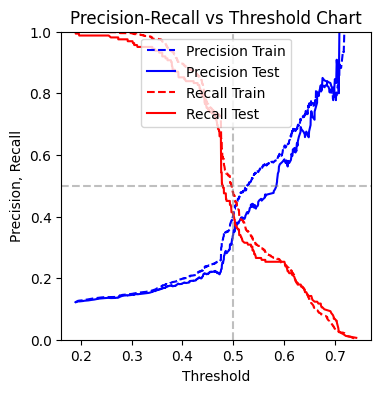

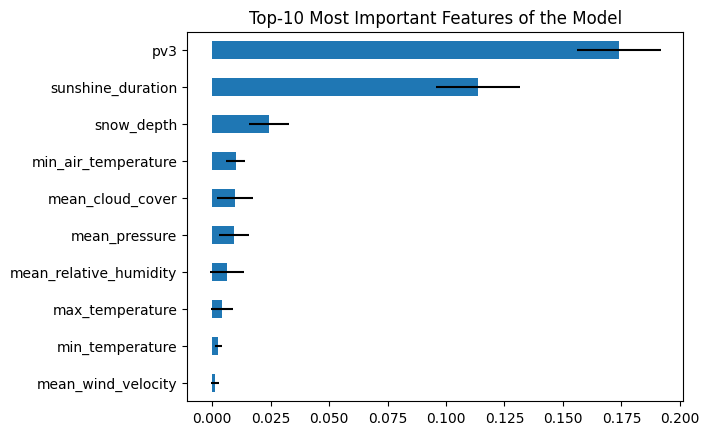


 42_XGB_Grid2_Rand2_recall
[14:25:26] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:25:26] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:25:26] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:25:26] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:25:27] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:25:27] WARNING: /Users/runner/work/xgboost/xgboost/py

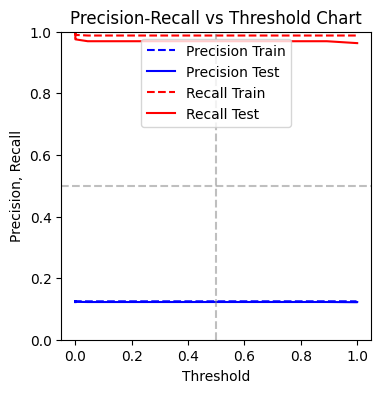

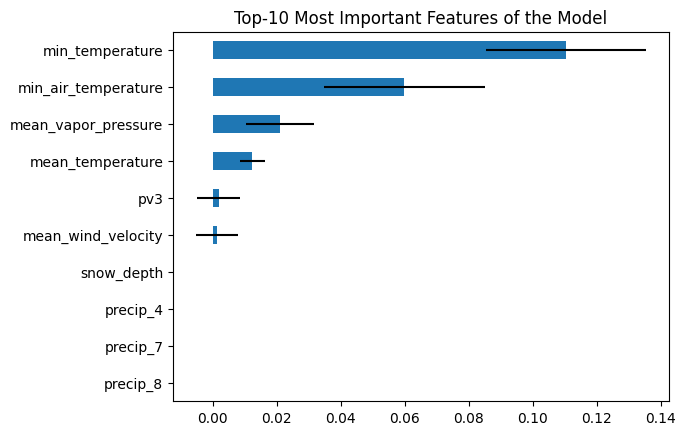


 43_XGB_Grid2_Rand2_f1
[14:25:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:25:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:25:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:25:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:25:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:25:55] WARNING: /Users/runner/work/xgboost/xgboost/python

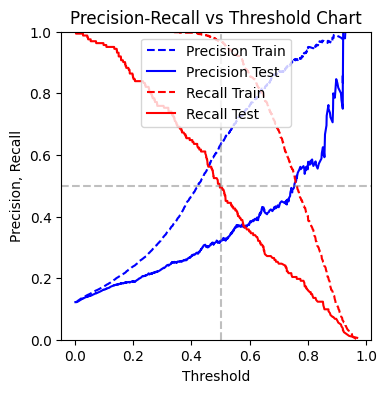

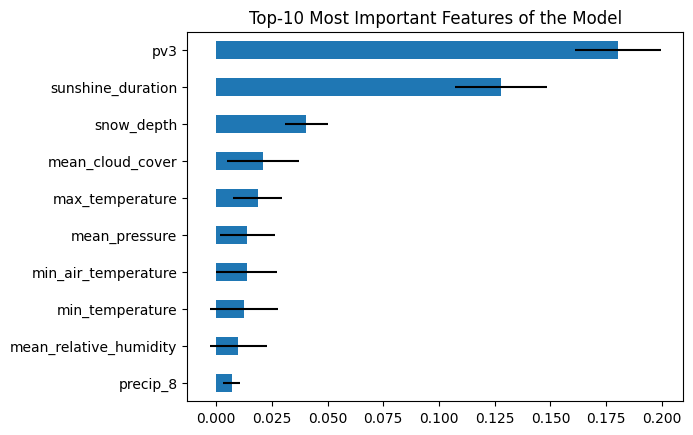


 44_XGB_Grid2_Rand3_recall
[14:26:30] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:30] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:30] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:30] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:30] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:31] WARNING: /Users/runner/work/xgboost/xgboost/py

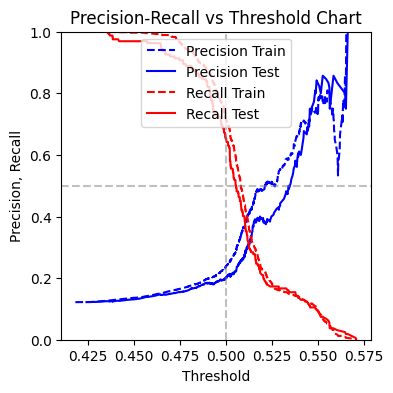

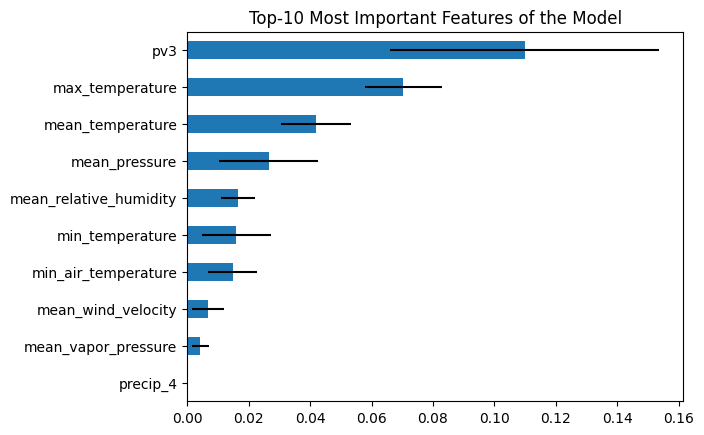


 45_XGB_Grid2_Rand3_f1
[14:26:39] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:39] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:39] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:39] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:40] WARNING: /Users/runner/work/xgboost/xgboost/python

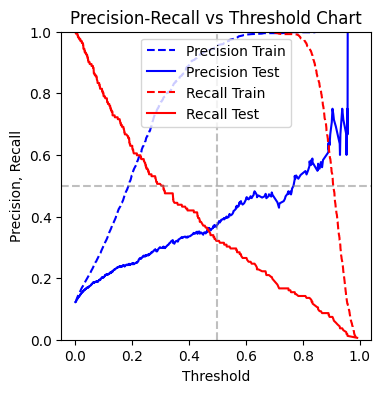

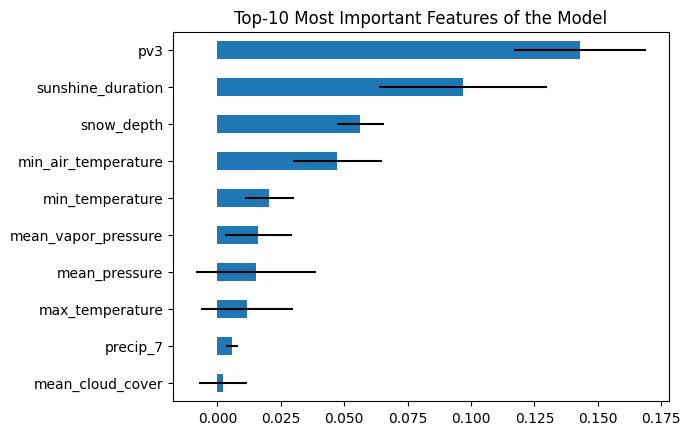


 46_XGB_Grid2_Rand4_recall
[14:26:49] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:51] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:52] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:53] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:26:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:27:02] WARNING: /Users/runner/work/xgboost/xgboost/py

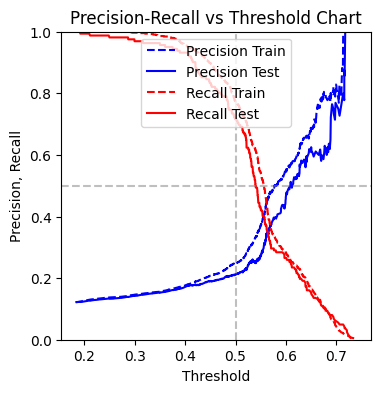

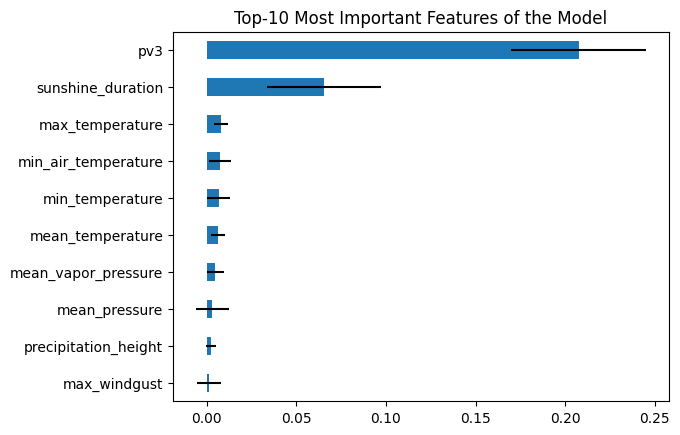


 47_XGB_Grid2_Rand4_f1
[14:27:41] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:27:43] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:27:43] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:27:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:27:49] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:27:53] WARNING: /Users/runner/work/xgboost/xgboost/python

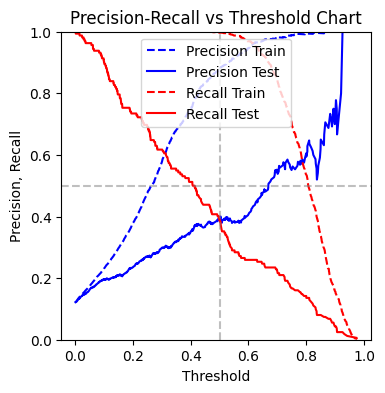

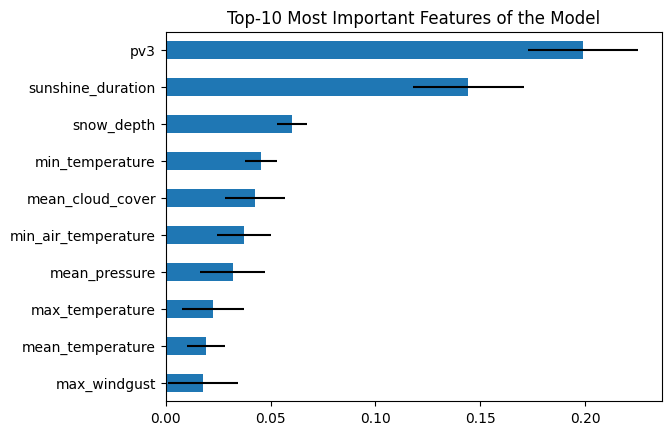


 48_XGB_Grid2_Rand5_recall
[14:28:43] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:28:43] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:28:44] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:28:44] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:28:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:28:47] WARNING: /Users/runner/work/xgboost/xgboost/py

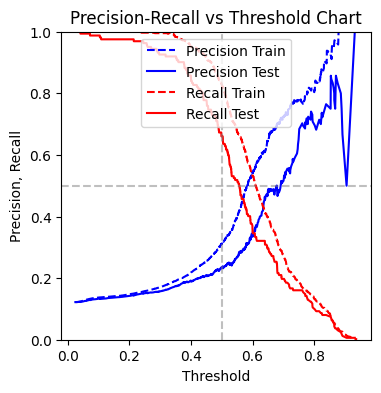

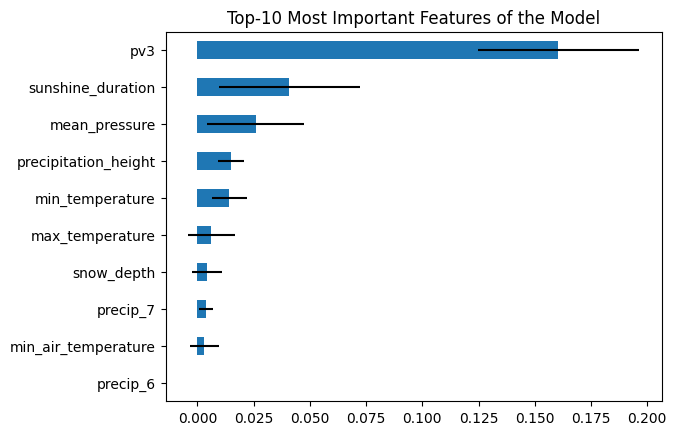


 49_XGB_Grid2_Rand5_f1
[14:29:10] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:29:11] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:29:11] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:29:12] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:29:14] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:29:15] WARNING: /Users/runner/work/xgboost/xgboost/python

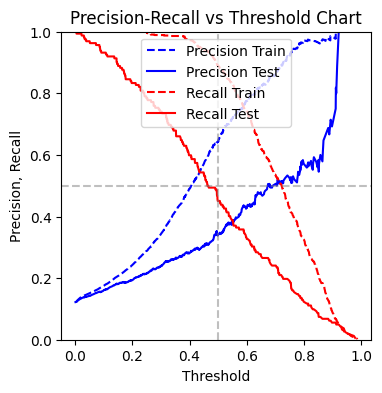

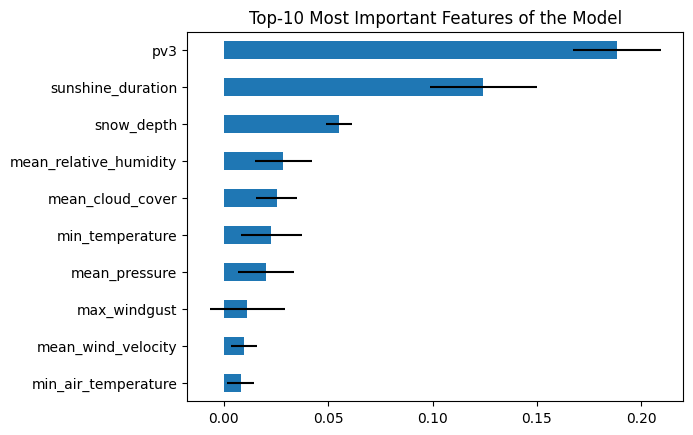


 50_XGB_Grid2_Rand6_recall
[14:29:37] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:29:38] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:29:38] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:29:39] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:29:41] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:29:43] WARNING: /Users/runner/work/xgboost/xgboost/py

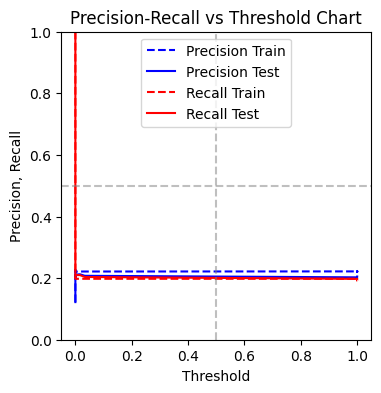

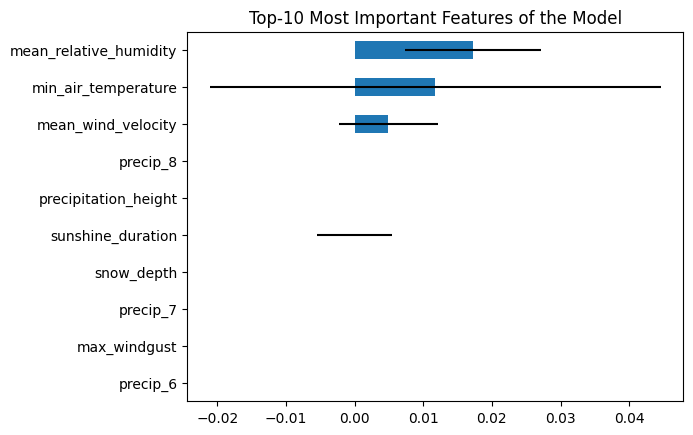


 51_XGB_Grid2_Rand6_f1
[14:30:12] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:30:14] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:30:14] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:30:15] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:30:17] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:30:19] WARNING: /Users/runner/work/xgboost/xgboost/python

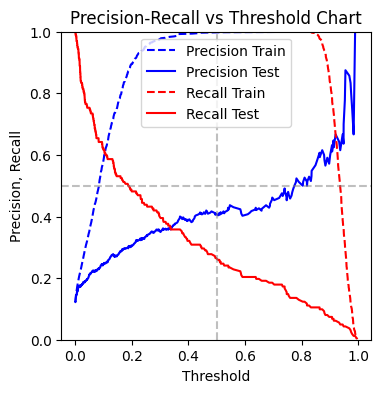

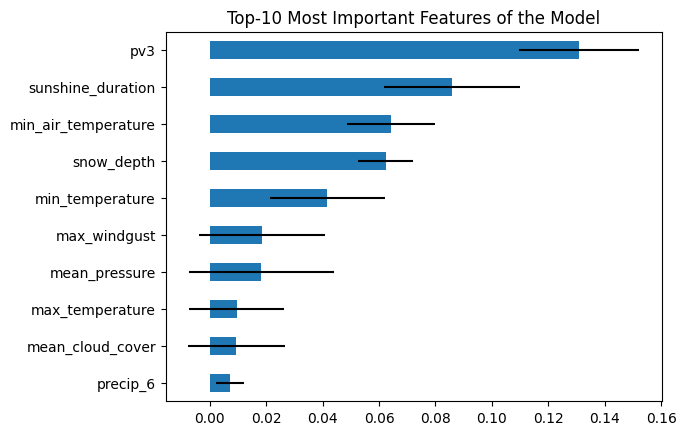


 52_XGB_Grid2_Rand7_recall
[14:30:53] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:30:54] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:30:54] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:30:54] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:30:56] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:30:57] WARNING: /Users/runner/work/xgboost/xgboost/py

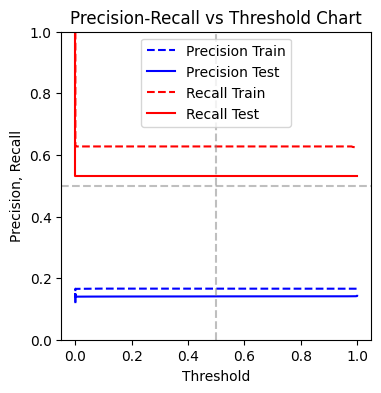

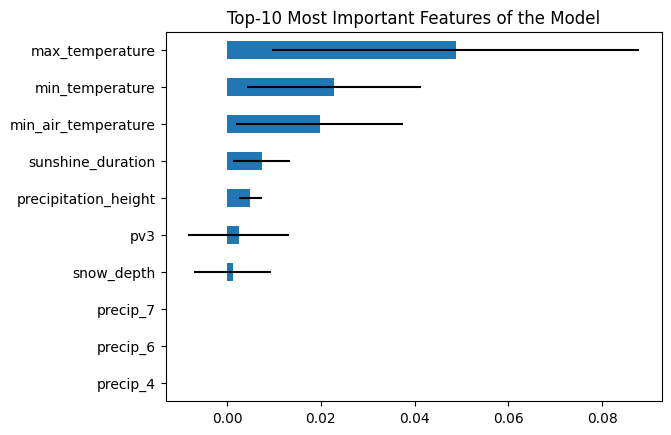


 53_XGB_Grid2_Rand7_f1
[14:31:11] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:12] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:12] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:12] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:14] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:15] WARNING: /Users/runner/work/xgboost/xgboost/python

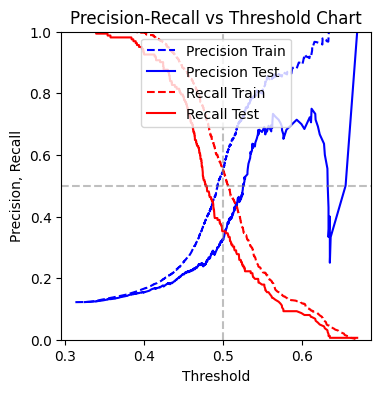

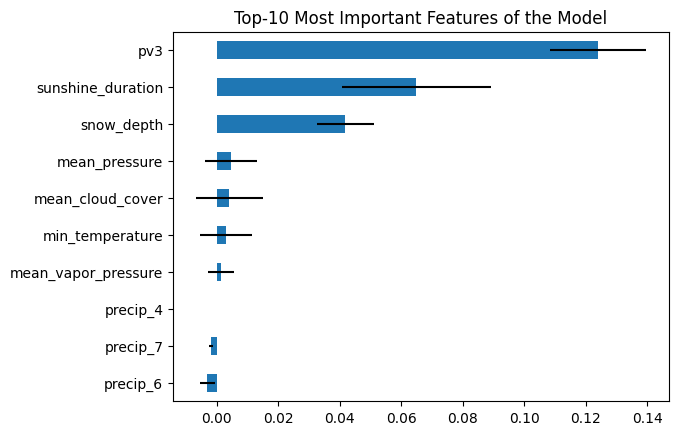


 54_XGB_Grid2_Rand8_recall
[14:31:27] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:28] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:28] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:31] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:35] WARNING: /Users/runner/work/xgboost/xgboost/py

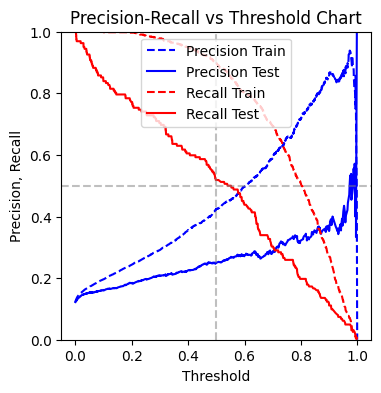

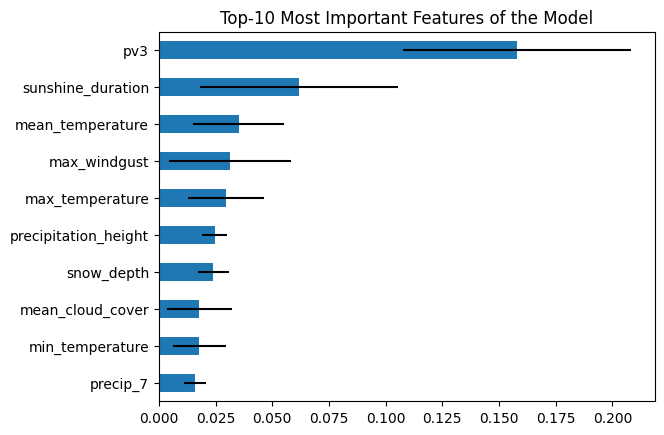


 55_XGB_Grid2_Rand8_f1
[14:31:49] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:50] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:50] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:50] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:54] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:31:57] WARNING: /Users/runner/work/xgboost/xgboost/python

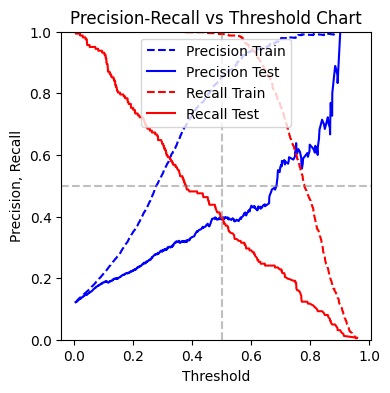

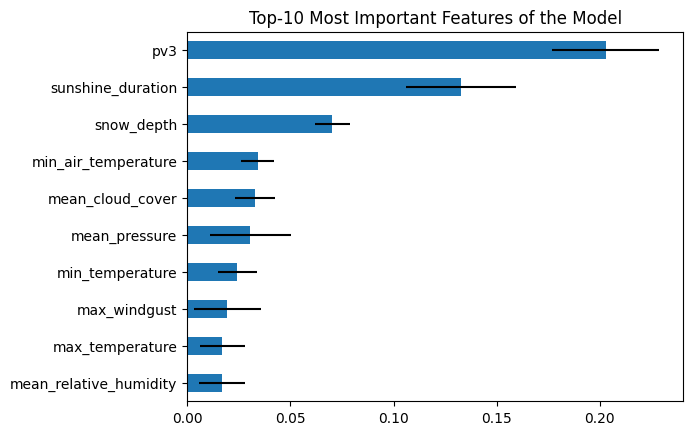


 56_XGB_Grid2_Rand9_recall
[14:32:13] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:32:15] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:32:18] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:32:20] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:32:20] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:32:20] WARNING: /Users/runner/work/xgboost/xgboost/py

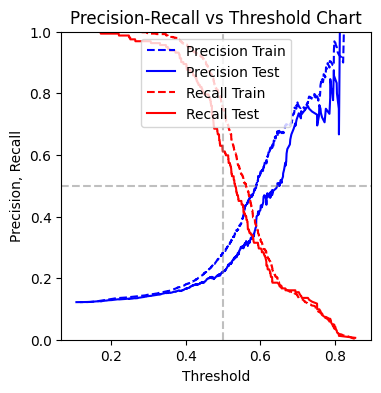

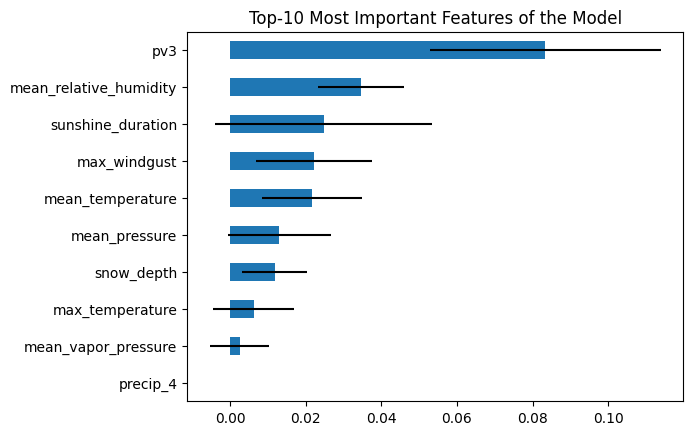


 57_XGB_Grid2_Rand9_f1
[14:32:49] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:32:52] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:32:54] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:32:56] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:32:56] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:32:56] WARNING: /Users/runner/work/xgboost/xgboost/python

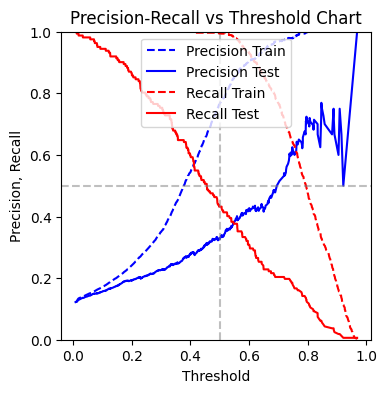

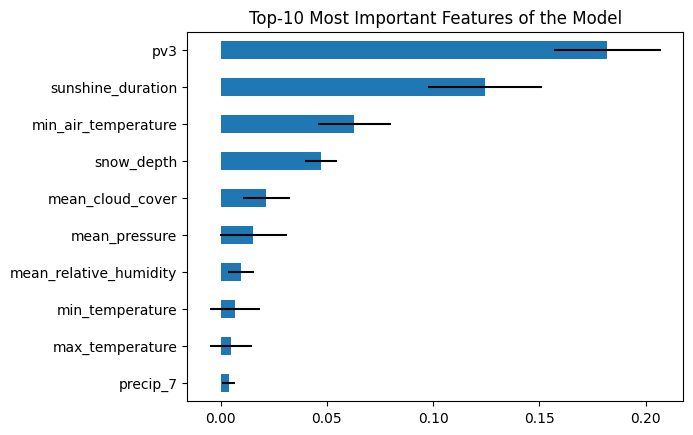


 58_XGB_Grid2_Rand10_recall
[14:33:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:33:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:33:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:33:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:33:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:33:30] WARNING: /Users/runner/work/xgboost/xgboost/p

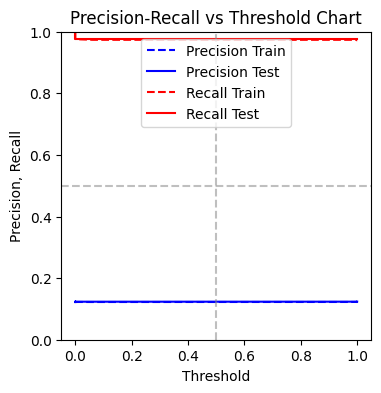

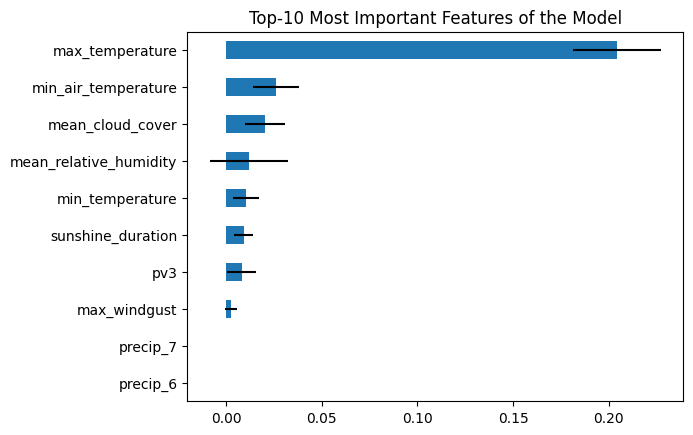


 59_XGB_Grid2_Rand10_f1
[14:33:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:33:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:33:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:33:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:33:47] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:33:47] WARNING: /Users/runner/work/xgboost/xgboost/pytho

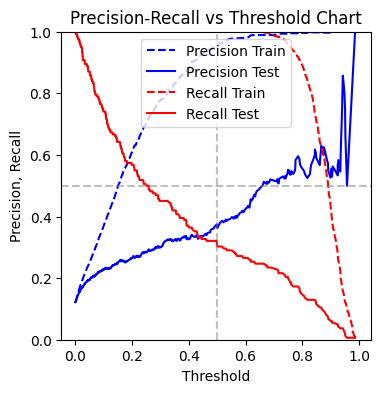

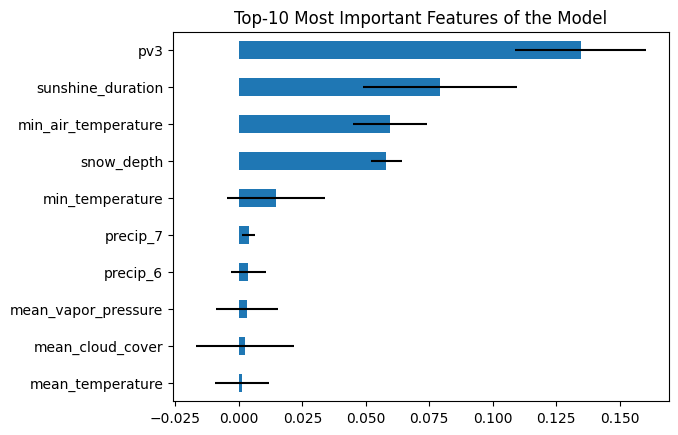

In [13]:
# runtime approx. 15-17 min

model_path = model_path1

# hyperparameter grid - acc. to https://xgboost.readthedocs.io/en/stable/parameter.html - runs 2-3 min
PARAMETERS1 = {
    "learning_rate": [.01,.1,.3], # default .3 (eta)
    "min_child_weight":[1, 5], # default 1, min weight sum
    "max_depth": [4,6,8], # default 6
    "subsample": [.75,1], # default 1 - subsampling training instances if <1 to prevent overfitting
    "colsample_bytree": [0.75,1], # default 1 - subsampling columns once per tree
    "colsample_bylevel": [0.75,1], # default 1 - subsampling columns once per level
    "lambda": [.6,.8,1], # default 1 - l2 regularization
    "alpha": [0,.2,.6], # default 0 - l1 regularization
    "growpolicy": ['depthwise', 'lossguide'],
    "scale_pos_weight": [1,5], # scale for imbalance
    } # 9216 combinations * 3 cv

PARAMETERS2 = {
    "learning_rate": [.01,.03,.1,.3,.5], # default .3 (eta)
    "min_child_weight":[1, 5], # default 1, min weight sum
    "max_depth": [4,6,8,10], # default 6
    "subsample": [.5,.7,.8,1], # default 1 - subsampling training instances if <1 to prevent overfitting
    "colsample_bytree": [.6,.8,1], # default 1 - subsampling columns once per tree
    "colsample_bylevel": [.6,.8,1], # default 1 - subsampling columns once per level
    "lambda": [.6,.8,1], # default 1 - l2 regularization
    "alpha": [0,.2,.6], # default 0 - l1 regularization
    "growpolicy": ['depthwise', 'lossguide'],
    "scale_pos_weight": [1,5], # scale for imbalance
    } # 9216 combinations * 3 cv

PARAMETERS3 = {
    "n_estimators": [5,10,20,50,100,200,500,1000],
    "learning_rate": [.01,.03,.1,.3,.5,1,2], # default .3 (eta)
    "min_child_weight":[1,2,3,4,5], # default 1, min weight sum
    "max_depth": [4,6,8,10], # default 6
    "subsample": [.5,.7,.8,1], # default 1 - subsampling training instances if <1 to prevent overfitting
    "colsample_bytree": [.6,.8,1], # default 1 - subsampling columns once per tree
    "colsample_bylevel": [.6,.8,1], # default 1 - subsampling columns once per level
    "lambda": [.4,.6,.8,1], # default 1 - l2 regularization
    "alpha": [0,.2,.4,.6], # default 0 - l1 regularization
    "growpolicy": ['depthwise', 'lossguide'],
    "scale_pos_weight": [1,2,3,4,5,7], # scale for imbalance
    } # 9216 combinations * 3 cv


logfile = logfile1
outfile=open(model_path+logfile, 'w')

grids = [PARAMETERS1, PARAMETERS2, PARAMETERS3]

index = -1
for idx in range(3):
    parameters = grids[idx]
    for factor in range(1,11):
        for metric in ["recall", "f1"]:

            index += 1
            name = "%2d_XGB_Grid%d_Rand%d_%s" % (index, idx, factor, metric)
            print("\n", name)

            classifier = XGBClassifier(n_jobs=-1, eval_metric='logloss')#, early_stopping_rounds=10)

            model = RandomizedSearchCV(estimator=classifier,
                                       param_distributions=parameters,
                                       cv=3, random_state=RSEED*factor,
                                       scoring=metric, verbose=0)

            model.fit(X_train, y_train, verbose=0)

            print(model.best_params_)
            
            # metrics for train (1) and test (2)
            r1,f1,a1,ac1,p1,r2,f2,a2,ac2,p2 = evaluate_model(y_train, y_test, X_train, X_test, model, 
                                                       neuralnet=False, plotting=False, 
                                                       save_tag=str(index), outdir=model_path)

            if r2>0.4 and f2>0.3:
                # save to JSON
                model.best_estimator_.save_model(model_path+"%s.json" % name)
                # save to text format
                model.best_estimator_.save_model(model_path+"%s.txt" % name)
                save_tag="saved"
            else:
                save_tag="not-saved"
            
            outfile.write(";".join([str(x) for x in [index,name,r1,f1,a1,ac1,p1,r2,f2,a2,ac2,p2,save_tag,model.best_params_]])+"\n")

outfile.close()


### Evaluate Tuned XGboost Models

In [14]:
# check file
infile = open(model_path1+logfile1, 'r')
for line in infile:
    if len(line.split(";")) != 14:
        print(len(line.split(";")), end=" ")
        print(line.strip())
infile.close()

In [15]:
df_log1 = pd.read_csv(model_path1+logfile1, sep=";", header=None)
df_log1.columns = ["idx", "title", "recall_train", "f1_train", "auc_train", "accur_train", "prec_train",
                                  "recall_test", "f1_test", "auc_test", "accur_test", "prec_test", "status", "params"]
df_log1.head()

# filter good models and duplicates
df_log1 = df_log1[df_log1.status == "saved"]
df_log1.drop_duplicates(subset=df_log1.columns.difference(['idx', "title"]), inplace=True) # 11 duplicates
print(df_log1.shape)

(34, 14)


In [16]:
df_log1.describe().T

,count,mean,std,min,25%,50%,75%,max
idx,34.0,26.147059,17.144895,0.000000,12.250000,25.000000,40.250000,57.000000
recall_train,34.0,0.757023,0.142246,0.472952,0.693586,0.740340,0.894900,0.993818
f1_train,34.0,0.613070,0.136879,0.357335,0.524500,0.607913,0.734224,0.864829
auc_train,34.0,0.824725,0.083678,0.689235,0.753609,0.817425,0.899259,0.975758
accur_train,34.0,0.875909,0.068338,0.685332,0.862274,0.886878,0.925057,0.962104
prec_train,34.0,0.526609,0.136809,0.237949,0.448746,0.525999,0.641015,0.765476
recall_test,34.0,0.468954,0.077821,0.401235,0.421296,0.447531,0.473765,0.716049
f1_test,34.0,0.366071,0.020060,0.308588,0.358188,0.368848,0.378812,0.393352
auc_test,34.0,0.656690,0.009737,0.637123,0.650900,0.654798,0.659993,0.680333
accur_test,34.0,0.798554,0.052397,0.641026,0.801282,0.814857,0.827300,0.839367


In [17]:
df_log1.head()

,idx,title,recall_train,f1_train,auc_train,accur_train,prec_train,recall_test,f1_test,auc_test,accur_test,prec_test,status,params
0,0,0_XGB_Grid0_Rand1_recall,0.530139,0.433903,0.701617,0.831259,0.367238,0.469136,0.367150,0.658967,0.802413,0.301587,saved,"{'subsample': 1, 'scale_pos_weight': 5, 'min_c..."
1,1,1_XGB_Grid0_Rand1_f1,0.944359,0.845090,0.951995,0.957768,0.764706,0.407407,0.380403,0.652587,0.837858,0.356757,saved,"{'subsample': 0.75, 'scale_pos_weight': 5, 'mi..."
2,2,2_XGB_Grid0_Rand2_recall,0.948995,0.788696,0.942718,0.937971,0.674725,0.444444,0.376963,0.658648,0.820513,0.327273,saved,"{'subsample': 0.75, 'scale_pos_weight': 5, 'mi..."
4,4,4_XGB_Grid0_Rand3_recall,0.936631,0.776923,0.935354,0.934389,0.663746,0.444444,0.372093,0.656501,0.816742,0.320000,saved,"{'subsample': 0.75, 'scale_pos_weight': 5, 'mi..."
6,6,6_XGB_Grid0_Rand4_recall,0.585781,0.536827,0.751447,0.876697,0.495425,0.413580,0.369146,0.649230,0.827300,0.333333,saved,"{'subsample': 1, 'scale_pos_weight': 5, 'min_c..."


In [18]:
# df_log1.query("recall_test>0.45 & recall_train>0.45 & f1_train>0.37 & f1_test>0.37").reset_index(drop=True)


In [19]:
df_log1 = df_log1.query("recall_test>0.45 & recall_train>0.45 & f1_train>0.37 & f1_test>0.37").reset_index(drop=True)
df_log1.sort_values(by=["f1_test", "recall_test"], ascending=False)

,idx,title,recall_train,f1_train,auc_train,accur_train,prec_train,recall_test,f1_test,auc_test,accur_test,prec_test,status,params
0,14,14_XGB_Grid0_Rand8_recall,0.701700,0.614760,0.810481,0.892722,0.546988,0.456790,0.390501,0.666969,0.825792,0.341014,saved,"{'subsample': 1, 'scale_pos_weight': 5, 'min_c..."
2,34,34_XGB_Grid1_Rand8_recall,0.738794,0.616774,0.823767,0.888009,0.529347,0.481481,0.390000,0.672012,0.815988,0.327731,saved,"{'subsample': 1, 'scale_pos_weight': 5, 'min_c..."
4,49,49_XGB_Grid2_Rand5_f1,0.890263,0.747082,0.910882,0.926471,0.643575,0.450617,0.389333,0.665171,0.827300,0.342723,saved,"{'subsample': 0.8, 'scale_pos_weight': 5, 'n_e..."
3,43,43_XGB_Grid2_Rand2_f1,0.969088,0.766035,0.945570,0.927790,0.633333,0.493827,0.388350,0.673890,0.809955,0.320000,saved,"{'subsample': 0.5, 'scale_pos_weight': 7, 'n_e..."
1,22,22_XGB_Grid1_Rand2_recall,0.763524,0.616344,0.832159,0.884050,0.516736,0.500000,0.385714,0.673969,0.805430,0.313953,saved,"{'subsample': 0.8, 'scale_pos_weight': 5, 'min..."


In [20]:
# plot metrics
fig = px.scatter(df_log1, x="recall_train", y="recall_test", hover_data=["title", "f1_train", "f1_test", "idx"],
                 color=df_log1.accur_test)
fig.show()
fig = px.scatter(df_log1, x="f1_train", y="f1_test", hover_data=["title", "recall_train", "recall_test", "idx"],
                 color=df_log1.accur_test)
fig.show()
fig = px.scatter(df_log1, x="auc_train", y="auc_test", hover_data=["title", "idx"],
                 color=df_log1.accur_test)
fig.show()
fig = px.scatter(df_log1, x="accur_train", y="accur_test", hover_data=["title", "idx"],
                 color=df_log1.accur_test)
fig.show()
fig = px.scatter(df_log1, x="accur_test", y="recall_test", hover_data=["title", "idx"],
                 color=df_log1.accur_test)
fig.show()
fig = px.scatter(df_log1, x="accur_train", y="recall_train", hover_data=["title", "idx"],
                 color=df_log1.accur_test)
fig.show()


df_log1["sumscore_train"] = df_log1.accur_train + df_log1.recall_train 
df_log1["sumscore_test"] = df_log1.accur_test + df_log1.recall_test
df_log1["train_test_diffs"] =  df_log1.accur_train - df_log1.accur_test + df_log1.recall_train - df_log1.recall_test
df_log1["score_sum"] = df_log1.accur_train + df_log1.recall_train + df_log1.accur_test + df_log1.recall_test
df_log1["f1_sum"] = df_log1.f1_train + df_log1.f1_test
# fig = px.scatter(df_log1, x="sumscore_train", y="sumscore_test", hover_data=["title", "accur_train", "accur_test", "recall_train", "recall_test"],
#                  color=df_log1.index)
fig = px.scatter(df_log1, x="score_sum", y="train_test_diffs", 
                 hover_data=["title", "accur_train", "accur_test", "recall_train", "recall_test", "f1_train", "f1_test", "idx"],
                 color=df_log1.recall_test)
fig.show()
# fig = px.scatter(x=df.iloc[1], y=df.iloc[4], hover_data=df.iloc[0])
# fig.set_title("Recall")

> Favorite: Models 14, 34

### Reload Candidate Model 1

Recall Train:   0.7017001545595054
F1 Score Train: 0.6147596479350034
AUC Train:      0.8104807407970385
Train:
[[4281  376]
 [ 193  454]]

Recall Test:   0.4567901234567901
F1 Score Test: 0.39050131926121373
AUC Test:      0.6669689448899071
Test:
[[1021  143]
 [  88   74]]



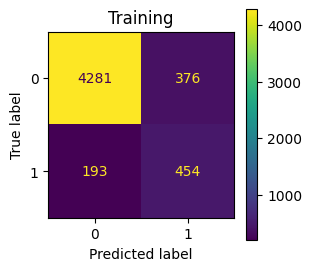

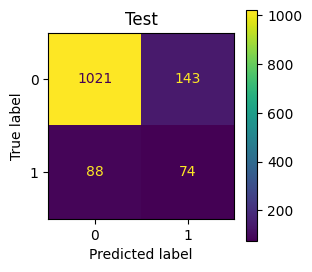

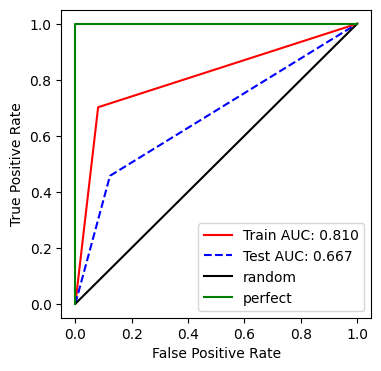

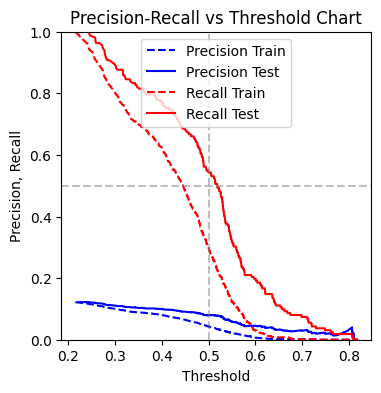

Couldn't extract feature importance!


(0.7017001545595054,
 0.6147596479350034,
 0.8104807407970385,
 0.8927224736048266,
 0.5469879518072289,
 0.4567901234567901,
 0.39050131926121373,
 0.6669689448899071,
 0.8257918552036199,
 0.34101382488479265)

In [21]:
model_path = model_path1
model_reload = Booster()
model_reload.load_model(model_path+"14_XGB_Grid0_Rand8_recall"+".json")
evaluate_model(y_train, y_test, X_train, X_test, model_reload, neuralnet=False, xgb=True)


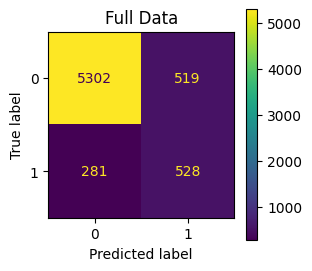

In [22]:
# all X was also scaled for the prediction
y_pred1 = model_reload.predict(DMatrix(X_all, y)).round(0)
y_pred = y_pred1.copy()
plot_confusion_matrix(y, y_pred, title="Full Data")

In [23]:
y-y_pred
(y-y_pred).value_counts()

#  0.0    5830
#  1.0     281 = missing allert
# -1.0     519 = erroneous alert

pv3_defect
 0.0    5830
-1.0     519
 1.0     281
Name: count, dtype: int64

#### Cumulative Rolling Predictions

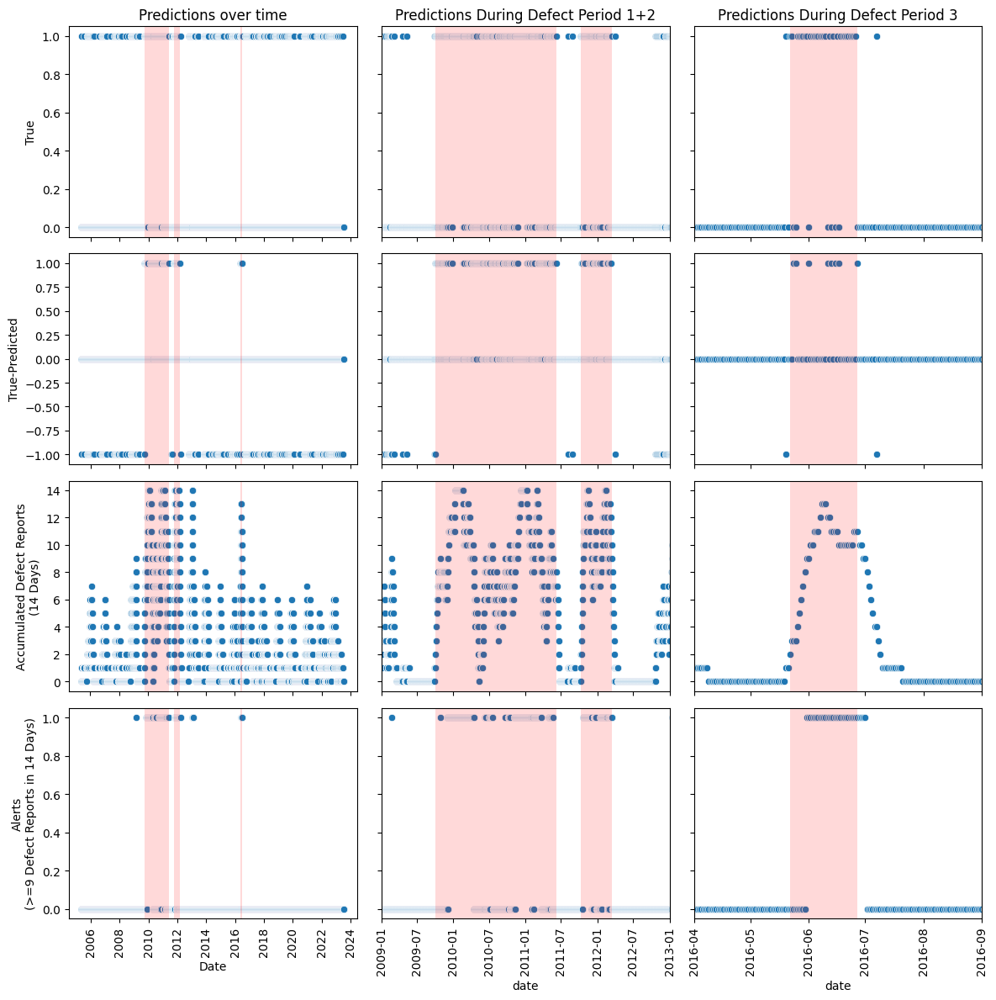

In [24]:
compound_viz(X,y,y_pred, time_window=14, alert_threshold=9)

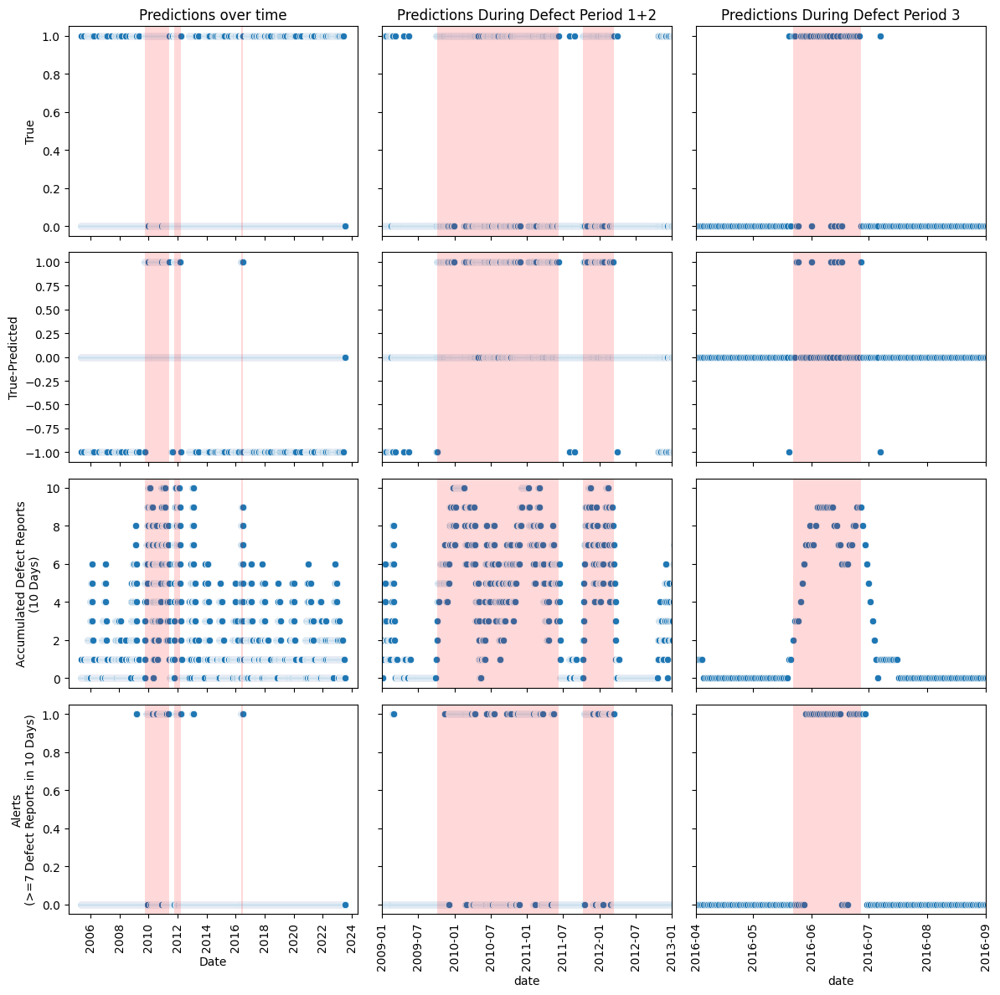

In [25]:
compound_viz(X,y,y_pred, time_window=10, alert_threshold=7)


1 of 1600 FP alerts
           date  y  y_pred  y_pred_sum
1378 2009-02-24  0     1.0         9.0
0 of 122 FP alerts
Empty DataFrame
Columns: [date, y, y_pred, y_pred_sum]
Index: []
22 of 1528 FP alerts
           date  y  y_pred  y_pred_sum
2494 2012-03-16  0     0.0        10.0
2495 2012-03-17  0     0.0         9.0
2799 2013-01-15  0     1.0         9.0
2800 2013-01-16  0     1.0        10.0
2801 2013-01-17  0     1.0        10.0
2802 2013-01-18  0     1.0        10.0
2803 2013-01-19  0     1.0        10.0
2804 2013-01-20  0     1.0        11.0
2805 2013-01-21  0     1.0        12.0
2806 2013-01-22  0     1.0        12.0
2807 2013-01-23  0     1.0        12.0
2808 2013-01-24  0     1.0        12.0
2809 2013-01-25  0     1.0        13.0
2810 2013-01-26  0     1.0        13.0
2811 2013-01-27  0     1.0        13.0
2812 2013-01-28  0     1.0        14.0
2813 2013-01-29  0     1.0        14.0
2814 2013-01-30  0     0.0        13.0
2815 2013-01-31  0     0.0        12.0
2816 2013-02-01  

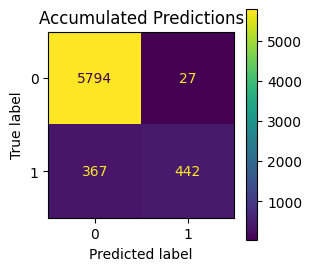

Raw predictions
 [[5302  519]
 [ 281  528]]
Accumulated predictions (threshold: 9 of 14 days)
 [[5794   27]
 [ 367  442]]

Recall: 0.54635
Precision: 0.94243
Accuracy: 0.94057


In [26]:
eval_accumulative_alerts(X, y, y_pred, alert_threshold=9, time_window=14, verbose=True)

#### Details for Model with 9/14 Threshold:

- 27 FPs - 5 due to lags, 2 singular event
    - 5 FP due to lags 2013-03-16 to 17  
                       2016-06-28 to 30 (3)  
    - 1 FP on 2009-02-24  
    - 20 FP between 2013-01-15 - 2013-02-03
    - 1 FP on 2016-07-01  
>
- 367 FNs - 41 due to lags!
    - \>20d lag for period 1
    - 11d lag for period 2
    - 9d lag for period 3

4 of 1600 FP alerts
0 of 122 FP alerts
19 of 1528 FP alerts
2 of 2571 FP alerts
--------------------------------------------------
25 FP in total!
5796 TN in total!

267 of 614 TP alerts - 347 FN
103 of 158 TP alerts - 55 FN
26 of 37 TP alerts - 11 FN
--------------------------------------------------
396 TP in total!
413 FN in total!



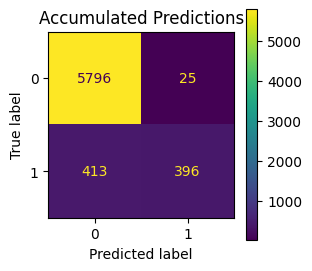

Raw predictions
 [[5302  519]
 [ 281  528]]
Accumulated predictions (threshold: 7 of 10 days)
 [[5796   25]
 [ 413  396]]

Recall: 0.48949
Precision: 0.94062
Accuracy: 0.93394


In [27]:
eval_accumulative_alerts(X, y, y_pred, alert_threshold=7, time_window=10)

### Reload Candidate Model 2

Recall Train:   0.7387944358578052
F1 Score Train: 0.616774193548387
AUC Train:      0.8237669838726432
Train:
[[4232  425]
 [ 169  478]]

Recall Test:   0.48148148148148145
F1 Score Test: 0.39
AUC Test:      0.6720122184039711
Test:
[[1004  160]
 [  84   78]]



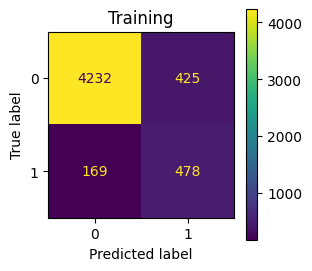

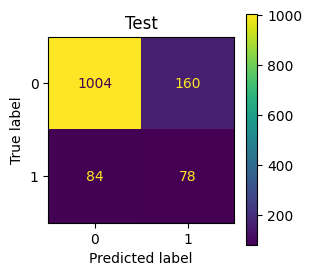

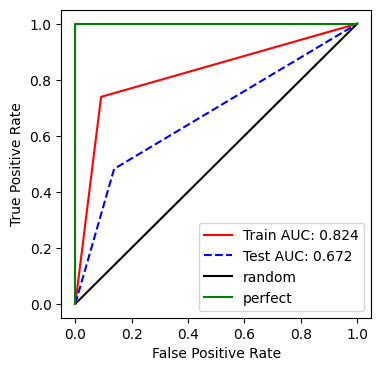

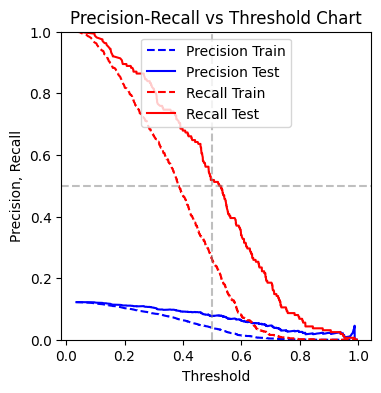

Couldn't extract feature importance!


(0.7387944358578052,
 0.616774193548387,
 0.8237669838726432,
 0.8880090497737556,
 0.5293466223698782,
 0.48148148148148145,
 0.39,
 0.6720122184039711,
 0.8159879336349924,
 0.3277310924369748)

In [28]:
model_path = model_path1
model_reload = Booster()
model_reload.load_model(model_path+"34_XGB_Grid1_Rand8_recall"+".json")
evaluate_model(y_train, y_test, X_train, X_test, model_reload, neuralnet=False, xgb=True)

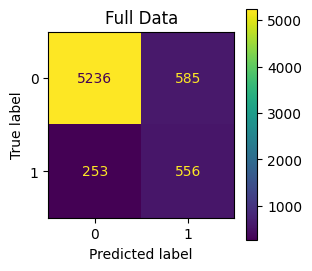

In [29]:
# all X was also scaled for the prediction
y_pred2 = model_reload.predict(DMatrix(X_all, y)).round(0)
y_pred = y_pred2.copy()
plot_confusion_matrix(y, y_pred, title="Full Data")

In [30]:
y-y_pred
(y-y_pred).value_counts()


pv3_defect
 0.0    5792
-1.0     585
 1.0     253
Name: count, dtype: int64

#### Cumulative Rolling Predictions

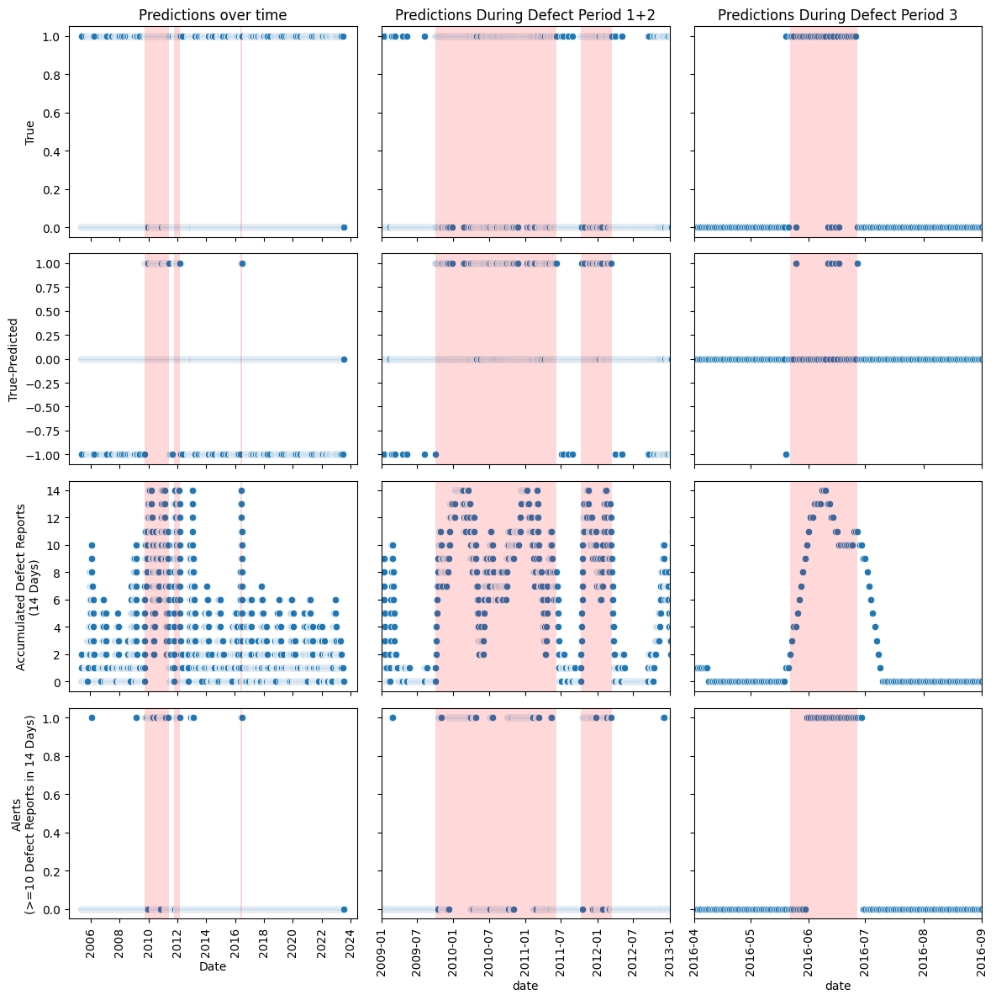

In [31]:
compound_viz(X,y,y_pred, time_window=14, alert_threshold=10)

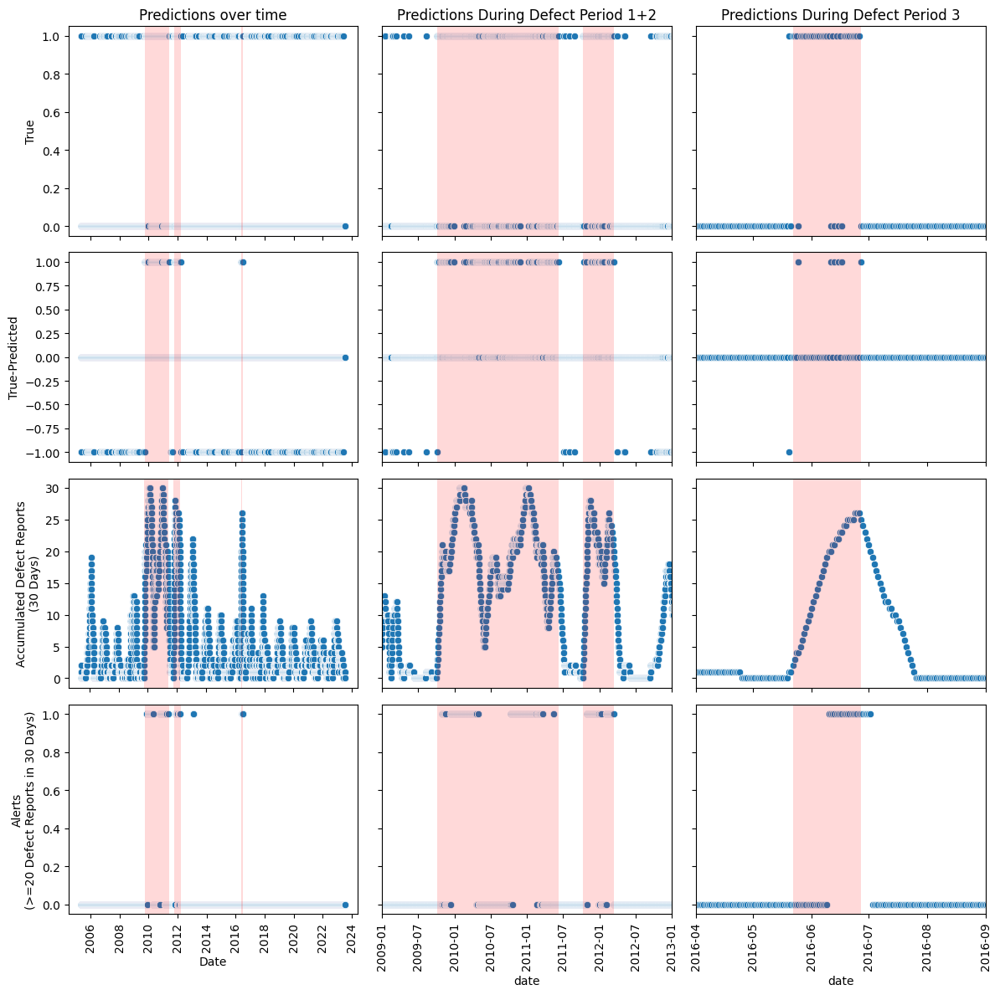

In [32]:
compound_viz(X,y,y_pred, time_window=30, alert_threshold=20)


6 of 1600 FP alerts
           date  y  y_pred  y_pred_sum
254  2006-01-27  0     1.0        10.0
255  2006-01-28  0     1.0        10.0
1378 2009-02-24  0     1.0        10.0
1379 2009-02-25  0     0.0        10.0
1380 2009-02-26  0     0.0        10.0
1381 2009-02-27  0     0.0        10.0
0 of 122 FP alerts
Empty DataFrame
Columns: [date, y, y_pred, y_pred_sum]
Index: []
21 of 1528 FP alerts
           date  y  y_pred  y_pred_sum
2753 2012-11-30  0     1.0        10.0
2754 2012-12-01  0     1.0        10.0
2755 2012-12-02  0     0.0        10.0
2756 2012-12-03  0     1.0        10.0
2801 2013-01-17  0     1.0        10.0
2802 2013-01-18  0     1.0        11.0
2803 2013-01-19  0     1.0        11.0
2804 2013-01-20  0     1.0        12.0
2805 2013-01-21  0     1.0        13.0
2806 2013-01-22  0     1.0        13.0
2807 2013-01-23  0     1.0        13.0
2808 2013-01-24  0     1.0        13.0
2809 2013-01-25  0     1.0        14.0
2810 2013-01-26  0     1.0        14.0
2811 2013-01-27  

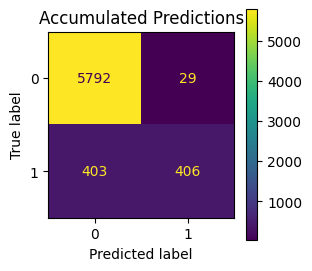

Raw predictions
 [[5236  585]
 [ 253  556]]
Accumulated predictions (threshold: 10 of 14 days)
 [[5792   29]
 [ 403  406]]

Recall: 0.50185
Precision: 0.93333
Accuracy: 0.93484


In [33]:
eval_accumulative_alerts(X, y, y_pred, alert_threshold=10, time_window=14, verbose=True)

#### Details for Model with 10/14 Threshold:

- 29 FPs - 2 due to lags, 3 short events
    - 2 FP due to lags 2016-06-28 to 29 (2)  
    - 2 FP between 2006-01-27 - 2006-01-28    
    - 4 FP between 2009-02-24 - 2009-02-287
    - 4 FP between 2012-11-30 - 2012-12-03    
    - 17 FP between 2013-01-17 - 2013-02-03    
>
- 405 FNs - 35 due to lags!
    - 14d lag for period 1
    - 10d lag for period 2
    - 11d lag for period 3

0 of 1600 FP alerts
0 of 122 FP alerts


12 of 1528 FP alerts
5 of 2571 FP alerts
--------------------------------------------------
17 FP in total!
5804 TN in total!

303 of 614 TP alerts - 311 FN
103 of 158 TP alerts - 55 FN
18 of 37 TP alerts - 19 FN
--------------------------------------------------
424 TP in total!
385 FN in total!



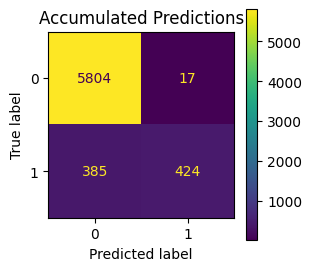

Raw predictions
 [[5236  585]
 [ 253  556]]
Accumulated predictions (threshold: 20 of 30 days)
 [[5804   17]
 [ 385  424]]

Recall: 0.52410
Precision: 0.96145
Accuracy: 0.93937


In [34]:
eval_accumulative_alerts(X, y, y_pred, alert_threshold=20, time_window=30)

### Reload Candidate Model 3

Recall Train:   0.8902627511591963
F1 Score Train: 0.7470817120622568
AUC Train:      0.9108818587232528
Train:
[[4338  319]
 [  71  576]]

Recall Test:   0.4506172839506173
F1 Score Test: 0.3893333333333333
AUC Test:      0.6651711849306351
Test:
[[1024  140]
 [  89   73]]



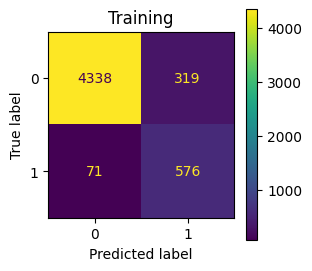

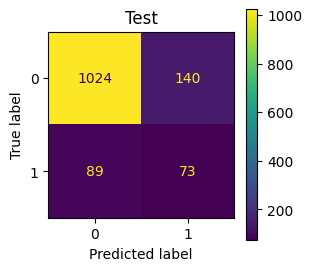

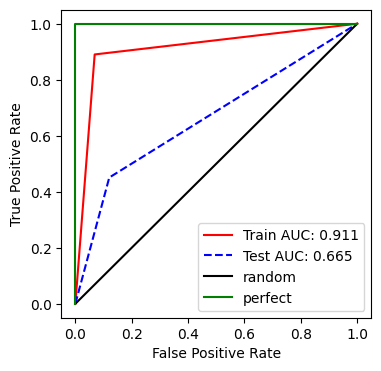

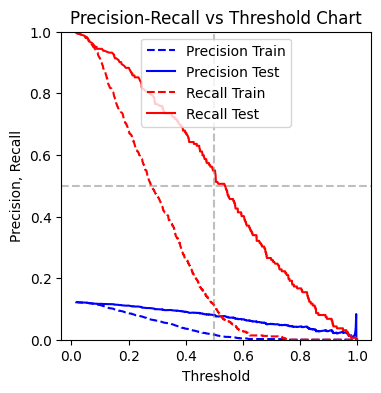

Couldn't extract feature importance!


(0.8902627511591963,
 0.7470817120622568,
 0.9108818587232528,
 0.9264705882352942,
 0.6435754189944134,
 0.4506172839506173,
 0.3893333333333333,
 0.6651711849306351,
 0.8273001508295625,
 0.3427230046948357)

In [35]:
model_path = model_path1
model_reload = Booster()
model_reload.load_model(model_path+"49_XGB_Grid2_Rand5_f1"+".json")
evaluate_model(y_train, y_test, X_train, X_test, model_reload, neuralnet=False, xgb=True)

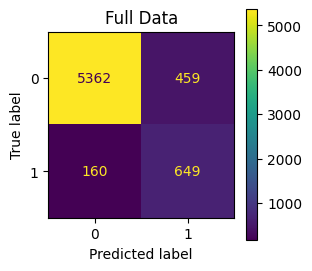

In [36]:
# all X was also scaled for the prediction
y_pred1 = model_reload.predict(DMatrix(X_all, y)).round(0)
y_pred = y_pred1.copy()
plot_confusion_matrix(y, y_pred, title="Full Data")

In [37]:
y-y_pred
(y-y_pred).value_counts()

pv3_defect
 0.0    6011
-1.0     459
 1.0     160
Name: count, dtype: int64

#### Cumulative Rolling Predictions

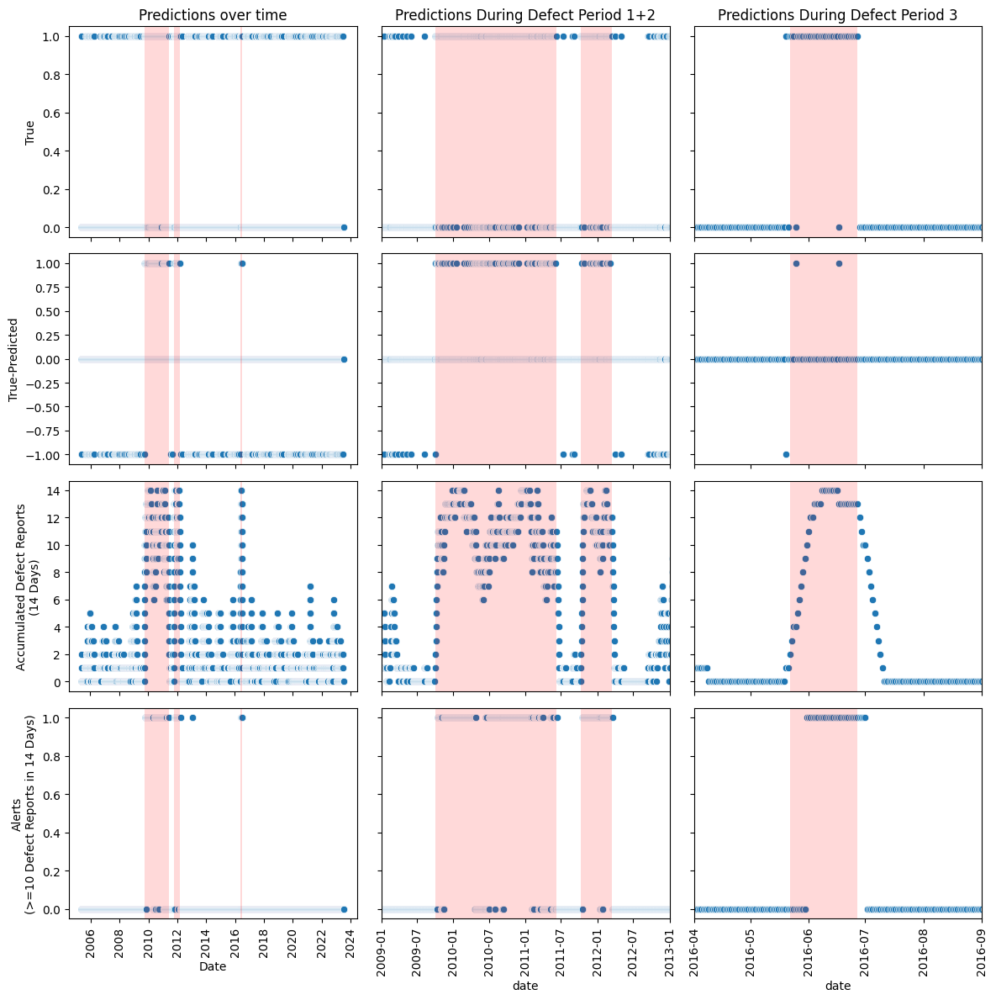

In [38]:
compound_viz(X,y,y_pred, time_window=14, alert_threshold=10)

0 of 1600 FP alerts
Empty DataFrame
Columns: [date, y, y_pred, y_pred_sum]
Index: []
3 of 122 FP alerts
           date  y  y_pred  y_pred_sum
2214 2011-06-10  0     0.0         8.0
2215 2011-06-11  0     0.0         7.0
2216 2011-06-12  0     0.0         7.0
13 of 1528 FP alerts
           date  y  y_pred  y_pred_sum
2494 2012-03-16  0     0.0         8.0
2495 2012-03-17  0     0.0         7.0
2496 2012-03-18  0     0.0         7.0
2801 2013-01-17  0     1.0         7.0
2802 2013-01-18  0     1.0         7.0
2807 2013-01-23  0     1.0         7.0
2808 2013-01-24  0     1.0         7.0
2809 2013-01-25  0     1.0         7.0
2810 2013-01-26  0     1.0         8.0
2811 2013-01-27  0     0.0         7.0
2812 2013-01-28  0     1.0         7.0
2813 2013-01-29  0     0.0         7.0
2814 2013-01-30  0     0.0         7.0
3 of 2571 FP alerts
           date  y  y_pred  y_pred_sum
4059 2016-06-28  0     0.0         9.0
4060 2016-06-29  0     0.0         8.0
4061 2016-06-30  0     0.0         7

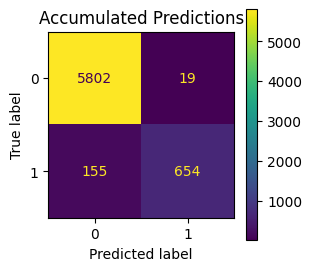

Raw predictions
 [[5362  459]
 [ 160  649]]
Accumulated predictions (threshold: 7 of 10 days)
 [[5802   19]
 [ 155  654]]

Recall: 0.80841
Precision: 0.97177
Accuracy: 0.97376


In [39]:
eval_accumulative_alerts(X, y, y_pred, alert_threshold=7, time_window=10, verbose=True)

#### Details for Model with 10/14 Threshold:

- 19 FPs - 2 due to lags, 3 short events
    - 9 FP due to lags 2011-06-10 to 12 (3)  
                       2012-03-16 to 18 (3)
                       2016-06-28 to 30 (3)
    - 10 FP between 2013-01-17 - 2013-01-30    

>
- 155 FNs - 18 due to lags!
    - 5d lag for period 1
    - 7d lag for period 2
    - 6d lag for period 3

0 of 1600 FP alerts
1 of 122 FP alerts
2 of 1528 FP alerts
2 of 2571 FP alerts
--------------------------------------------------
5 FP in total!
5816 TN in total!

372 of 614 TP alerts - 242 FN
121 of 158 TP alerts - 37 FN
30 of 37 TP alerts - 7 FN
--------------------------------------------------
523 TP in total!
286 FN in total!



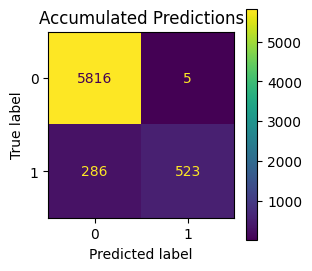

Raw predictions
 [[5362  459]
 [ 160  649]]
Accumulated predictions (threshold: 8 of 10 days)
 [[5816    5]
 [ 286  523]]

Recall: 0.64648
Precision: 0.99053
Accuracy: 0.95611


In [40]:
eval_accumulative_alerts(X, y, y_pred, alert_threshold=8, time_window=10,)


# GridSearch 2 with XGboost


  0_XGB_Grid0_Rand1_recall
[14:34:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:24] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:24] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:24] WARNING: /Users/runner/work/xgboost/xgboost/py

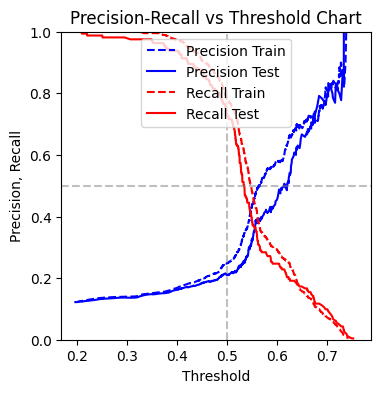

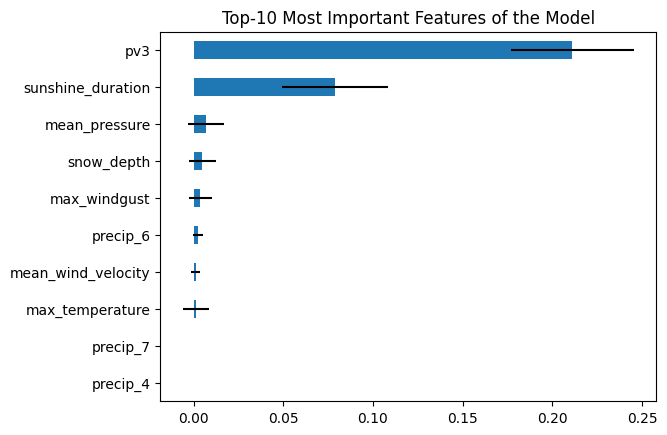


  1_XGB_Grid0_Rand1_f1
[14:34:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:36] WARNING: /Users/runner/work/xgboost/xgboost/python

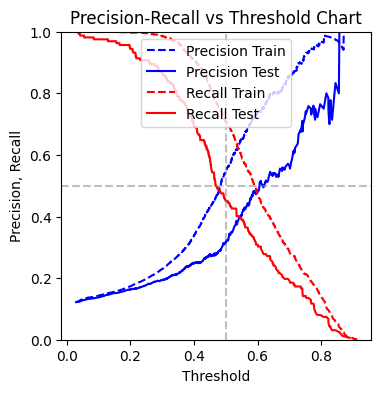

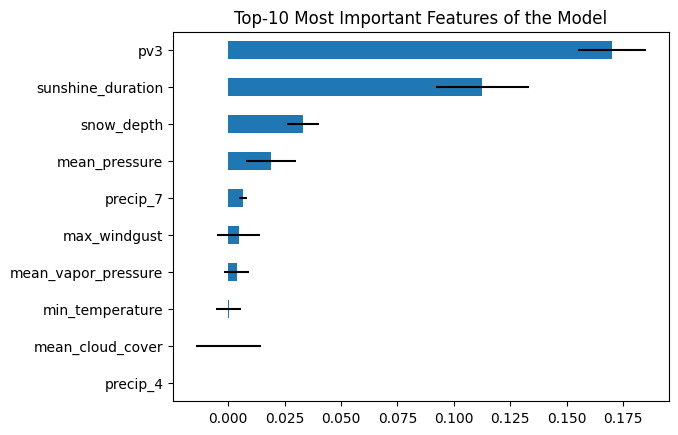


  2_XGB_Grid0_Rand2_recall
[14:34:43] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:44] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:44] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:44] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:44] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:45] WARNING: /Users/runner/work/xgboost/xgboost/py

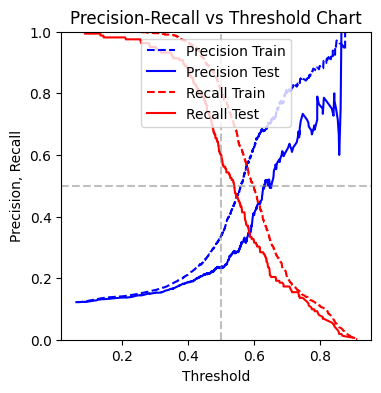

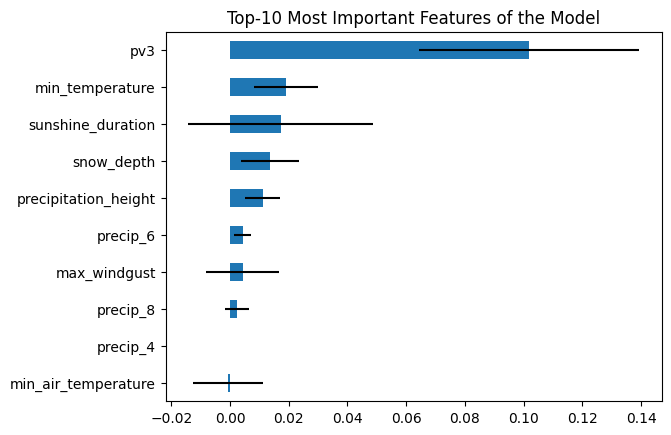


  3_XGB_Grid0_Rand2_f1
[14:34:51] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:51] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:51] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:52] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:52] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:52] WARNING: /Users/runner/work/xgboost/xgboost/python

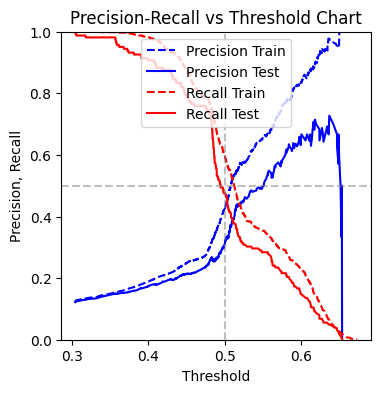

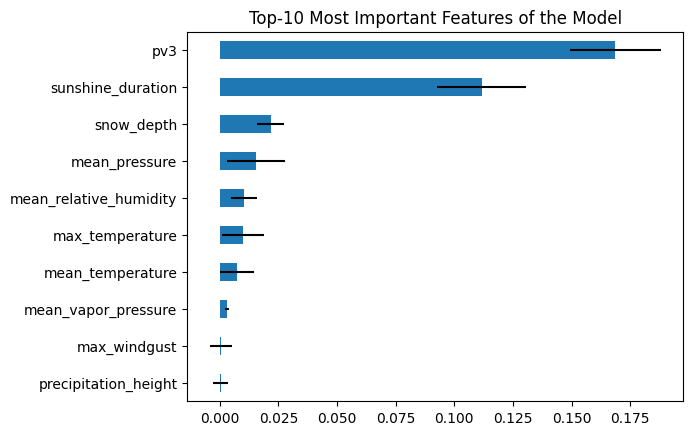


  4_XGB_Grid0_Rand3_recall
[14:34:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:34:59] WARNING: /Users/runner/work/xgboost/xgboost/py

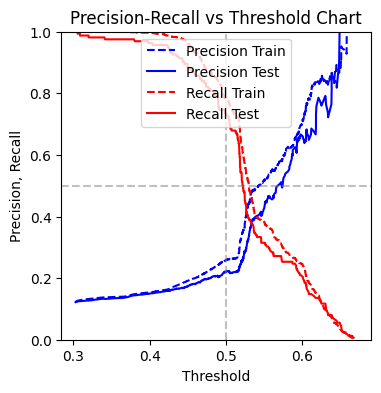

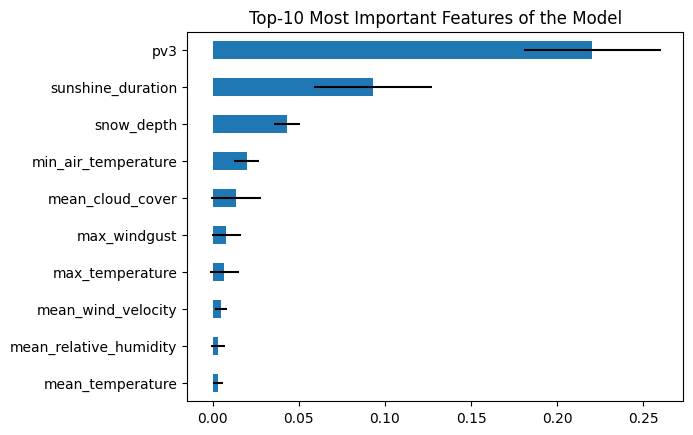


  5_XGB_Grid0_Rand3_f1
[14:35:07] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:07] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:07] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:08] WARNING: /Users/runner/work/xgboost/xgboost/python

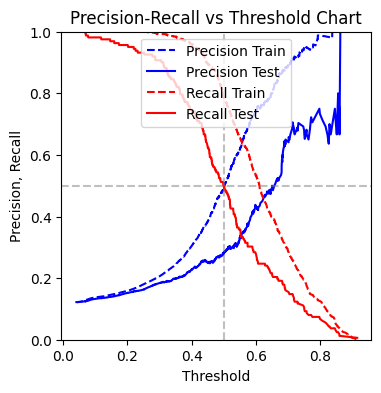

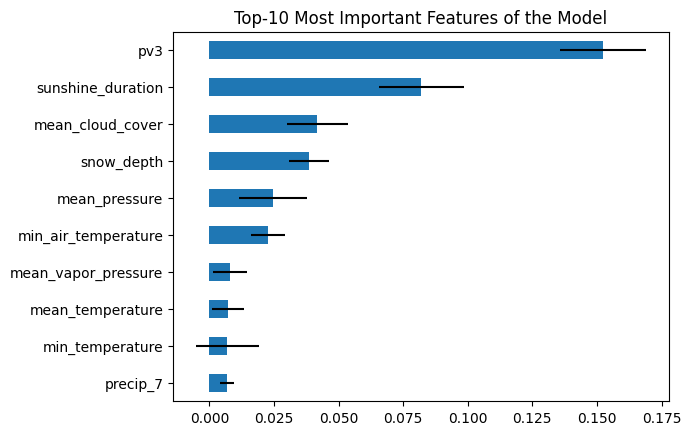


  6_XGB_Grid0_Rand4_recall
[14:35:15] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:15] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:15] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:16] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:16] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:16] WARNING: /Users/runner/work/xgboost/xgboost/py

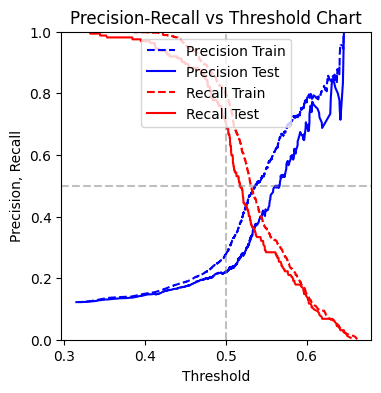

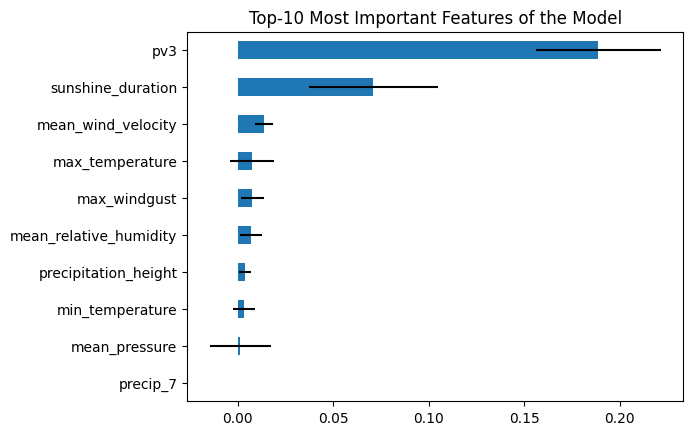


  7_XGB_Grid0_Rand4_f1
[14:35:22] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:22] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:22] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:23] WARNING: /Users/runner/work/xgboost/xgboost/python

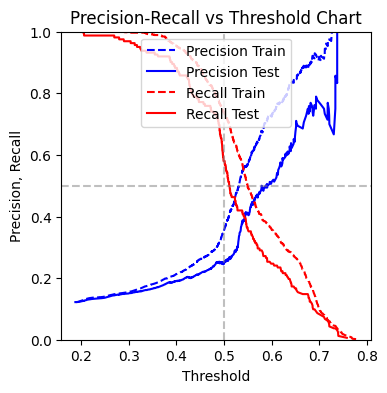

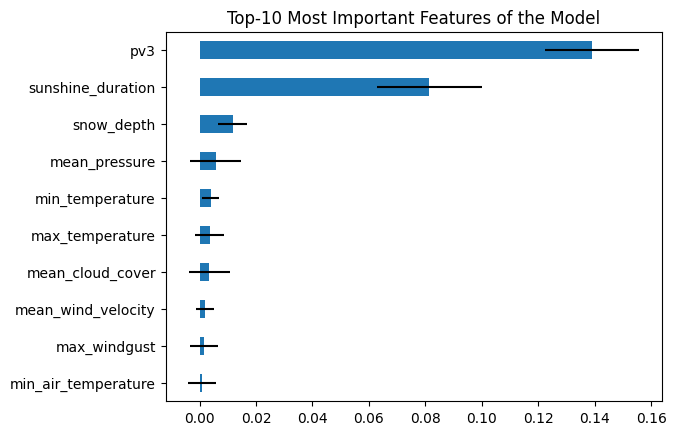


  8_XGB_Grid0_Rand5_recall
[14:35:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:30] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:30] WARNING: /Users/runner/work/xgboost/xgboost/py

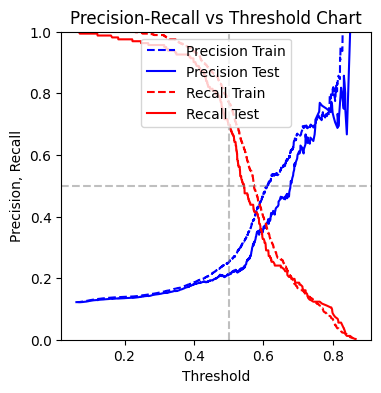

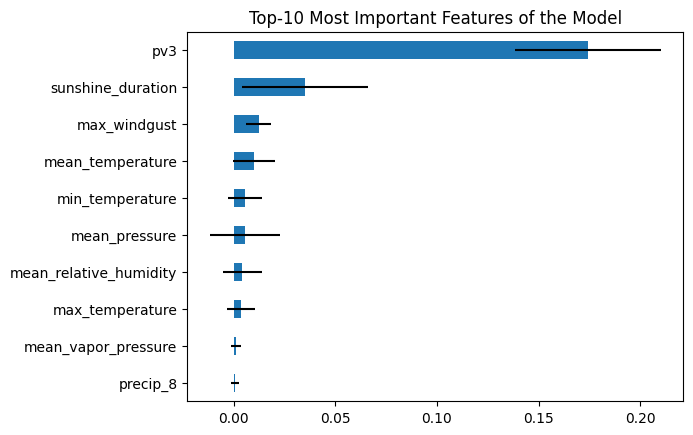


  9_XGB_Grid0_Rand5_f1
[14:35:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:36] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:36] WARNING: /Users/runner/work/xgboost/xgboost/python

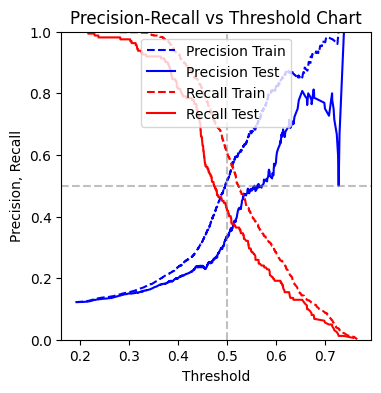

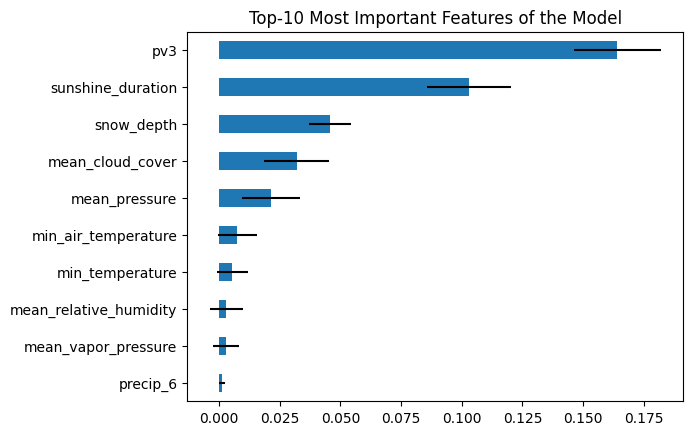


 10_XGB_Grid0_Rand6_recall
[14:35:41] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:41] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:42] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:42] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:42] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:42] WARNING: /Users/runner/work/xgboost/xgboost/py

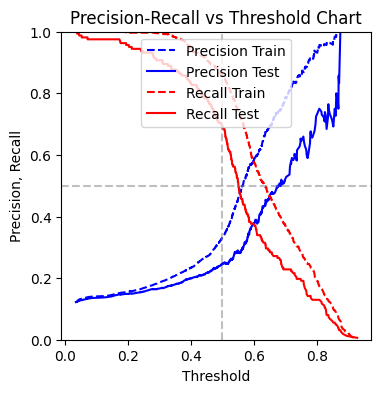

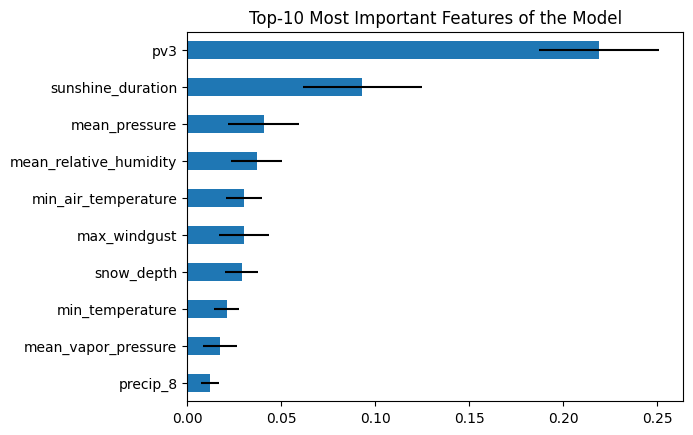


 11_XGB_Grid0_Rand6_f1
[14:35:48] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:49] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:49] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:49] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:49] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:49] WARNING: /Users/runner/work/xgboost/xgboost/python

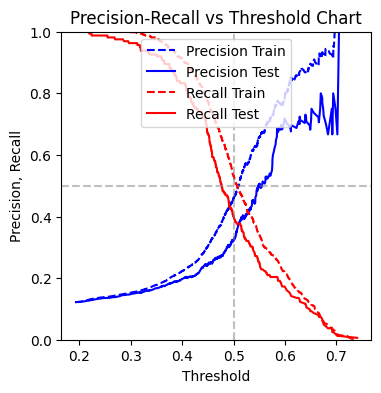

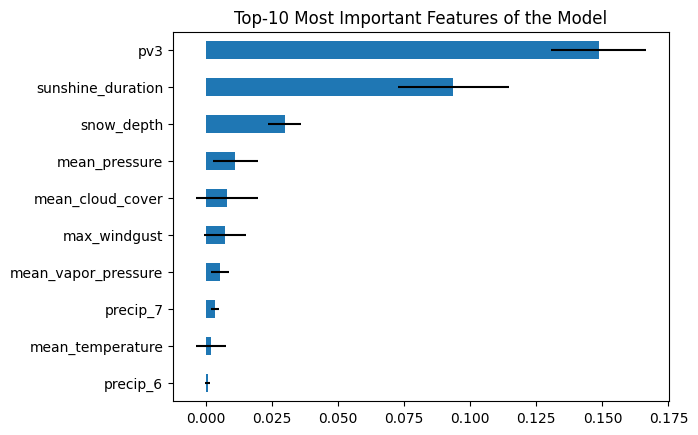


 12_XGB_Grid0_Rand7_recall
[14:35:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:35:56] WARNING: /Users/runner/work/xgboost/xgboost/py

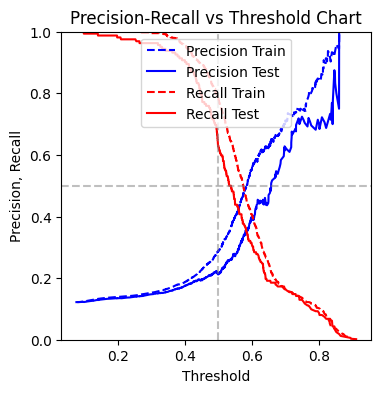

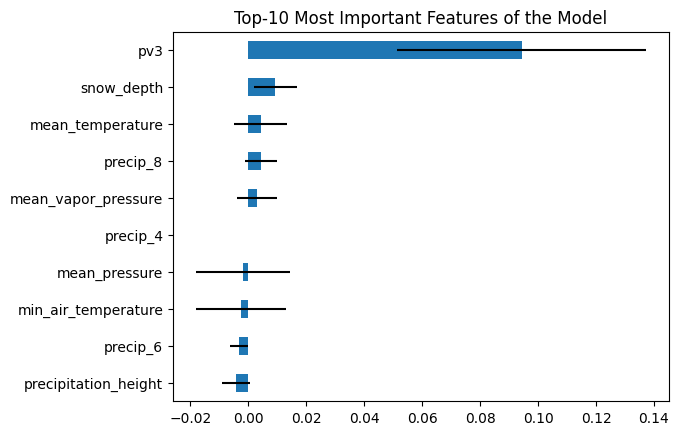


 13_XGB_Grid0_Rand7_f1
[14:36:01] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:02] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:02] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:02] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:02] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:02] WARNING: /Users/runner/work/xgboost/xgboost/python

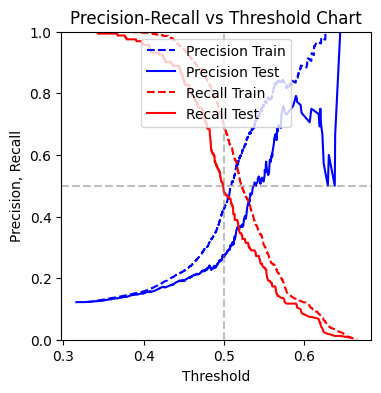

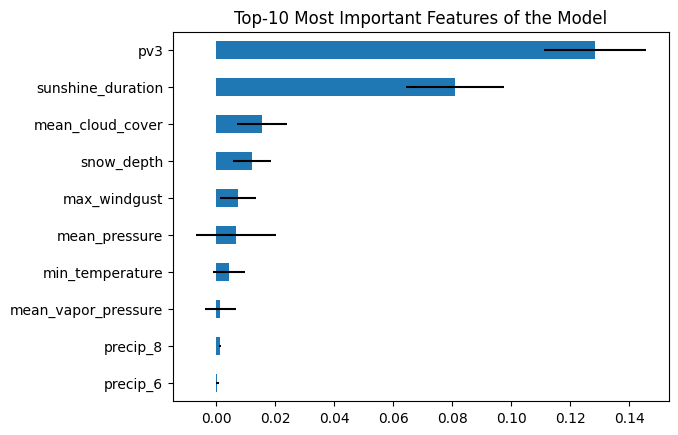


 14_XGB_Grid0_Rand8_recall
[14:36:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:09] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:09] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:09] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:09] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:09] WARNING: /Users/runner/work/xgboost/xgboost/py

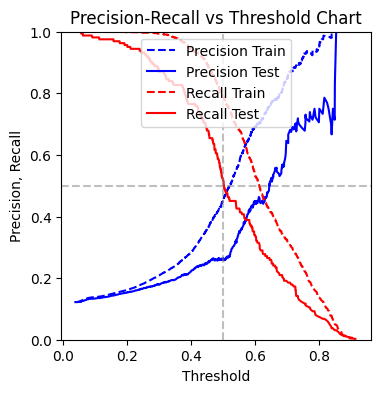

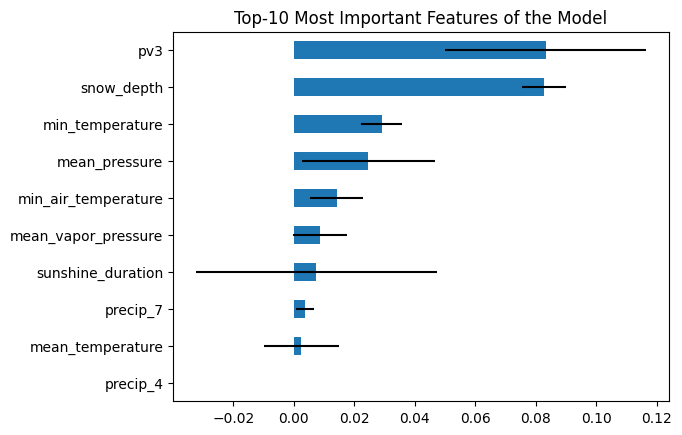


 15_XGB_Grid0_Rand8_f1
[14:36:16] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:16] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:16] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:16] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:17] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:17] WARNING: /Users/runner/work/xgboost/xgboost/python

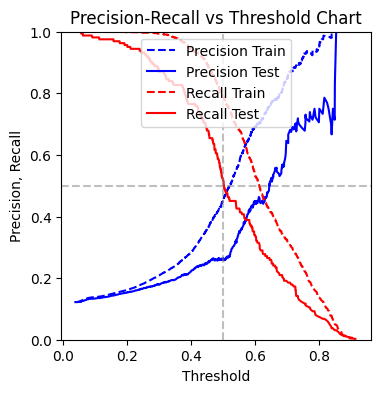

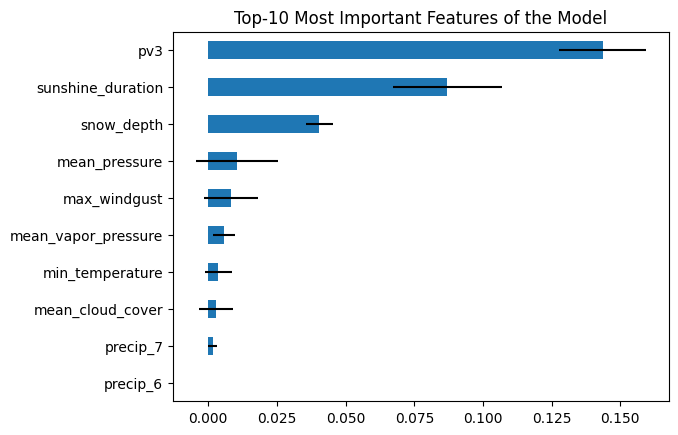


 16_XGB_Grid0_Rand9_recall
[14:36:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:24] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:24] WARNING: /Users/runner/work/xgboost/xgboost/py

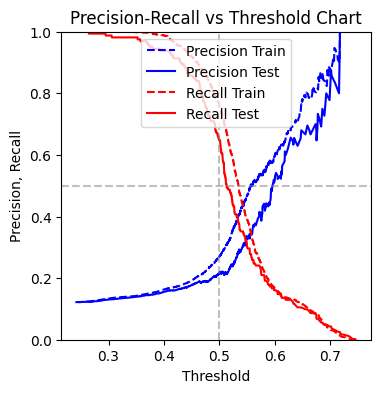

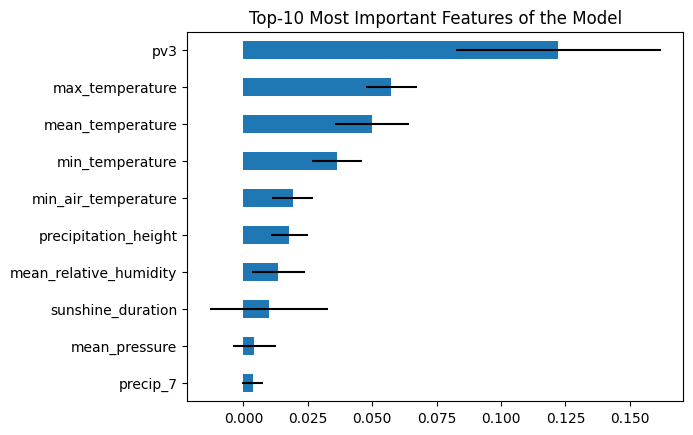


 17_XGB_Grid0_Rand9_f1
[14:36:30] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:30] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:30] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:30] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:31] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:31] WARNING: /Users/runner/work/xgboost/xgboost/python

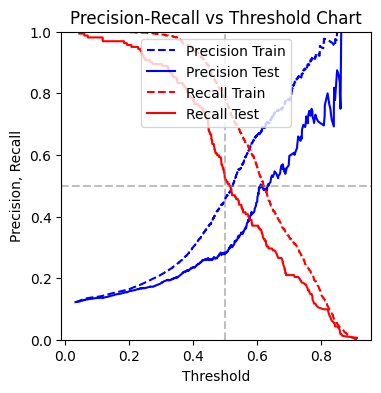

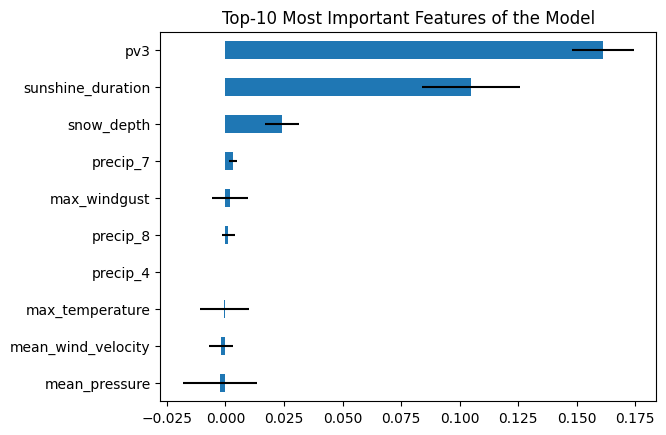


 18_XGB_Grid0_Rand10_recall
[14:36:37] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:37] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:37] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:37] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:38] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:38] WARNING: /Users/runner/work/xgboost/xgboost/p

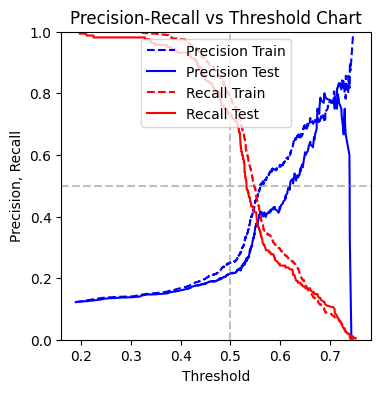

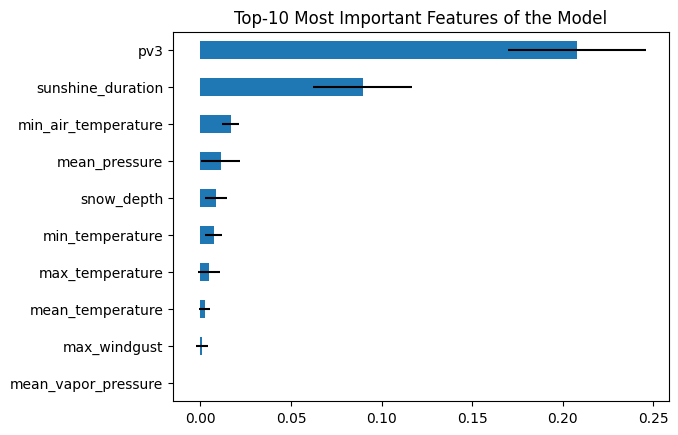


 19_XGB_Grid0_Rand10_f1
[14:36:44] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:44] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:44] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:44] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "growpolicy" } are not used.

[14:36:45] WARNING: /Users/runner/work/xgboost/xgboost/pytho

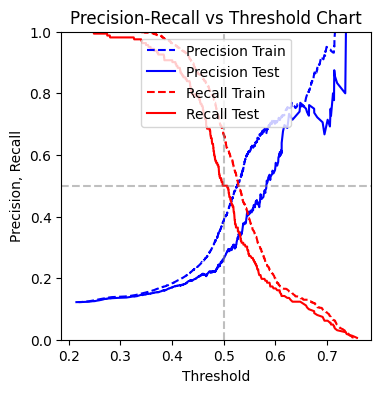

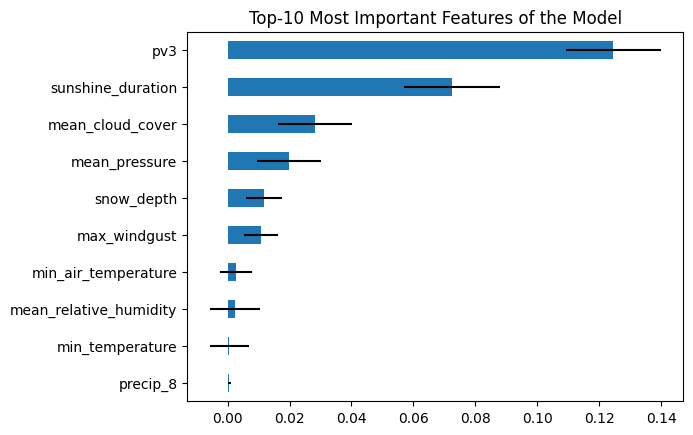

In [41]:
# runtime approx. 3 min

model_path = model_path2
logfile = logfile2

# hyperparameter grid - acc. to https://xgboost.readthedocs.io/en/stable/parameter.html - runs 2-3 min
NEW_PARAMETERS = {
    'learning_rate': [.005, .01, .03], #.3 
    'lambda': [.6,.8,1], #0
    'alpha': [0,.1,.2,.3,.4,.5,.6], #0
    'subsample': [.5,.6,.7,.75,.8,.85,.9,.95,1],
    'colsample_bytree': [.6,.7,.8,.9,1], 
    'scale_pos_weight': [3,5,6,7], 
    'colsample_bylevel': [.7,.8,.9,1], 
    'min_child_weight': [.5,1,3,5], 
    'max_depth': [3,4,5,6], 
    'growpolicy': ["depthwise", 'lossguide'], 
    }# refined - value range acc. to best models so far

PARAMETERS3 = {
    "n_estimators": [5,10,20,50,100,200,500,1000],
    "learning_rate": [.01,.03,.1,.3,.5,1,2], # default .3 (eta)
    "min_child_weight":[1,2,3,4,5], # default 1, min weight sum
    "max_depth": [4,6,8,10], # default 6
    "subsample": [.5,.7,.8,1], # default 1 - subsampling training instances if <1 to prevent overfitting
    "colsample_bytree": [.6,.8,1], # default 1 - subsampling columns once per tree
    "colsample_bylevel": [.6,.8,1], # default 1 - subsampling columns once per level
    "lambda": [.4,.6,.8,1], # default 1 - l2 regularization
    "alpha": [0,.2,.4,.6], # default 0 - l1 regularization
    "growpolicy": ['depthwise', 'lossguide'],
    "scale_pos_weight": [1,2,3,4,5,7], # scale for imbalance
    } # 9216 combinations * 3 cv


outfile=open(model_path+logfile, 'w')

grids = [NEW_PARAMETERS]

index = -1
for idx in range(len(grids)):
    parameters = grids[idx]
    for factor in range(1,11):
        for metric in ["recall", "f1"]:

            index += 1
            name = "%2d_XGB_Grid%d_Rand%d_%s" % (index, idx, factor, metric)
            print("\n", name)

            classifier = XGBClassifier(n_jobs=-1, eval_metric='logloss')#, early_stopping_rounds=10)

            model = RandomizedSearchCV(estimator=classifier,
                                       param_distributions=parameters,
                                       cv=3, random_state=RSEED*factor,
                                       scoring=metric, verbose=0)

            model.fit(X_train, y_train, verbose=0)

            print(model.best_params_)
            
            # metrics for train (1) and test (2)
            r1,f1,a1,ac1,p1,r2,f2,a2,ac2,p2 = evaluate_model(y_train, y_test, X_train, X_test, model, 
                                                       neuralnet=False, plotting=False, 
                                                       save_tag=str(index), outdir=model_path)

            if r2>0.4 and f2>0.3:
                # save to JSON
                model.best_estimator_.save_model(model_path+"%s.json" % name)
                # save to text format
                model.best_estimator_.save_model(model_path+"%s.txt" % name)
                save_tag="saved"
            else:
                save_tag="not-saved"
            
            outfile.write(";".join([str(x) for x in [index,name,r1,f1,a1,ac1,p1,r2,f2,a2,ac2,p2,save_tag,model.best_params_]])+"\n")

outfile.close()


### Evaluate Tuned XGboost Models

In [42]:
# check file
infile=open(model_path2+logfile2, 'r')
for line in infile:
    if len(line.split(";")) != 14:
        print(len(line.split(";")), end=" ")
        print(line.strip())
infile.close()

In [43]:
df_log2 = pd.read_csv(model_path2+logfile2, sep=";", header=None)
df_log2.columns = ["idx", "title", "recall_train", "f1_train", "auc_train", "accur_train", "prec_train",
                                  "recall_test", "f1_test", "auc_test", "accur_test", "prec_test", "status", "params"]
df_log2.head()

# filter good models and duplicates
df_log2 = df_log2[df_log2.status == "saved"]
df_log2.drop_duplicates(subset=df_log2.columns.difference(['idx', "title"]), inplace=True) # 11 duplicates
print(df_log2.shape)

(19, 14)


In [44]:
df_log2.head()

,idx,title,recall_train,f1_train,auc_train,accur_train,prec_train,recall_test,f1_test,auc_test,accur_test,prec_test,status,params
0,0,0_XGB_Grid0_Rand1_recall,0.782071,0.377049,0.726659,0.684766,0.248405,0.728395,0.325517,0.673046,0.631222,0.209591,saved,"{'subsample': 0.9, 'scale_pos_weight': 7, 'min..."
1,1,1_XGB_Grid0_Rand1_f1,0.709428,0.618598,0.814130,0.893288,0.548387,0.450617,0.371501,0.657439,0.813725,0.316017,saved,"{'subsample': 0.85, 'scale_pos_weight': 5, 'mi..."
2,2,2_XGB_Grid0_Rand2_recall,0.811437,0.474041,0.793737,0.780354,0.334821,0.598765,0.336222,0.662785,0.711161,0.233735,saved,"{'subsample': 0.95, 'scale_pos_weight': 7, 'mi..."
3,3,3_XGB_Grid0_Rand2_f1,0.599691,0.500322,0.744445,0.853884,0.429204,0.475309,0.375610,0.664201,0.806938,0.310484,saved,"{'subsample': 0.85, 'scale_pos_weight': 5, 'mi..."
4,4,4_XGB_Grid0_Rand3_recall,0.783617,0.388953,0.735807,0.699661,0.258673,0.734568,0.340000,0.687301,0.651584,0.221190,saved,"{'subsample': 1, 'scale_pos_weight': 7, 'min_c..."


In [45]:
df_log2.query("recall_test>0.45 & recall_train>0.45 & f1_train>0.35 & f1_test>0.35").reset_index(drop=True)

,idx,title,recall_train,f1_train,auc_train,accur_train,prec_train,recall_test,f1_test,auc_test,accur_test,prec_test,status,params
0,1,1_XGB_Grid0_Rand1_f1,0.709428,0.618598,0.814130,0.893288,0.548387,0.450617,0.371501,0.657439,0.813725,0.316017,saved,"{'subsample': 0.85, 'scale_pos_weight': 5, 'mi..."
1,3,3_XGB_Grid0_Rand2_f1,0.599691,0.500322,0.744445,0.853884,0.429204,0.475309,0.375610,0.664201,0.806938,0.310484,saved,"{'subsample': 0.85, 'scale_pos_weight': 5, 'mi..."
2,5,5_XGB_Grid0_Rand3_f1,0.786708,0.606313,0.837202,0.875377,0.493217,0.500000,0.361607,0.661942,0.784314,0.283217,saved,"{'subsample': 0.7, 'scale_pos_weight': 6, 'min..."
3,10,10_XGB_Grid0_Rand6_recall,0.856260,0.479032,0.808740,0.772813,0.332533,0.691358,0.363047,0.698342,0.703620,0.246154,saved,"{'subsample': 1, 'scale_pos_weight': 7, 'min_c..."
4,17,17_XGB_Grid0_Rand9_f1,0.782071,0.574347,0.825650,0.858597,0.453812,0.524691,0.364807,0.668274,0.776772,0.279605,saved,"{'subsample': 0.75, 'scale_pos_weight': 6, 'mi..."


In [46]:
df_log2 = df_log2.query("recall_test>0.45 & recall_train>0.45 & f1_train>0.35 & f1_test>0.35").reset_index(drop=True)
df_log2.sort_values(by=["f1_test", "recall_test"], ascending=False)

,idx,title,recall_train,f1_train,auc_train,accur_train,prec_train,recall_test,f1_test,auc_test,accur_test,prec_test,status,params
1,3,3_XGB_Grid0_Rand2_f1,0.599691,0.500322,0.744445,0.853884,0.429204,0.475309,0.375610,0.664201,0.806938,0.310484,saved,"{'subsample': 0.85, 'scale_pos_weight': 5, 'mi..."
0,1,1_XGB_Grid0_Rand1_f1,0.709428,0.618598,0.814130,0.893288,0.548387,0.450617,0.371501,0.657439,0.813725,0.316017,saved,"{'subsample': 0.85, 'scale_pos_weight': 5, 'mi..."
4,17,17_XGB_Grid0_Rand9_f1,0.782071,0.574347,0.825650,0.858597,0.453812,0.524691,0.364807,0.668274,0.776772,0.279605,saved,"{'subsample': 0.75, 'scale_pos_weight': 6, 'mi..."
3,10,10_XGB_Grid0_Rand6_recall,0.856260,0.479032,0.808740,0.772813,0.332533,0.691358,0.363047,0.698342,0.703620,0.246154,saved,"{'subsample': 1, 'scale_pos_weight': 7, 'min_c..."
2,5,5_XGB_Grid0_Rand3_f1,0.786708,0.606313,0.837202,0.875377,0.493217,0.500000,0.361607,0.661942,0.784314,0.283217,saved,"{'subsample': 0.7, 'scale_pos_weight': 6, 'min..."


In [47]:
# plot metrics
fig = px.scatter(df_log2, x="recall_train", y="recall_test", hover_data=["title", "f1_train", "f1_test", "idx"],
                 color=df_log2.accur_test)
fig.show()
fig = px.scatter(df_log2, x="f1_train", y="f1_test", hover_data=["title", "recall_train", "recall_test", "idx"],
                 color=df_log2.accur_test)
fig.show()
fig = px.scatter(df_log2, x="auc_train", y="auc_test", hover_data=["title", "idx"],
                 color=df_log2.accur_test)
fig.show()
fig = px.scatter(df_log2, x="accur_train", y="accur_test", hover_data=["title", "idx"],
                 color=df_log2.accur_test)
fig.show()
fig = px.scatter(df_log2, x="accur_test", y="recall_test", hover_data=["title", "idx"],
                 color=df_log2.accur_test)
fig.show()
fig = px.scatter(df_log2, x="accur_train", y="recall_train", hover_data=["title", "idx"],
                 color=df_log2.accur_test)
fig.show()


df_log2["sumscore_train"] = df_log2.accur_train + df_log2.recall_train 
df_log2["sumscore_test"] = df_log2.accur_test + df_log2.recall_test
df_log2["train_test_diffs"] =  df_log2.accur_train - df_log2.accur_test + df_log2.recall_train - df_log2.recall_test
df_log2["score_sum"] = df_log2.accur_train + df_log2.recall_train + df_log2.accur_test + df_log2.recall_test
df_log2["f1_sum"] = df_log2.f1_train + df_log2.f1_test
# fig = px.scatter(df_log2, x="sumscore_train", y="sumscore_test", hover_data=["title", "accur_train", "accur_test", "recall_train", "recall_test"],
#                  color=df_log2.index)
fig = px.scatter(df_log2, x="score_sum", y="train_test_diffs", 
                 hover_data=["title", "accur_train", "accur_test", "recall_train", "recall_test", "f1_train", "f1_test", "idx"],
                 color=df_log2.recall_test)
fig.show()
# fig = px.scatter(x=df.iloc[1], y=df.iloc[4], hover_data=df.iloc[0])
# fig.set_title("Recall")

## Reload Candidate Model 4

Recall Train:   0.7094281298299846
F1 Score Train: 0.6185983827493262
AUC Train:      0.8141299979190721
Train:
[[4279  378]
 [ 188  459]]

Recall Test:   0.4506172839506173
F1 Score Test: 0.37150127226463103
AUC Test:      0.6574392261677485
Test:
[[1006  158]
 [  89   73]]



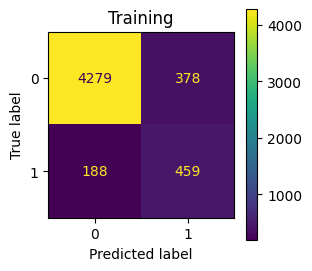

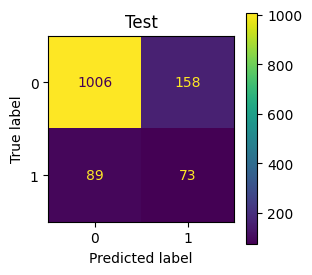

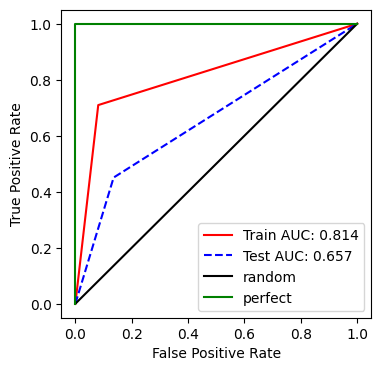

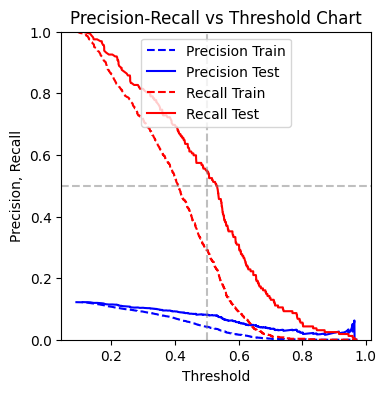

Couldn't extract feature importance!


(0.7094281298299846,
 0.6185983827493262,
 0.8141299979190721,
 0.8932880844645551,
 0.5483870967741935,
 0.4506172839506173,
 0.37150127226463103,
 0.6574392261677485,
 0.8137254901960784,
 0.31601731601731603)

In [48]:
model_path = model_path2
model_reload = Booster()
model_reload.load_model(model_path+" 1_XGB_Grid0_Rand1_f1"+".json")
evaluate_model(y_train, y_test, X_train, X_test, model_reload, neuralnet=False, xgb=True)


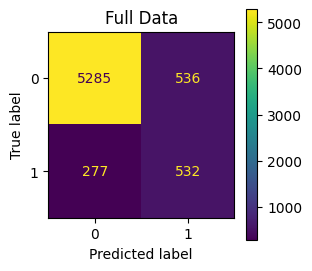

In [49]:
# all X was also scaled for the prediction
y_pred3 = model_reload.predict(DMatrix(X_all, y)).round(0)
y_pred = y_pred3.copy()
plot_confusion_matrix(y, y_pred, title="Full Data")

In [50]:
y-y_pred
(y-y_pred).value_counts()


pv3_defect
 0.0    5817
-1.0     536
 1.0     277
Name: count, dtype: int64

#### Cumulative Rolling Predictions

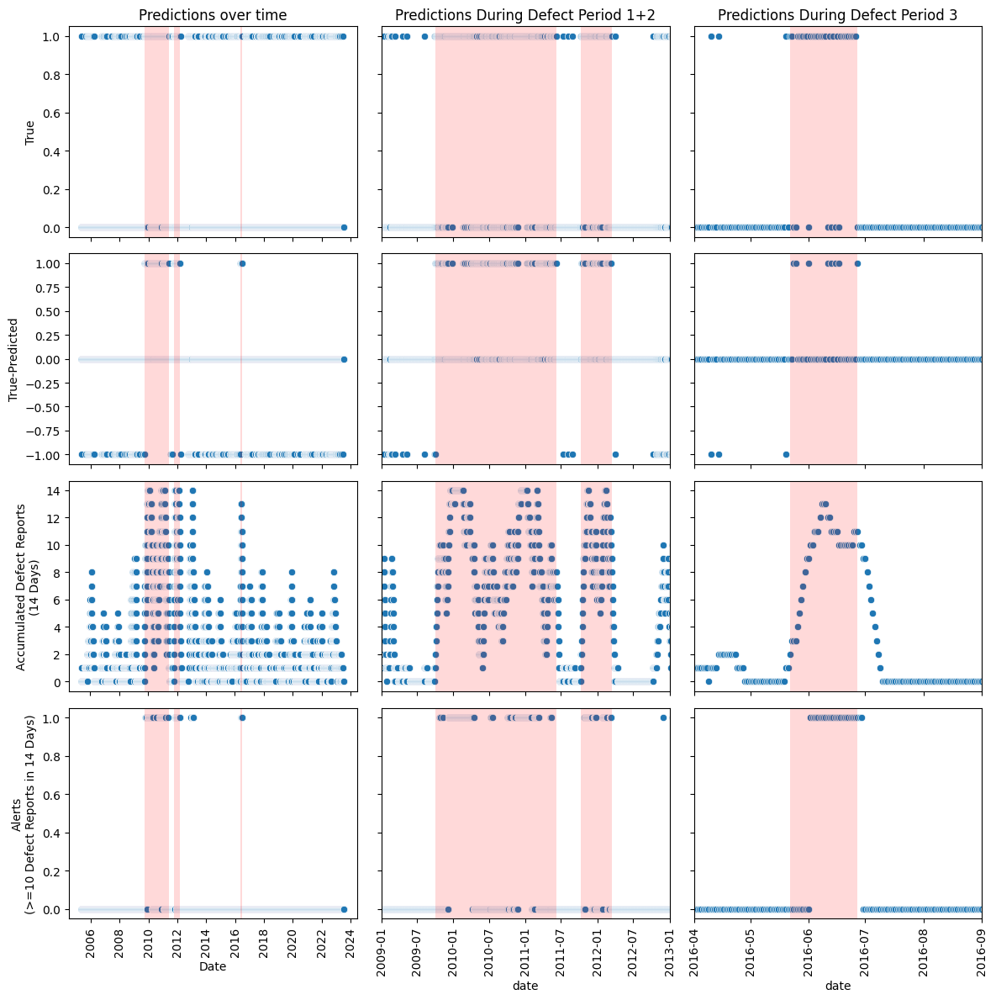

In [51]:
compound_viz(X,y,y_pred, time_window=14, alert_threshold=10)

0 of 1600 FP alerts
Empty DataFrame
Columns: [date, y, y_pred, y_pred_sum]
Index: []
0 of 122 FP alerts
Empty DataFrame
Columns: [date, y, y_pred, y_pred_sum]
Index: []
17 of 1528 FP alerts
           date  y  y_pred  y_pred_sum
2754 2012-12-01  0     1.0        10.0
2802 2013-01-18  0     1.0        10.0
2803 2013-01-19  0     1.0        11.0
2804 2013-01-20  0     1.0        12.0
2805 2013-01-21  0     1.0        13.0
2806 2013-01-22  0     1.0        13.0
2807 2013-01-23  0     1.0        13.0
2808 2013-01-24  0     1.0        13.0
2809 2013-01-25  0     1.0        14.0
2810 2013-01-26  0     1.0        14.0
2811 2013-01-27  0     1.0        14.0
2812 2013-01-28  0     1.0        14.0
2813 2013-01-29  0     1.0        14.0
2814 2013-01-30  0     0.0        13.0
2815 2013-01-31  0     0.0        12.0
2816 2013-02-01  0     0.0        11.0
2817 2013-02-02  0     0.0        10.0
2 of 2571 FP alerts
           date  y  y_pred  y_pred_sum
4059 2016-06-28  0     0.0        10.0
4060 2016-

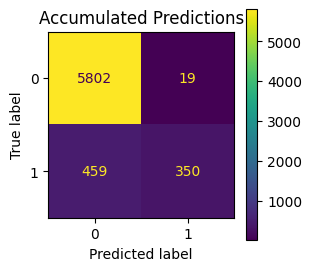

Raw predictions
 [[5285  536]
 [ 277  532]]
Accumulated predictions (threshold: 10 of 14 days)
 [[5802   19]
 [ 459  350]]

Recall: 0.43263
Precision: 0.94851
Accuracy: 0.92790


In [52]:
eval_accumulative_alerts(X, y, y_pred, alert_threshold=10, time_window=14, verbose=True)

#### Details for Model with 10/14 Threshold:

- 13 FPs - 8 due to lags, 1 medium events
    - 8 FP due to lags 2011-06-10 to 11 (2)  
                       2012-03-16 to 18 (3)  
                       2016-06-28 to 30 (3)  
    - 4 FP between 2013-01-25 - 2013-01-28   
    - 1 FP on 2016-07-01    
>
- 242 FNs - 29 due to lags!
    - 10d lag for period 1
    - 10d lag for period 2
    - 9d lag for period 3

5 of 1600 FP alerts
0 of 122 FP alerts
21 of 1528 FP alerts
3 of 2571 FP alerts
--------------------------------------------------
29 FP in total!
5792 TN in total!

257 of 614 TP alerts - 357 FN
79 of 158 TP alerts - 79 FN
24 of 37 TP alerts - 13 FN
--------------------------------------------------
360 TP in total!
449 FN in total!



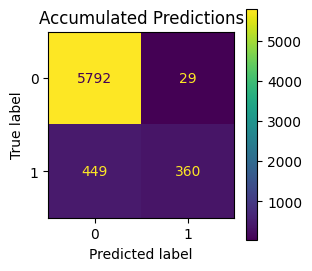

Raw predictions
 [[5285  536]
 [ 277  532]]
Accumulated predictions (threshold: 8 of 11 days)
 [[5792   29]
 [ 449  360]]

Recall: 0.44499
Precision: 0.92545
Accuracy: 0.92790


In [53]:
eval_accumulative_alerts(X, y, y_pred, alert_threshold=8, time_window=11)

# Notes

1. exclude sensor
    - clearly improved results when excluding sensor variable (kind of leakage)
    - yet: many false positives and some false negatives
>
2. accumulate defect predictions
    - idea: defects persist &rarr; sum up predictions over 10 days and apply thresholds
    - approach: rolling sum (last 14 days) + threshold (>= 10 defects predicted)
    - clearly less FP, but some lagging
>
3. evaluate optimized cumulative models from Gridsearch
    - 4 models tested (full data, >= 10/14 defects predicted)
    - all models: clearly improved precision and accuracy
    - some models: reduced recall
    - note: lags explain a certain fraction of FP and FN
>
&rarr; all four models are quite good 

# Next Steps

- evaluate model performance
    - plot test and train separately
    - apply model to other groups
    - apply model to group 2 with artificial defects
>
- generalize model (independent of location, capacity, technology, ...)
    - generalized input: % production relative to previous day
>
- try to improve precision & recall and handling of imbalanced data - nice website [here](https://medium.com/@rithpansanga/improving-precision-and-recall-in-machine-learning-tips-and-techniques-acb5a5fd27a6#:~:text=In%20conclusion%2C%20there%20are%20several,class%20weights%2C%20and%20using%20ensembling.) and [there](https://machinelearningmastery.com/threshold-moving-for-imbalanced-classification/)
    - feature selection - according to [DWD description](https://www.dwd.de/DE/leistungen/klimadatendeutschland/beschreibung_tagesmonatswerte.html) 
    >&rarr; see other notebook
    - over/undersampling (e.g. balanced random forest)
    - weekly/daily resembling
>
- neural networks fine tuning as described [here](https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/)


# Other Analyses
- periodiogram for our data
- neural network for other solar data + weather
